<div style="display:block;width:100%;margin:auto;" direction=rtl align=center><br><br>
    <div  style="width:100%;margin:100;display:block;background-color:#fff0;"  display=block align=center>
        <table style="border-style:hidden;border-collapse:collapse;">
            <tr>
                <td  style="border: none!important;">
                    <img width=130 align=right src="https://i.ibb.co/yXKQmtZ/logo1.png" style="margin:0;" />
                </td>
                <td style="text-align:center;border: none!important;">
                    <h1 align=center><font size=5 color="skyblue">University of Tehran</i></font></h1>
                </td>
                <td style="border: none!important;">
                    <img width=170 align=left  src="https://i.ibb.co/wLjqFkw/logo2.png" style="margin:0;" />
                </td>
            </tr>
        </table>
    </div>
</div>

<h1 style = "color:orange;" dir = "ltr"> <b> </b> </h1>

<h1 style = "color:orange;" dir = "ltr"> <b>
    Introduction to Artificial Intelligence
</b> </h1>

<h1 style = "color:orange;" dir = "ltr"> <b>
    CA4 - machine learning(ML)
</b> </h1>

<h1 style = "color:orange;" dir = "ltr"> <b>
    Mahdi Naieni - 810101536 
</b> </h1>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    Table of Contents
</b> </h1>

- [Introduction](#intro)  

    - [Project Summary and Objectives](#summary)

    - [Understanding and Exploring the Dataset](#dataset)

- [Part I: Analyzing Data Set](#part1) 

- [Part II: Preprocessing of dataset](#part2) 

- [Part III: training and evaluation](#part3)

    - [Phase I: Linear Regression](#phase1)   
    
    - [Phase II: polynomial Regression](#phase2) 

    - [Phase III: Classification](#phase3)   

    - [Phase IV: The methods of Ensemble](#phase4)

    - [Scored Exercise: XGBoost](#XGBoost) 

    - [Phase V: Support Vector Machine](#phase5)  

    - [Phase VI: Evaluation of models](#phase6)   

- [References](#references)  

<a id='intro'></a>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    Introduction
</b> </h1>

<a id='summary'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Project Summary and Objectives:
</b> </h1>

The objective of this exercise is to introduce participants to machine learning techniques for predicting housing prices in Boston, USA. This comprehensive exercise is divided into four distinct sections, each serving a crucial role in understanding and applying machine learning concepts.

1. **Data Analysis**: The initial phase focuses on familiarizing participants with the dataset. This involves exploring the data's distribution, identifying the types of data present, and analyzing statistical information related to the dataset. This foundational knowledge is essential for understanding the dataset's characteristics and preparing it for further analysis.

2. **Data Preprocessing**: Following the data analysis, the second phase emphasizes data preprocessing. This critical step transforms raw data into a format that can be effectively utilized by machine learning models. By leveraging insights gained from the data analysis, participants will learn how to prepare data that enhances the performance of machine learning algorithms.

3. **Model Development and Evaluation**: The third section is dedicated to creating and evaluating various machine learning models. This phase is structured into six independent stages. Initially, participants will construct a first-order Linear Regression model manually, without relying on pre-built models. Subsequently, they will implement the gradient descent method and polynomial regression. To estimate housing prices, participants will utilize the Scikit-Learn library. As the exercise progresses, participants will explore more sophisticated models and apply them using relevant libraries. The culmination of this phase involves evaluating all models to draw conclusions about their effectiveness.

By engaging in this exercise, participants will gain a thorough understanding of the machine learning process, from data analysis and preprocessing to model development and evaluation. This comprehensive approach ensures a solid foundation in applying machine learning techniques to real-world problems.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler, Normalizer
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
import matplotlib.colors as mcolors
from scipy import stats
import xgboost as xgb 
from sklearn.svm import SVC

file_name = 'DataSet.xlsx'

<a id='dataset'></a>

<h1 style = "color:green;font-size:30px" dir = "ltr"> <b>
    Understanding and Exploring the Dataset:
</b> </h1>

We have access to a comprehensive dataset that encompasses detailed information regarding the pricing and various attributes of houses within Boston. This dataset is structured with distinct columns, each representing a specific characteristic or aspect of the houses. For a clearer understanding, the following table provides an explanation of each column present in the dataset:

|Column name|Description|
|----|------------------------------|
|CRIM| per capita crime rate by town|
|ZN| proportion of residential land zoned for lots over 25,000 sq.ft|
|INDUS| proportion of nonretail business acres per town|
|CHAS| Charles River dummy variable (= 1 if tract bounds river; otherwise 0)|
|NOX| nitric oxides concentration (parts per 10 million).|
|RM| average number of rooms per dwelling.|
|AGE| proportion of owner-occupied units built prior to 1940|
|DIS| weighted distances to five Boston employment centers.|
|RAD| index of accessibility to radial highways|
|TAX| full-value property-tax rate per $10,000|
|PTRATIO| pupil-teacher ratio by town|
|B| 1000*(Bk - 0.63)^2 where Bk is the proportion of blacks by town|
|LSTAT| % lower status of the population|
|MEDV(Target)|  Median value of owner-occupied homes in $1000s|

<a id='part1'></a>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    Part I: Analyzing Data Set
</b> </h1>

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    1. Obtain the general structure of the data. For this, you can use the info and describe methods.
</b> </h1>

In [2]:
df = pd.read_excel(file_name)
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3,222.0,18.7,NaN,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     480 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      479 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        486 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     452 non-null    float64
dtypes: float64(13), int64(1)
memory usage: 55.5 KB


In [4]:
df.describe() 

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,480.000000,506.000000,506.000000,506.000000,479.000000,506.000000,506.000000,506.000000,486.000000,506.000000,452.000000
mean,1.269195,13.295257,9.205158,0.175000,1.101175,15.679800,58.744660,6.211663,78.063241,339.317787,42.614980,336.820947,11.537806,23.750442
std,2.399207,23.048697,7.169630,0.380364,1.646991,27.220206,33.104049,6.527286,203.542157,180.670077,87.585243,121.174519,6.064932,8.808602
min,0.000000,0.000000,0.000000,0.000000,0.385000,3.561000,1.137000,1.129600,1.000000,20.200000,2.600000,0.320000,1.730000,6.300000
25%,0.049443,0.000000,3.440000,0.000000,0.449000,5.961500,32.000000,2.425900,4.000000,254.000000,17.000000,370.415000,6.877500,18.500000
50%,0.144655,0.000000,6.960000,0.000000,0.538000,6.322500,65.250000,3.917500,5.000000,307.000000,18.900000,390.885000,10.380000,21.950000
75%,0.819623,18.100000,18.100000,0.000000,0.647000,6.949000,89.975000,6.341400,24.000000,403.000000,20.200000,395.630000,15.015000,26.600000
max,9.966540,100.000000,27.740000,1.000000,7.313000,100.000000,100.000000,24.000000,666.000000,711.000000,396.900000,396.900000,34.410000,50.000000


<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    2. Identify columns in the table with missing data and calculate the count and proportion of these missing values.
</b> </h1>

In [4]:
missing_values = df.isnull().sum()
missing_percentage = (df.isnull().sum() / len(df)) * 100
missing_data_df = pd.DataFrame({'Missing Values': missing_values, 'Percentage Missing': missing_percentage})
missing_data_df

,Missing Values,Percentage Missing
CRIM,0,0.000000
ZN,0,0.000000
INDUS,0,0.000000
CHAS,26,5.138340
NOX,0,0.000000
RM,0,0.000000
AGE,0,0.000000
DIS,27,5.335968
RAD,0,0.000000
TAX,0,0.000000


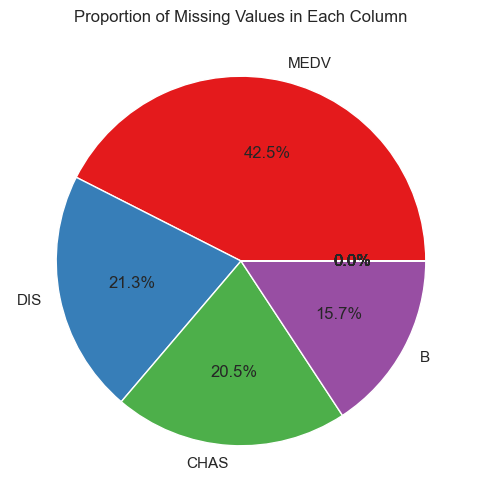

In [5]:
colors = sns.color_palette('Set1')
sns.set_theme()
missing_data_df = missing_data_df.sort_values('Percentage Missing', ascending=False)
missing_data_df['Percentage Missing'].plot.pie(figsize=(6, 6), autopct='%1.1f%%', colors=colors)
plt.title('Proportion of Missing Values in Each Column')
plt.ylabel('') 
plt.show()


<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    3. Visualize and describe the count of distinct values for each attribute.
</b> </h1>

From the below plot, we deduce that CHAS is most probably categorical, while others are numerical.

In [7]:
n_unique_values = df.nunique()
n_unique_values 

CRIM       452
ZN          27
INDUS       77
CHAS         2
NOX        132
RM         437
AGE        399
DIS        343
RAD         10
TAX         67
PTRATIO     85
B          357
LSTAT      445
MEDV       210
dtype: int64

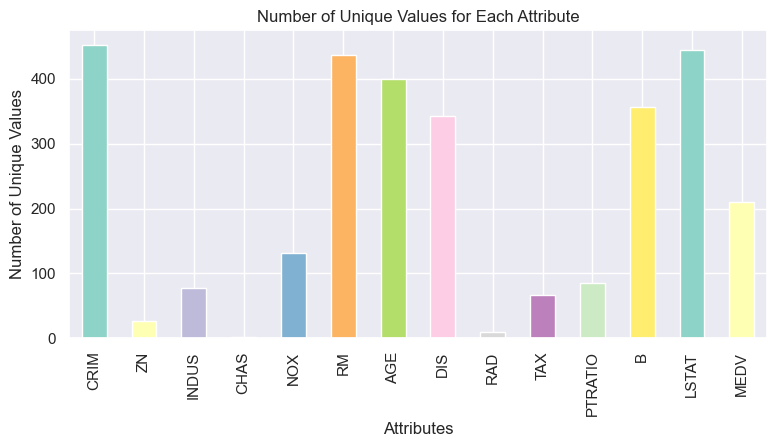

In [6]:
unique_counts = df.nunique()

sns.set_theme()
colors = sns.color_palette('Set3')
unique_counts.plot(kind='bar', figsize=(9, 4), color=colors)
plt.title('Number of Unique Values for Each Attribute')
plt.xlabel('Attributes')
plt.ylabel('Number of Unique Values')
plt.show()

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    4. Create a diagram illustrating the interdependence of features. Analyze this graph to identify which features are most strongly correlated with the target variable?
</b> </h1>

- Correlation Matrix:
    - It's a table that shows the correlation between pairs of variables in my data.
    - Correlation measures how much two variables change together.
    - A value of 1 indicates a perfect positive correlation (as one goes up, the other goes up proportionally).
    - A value of -1 indicates a perfect negative correlation (as one goes up, the other goes down proportionally).
    - A value of 0 indicates no correlation.

- Heatmap Visualization:
    - A heatmap uses colors to represent the correlation values in the matrix.
    - Typically, red represents positive correlations (stronger as the color gets darker red).
    - Blue represents negative correlations (stronger as the color gets darker blue).
    - White or yellow often represent values close to 0 (weak or no correlation).

This will give me a visual representation of the correlation between all pairs of features in my dataset, where positive values indicate a positive correlation, negative values indicate a negative correlation, and values close to zero indicate little to no correlation.

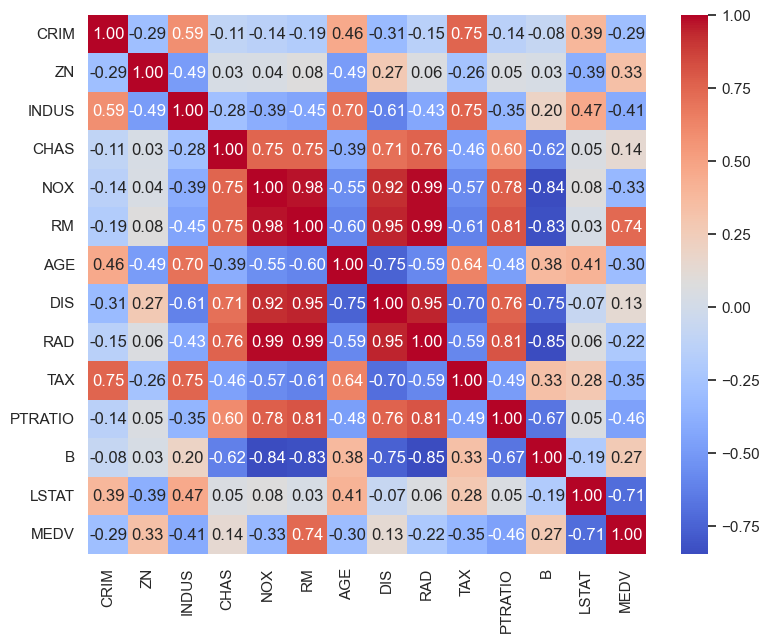

In [7]:
corr_matrix = df.corr()
plt.figure(figsize=(9, 7))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=True, fmt=".2f")
plt.show()

The clustermap function from seaborn is particularly useful for visualizing the correlation matrix because it not only provides a heatmap but also clusters the features based on their correlation, making it easier to identify patterns and relationships between different features.

<Figure size 500x500 with 0 Axes>

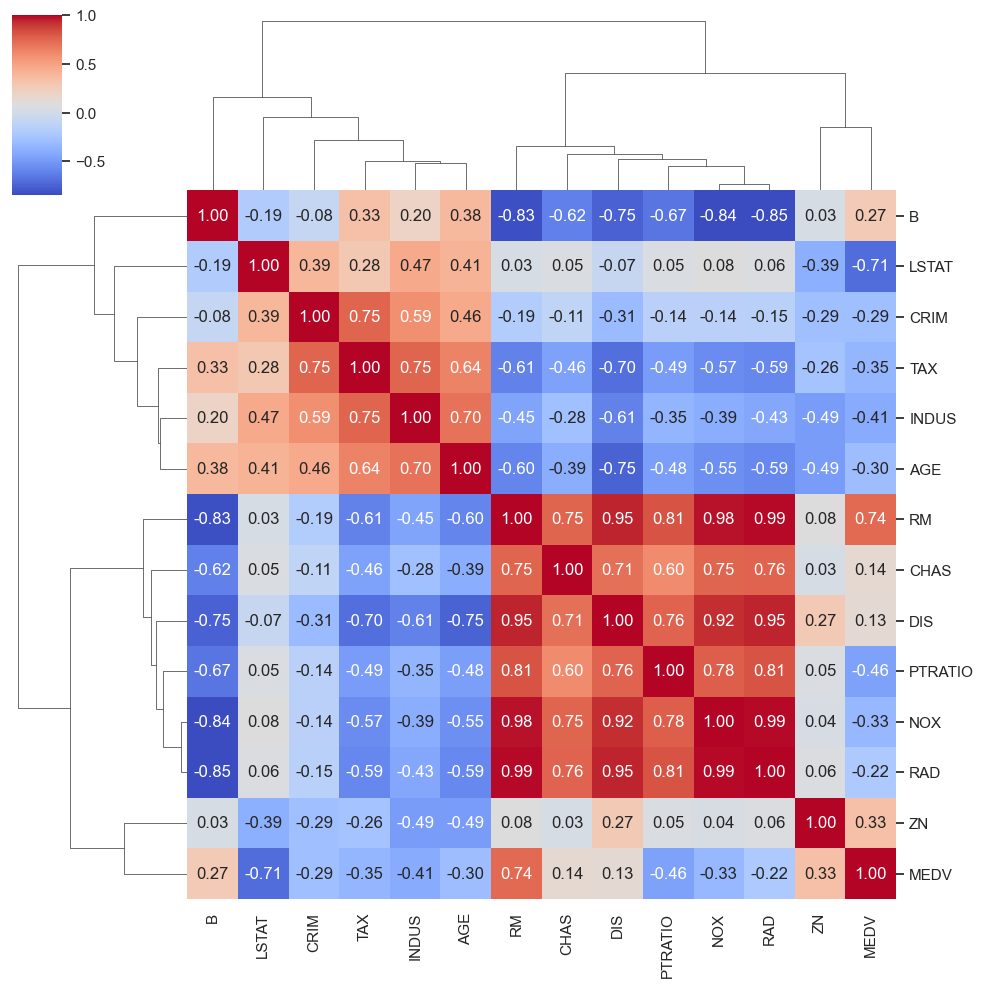

In [18]:
corr_matrix = df.corr()
plt.figure(figsize=(5, 5))
sns.clustermap(corr_matrix, cmap="coolwarm", annot=True, fmt=".2f")
plt.show()


The target variable exhibits a positive correlation with these features:

- **PM**: 0.74
- **ZN**: 0.33
- **B**: 0.27

The target variable exhibits a negative correlation with these features.
- **LSTAT**: -0.71
- **PTRATIO**: -0.46
- **INDUS**: -0.41
- **TAX**: -0.35
- **NOX**: -0.33
- **AGE**: -0.30

[]

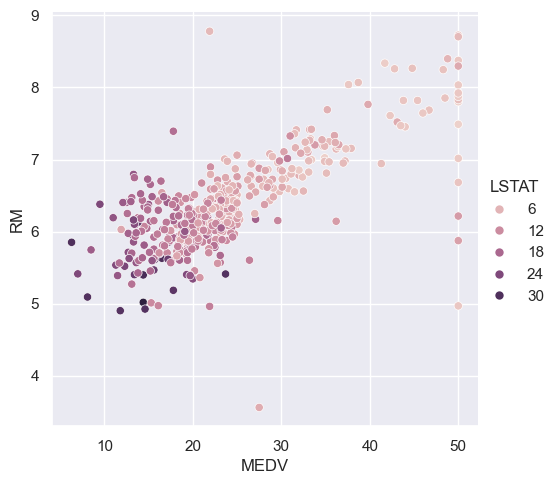

In [8]:
sns.relplot(data=df, x="MEDV", y="RM", hue="LSTAT")
plt.plot()

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    5. "Scatter and hexbin plots are primarily utilized to assess feature correlations. Employ these visualizations to scrutinize dependencies with the target variable. Provide a succinct explanation of each plot's purpose and significance.
</b> </h1>

- **Scatter Plots**: Scatter plots are used to visualize the relationship between two variables. Each point on the plot represents an observation in the dataset, with its position determined by the values of the two variables. Scatter plots are useful for identifying trends, outliers, and the general distribution of data points.

- **Hexbin Plots**: Hexbin plots, on the other hand, are used to visualize the density distribution of data points in a two-dimensional space. They are particularly useful when dealing with large datasets, as they can help in identifying clusters and patterns that might not be visible in a scatter plot due to overplotting. Hexbin plots divide the plot area into hexagonal bins and color each bin based on the number of points it contains, providing a clear visualization of the data density.

- **Scatter Chart**: A scatter plot shows individual data points for each house, with one axis representing a feature and the other representing the target variable (price). This allows us to see if there are any trends or patterns in the data.

- **Hexbin Chart**: When dealing with a large number of data points, a scatter plot can become cluttered. A hexbin chart aggregates data points into hexagonal bins on the plot. The color intensity of each bin represents the number of data points within that bin, allowing us to identify areas of high density and potential relationships.

In [4]:
def visualize_feature_correlations(df, column, target):
    sns.set_theme()
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    # Scatter plot 
    axes[0].scatter(df[column], df[target])
    axes[0].set_xlabel(column)
    axes[0].set_ylabel(target)
    axes[0].set_title(f'{target} vs. {column} (Scatter)')
    axes[0].grid(True)

    # Hexbin plot
    axes[1].hexbin(df[column], df[target], gridsize=(20, 20), cmap='coolwarm')
    axes[1].set_xlabel(column)
    axes[1].set_ylabel(target)
    axes[1].set_title(f'{target} vs. {column} (Hexbin)')
    axes[1].grid(True)

    sns.jointplot(data=df, x=column, y=target, kind='hex', height=5)
    plt.title(f'{target} vs. {column} (Hexbin)')
    
    plt.tight_layout()
    plt.show()


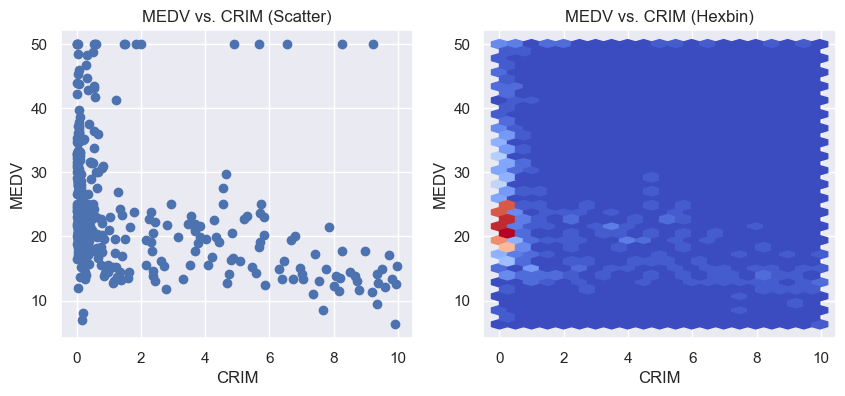

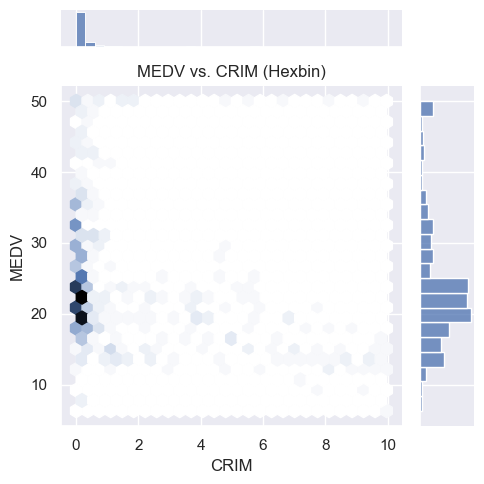

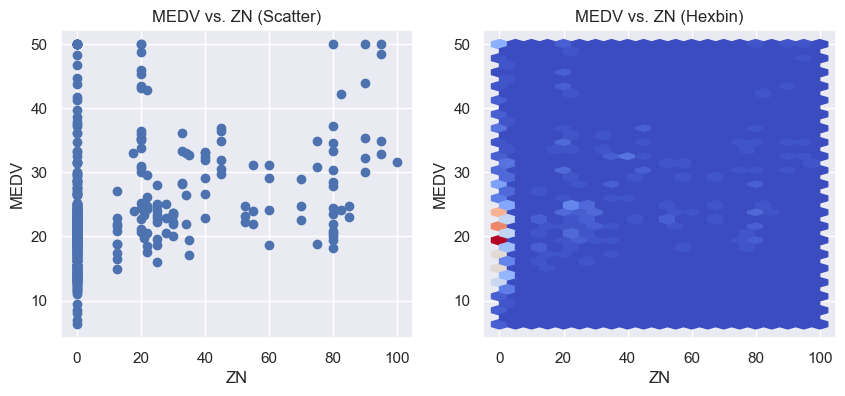

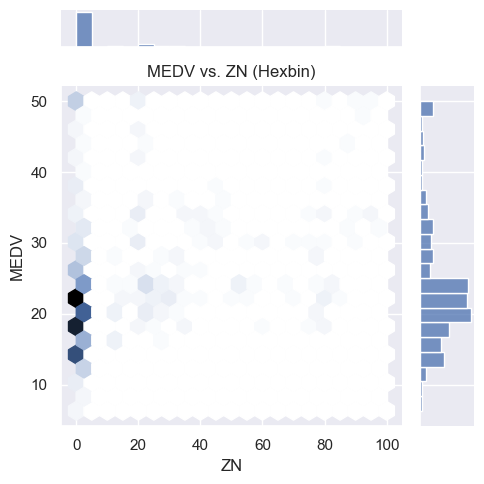

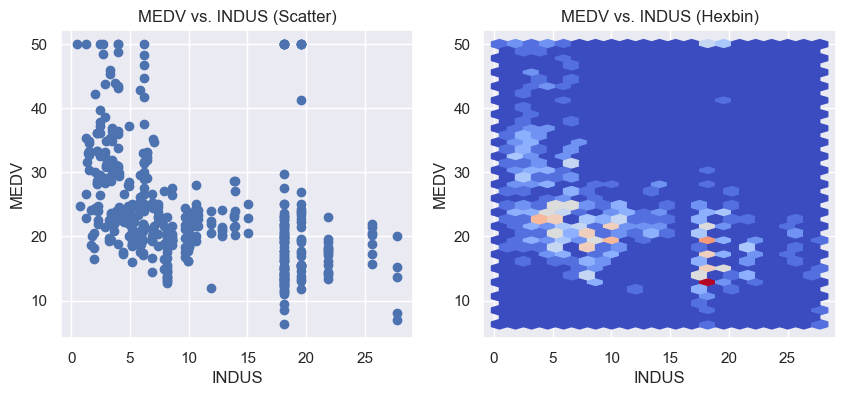

...

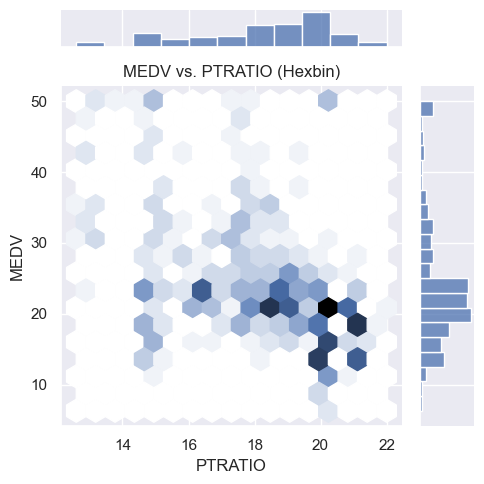

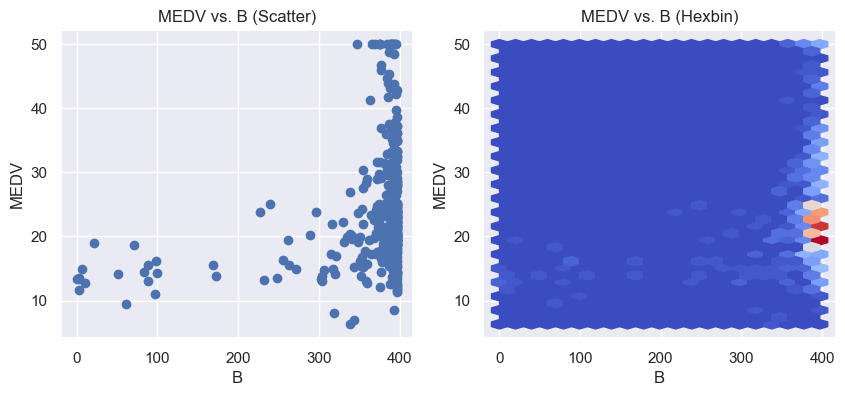

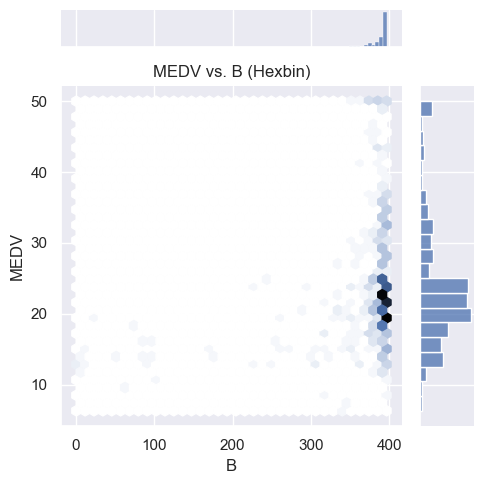

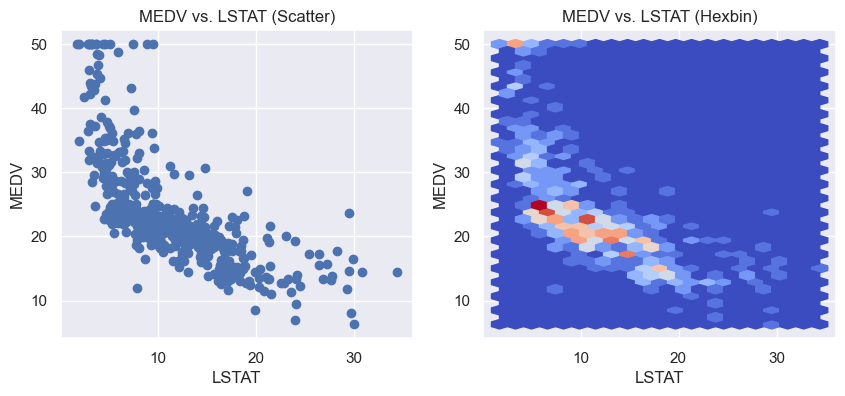

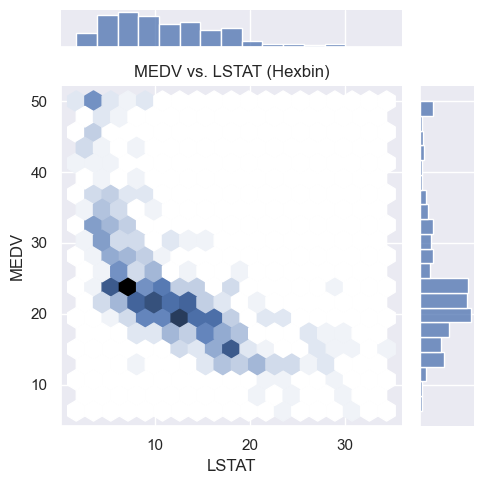

In [6]:
for col, _ in df.items():
    if col != "MEDV":
        visualize_feature_correlations(df ,col, "MEDV")

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    6. Explore alternative surveys suitable for your dataset and select one for implementation.
</b> </h1>

- **Boxplots**: Boxplots visualize the distribution of features across different categories.

- **Violin Plots**: Similar to boxplots, violin plots show the distribution of a feature while also displaying the density of data points.

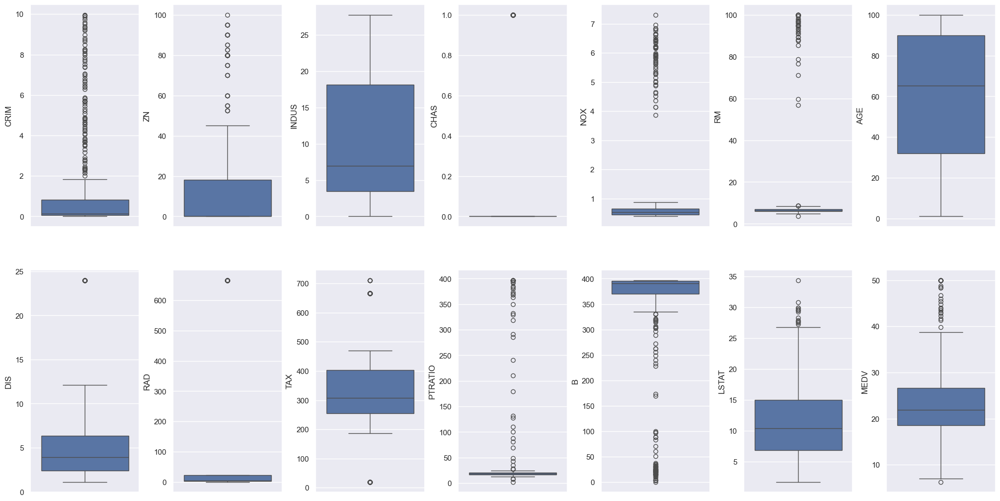

In [12]:
# Create a box plot
sns.set_theme()
fig, axs = plt.subplots(ncols=7, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()
for col, _ in df.items():
    sns.boxplot(y=col, data=df, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [23]:
for col, value in df.items():
    q1 = value.quantile(0.25)
    q3 = value.quantile(0.75)
    irq = q3 - q1
    value_col = value[(value <= q1 - 1.5 * irq) | (value >= q3 + 1.5 * irq)]
    perc = np.shape(value_col)[0] * 100.0 / np.shape(df)[0]
    print("Column %s outliers = %.2f%%" % (col, perc))

Column CRIM outliers = 18.97%
Column ZN outliers = 8.89%
Column INDUS outliers = 0.00%
Column CHAS outliers = 94.86%
Column NOX outliers = 10.67%
Column RM outliers = 11.46%
Column AGE outliers = 0.00%
Column DIS outliers = 10.28%
Column RAD outliers = 10.67%
Column TAX outliers = 27.08%
Column PTRATIO outliers = 9.88%
Column B outliers = 17.00%
Column LSTAT outliers = 2.77%
Column MEDV outliers = 6.52%


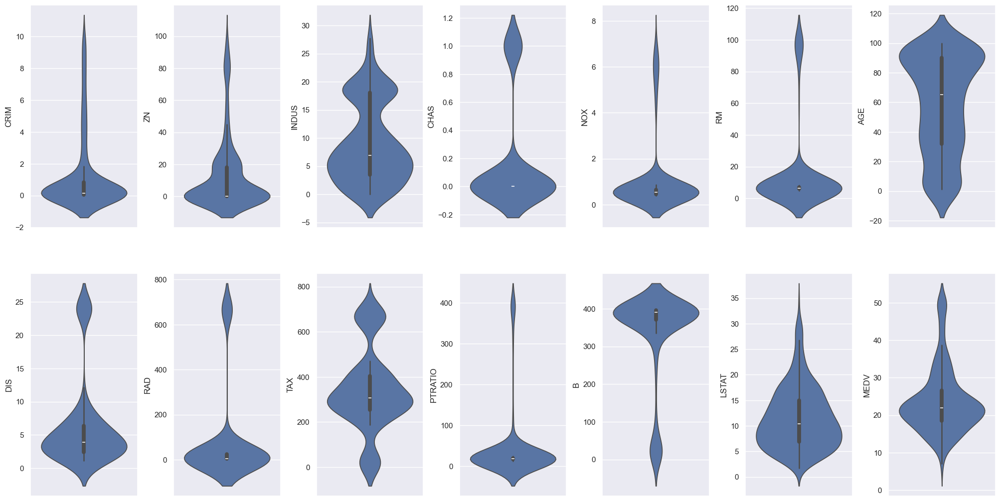

In [13]:
# create a Violin Plot
fig, axs = plt.subplots(ncols=7, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()
for col, _ in df.items():
    sns.violinplot(y=col, data=df, ax=axs[index])
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

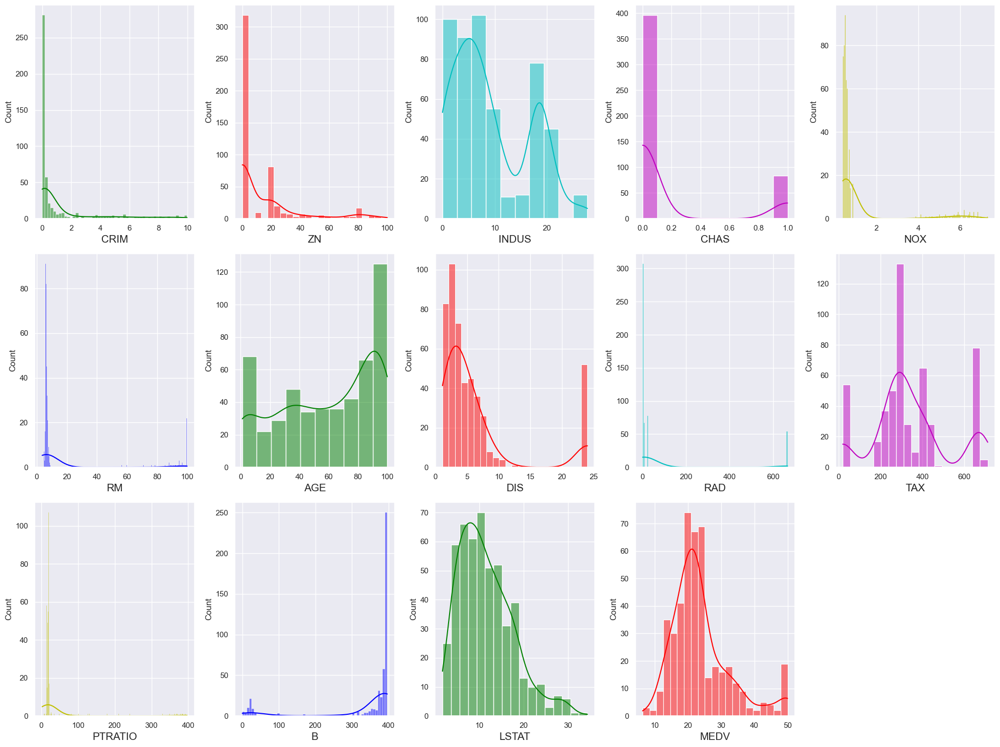

In [14]:
base_colors = list(mcolors.BASE_COLORS.values())
plt.figure(figsize = (20, 15))
sns.set_theme()

index = 1
for column in df:
    ax = plt.subplot(3, 5, index)
    sns.histplot(data=df, x=column, kde=True, color= base_colors[index % 6])
    plt.xlabel(column, fontsize = 15)        
    index += 1
    
plt.tight_layout()
plt.show()

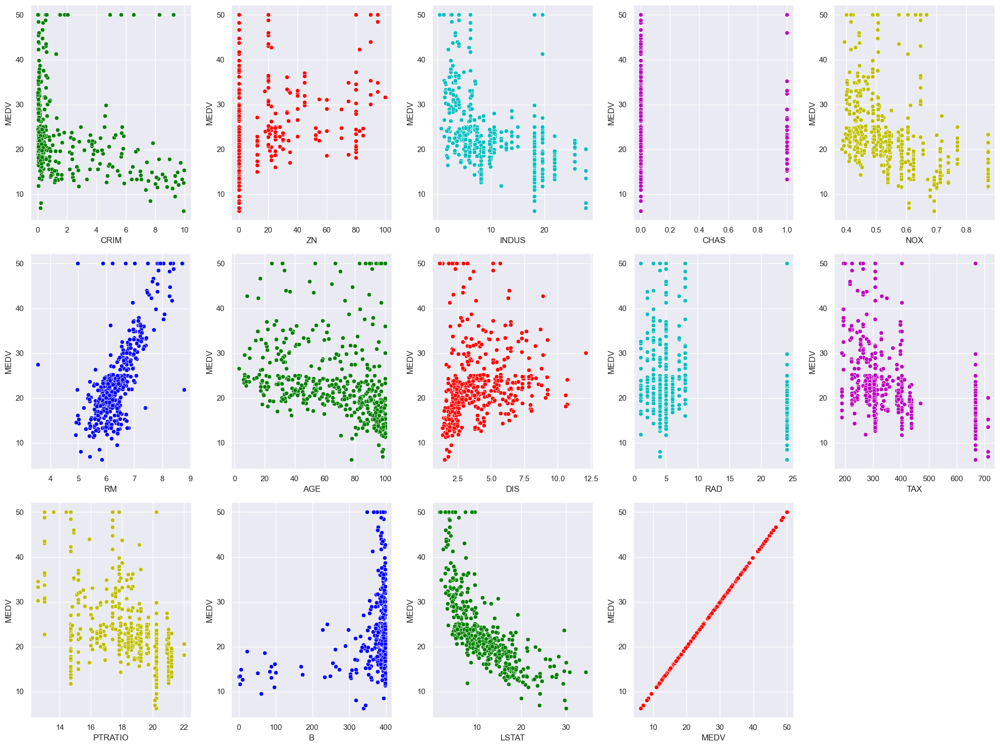

In [15]:
base_colors = list(mcolors.BASE_COLORS.values())
plt.figure(figsize = (20, 15))
sns.set_theme()

index = 1
for column in df:
    ax = plt.subplot(3, 5, index)
    sns.scatterplot(x = df[column], y = df['MEDV'], color= base_colors[index % 6])
    index += 1

plt.tight_layout()
plt.show()

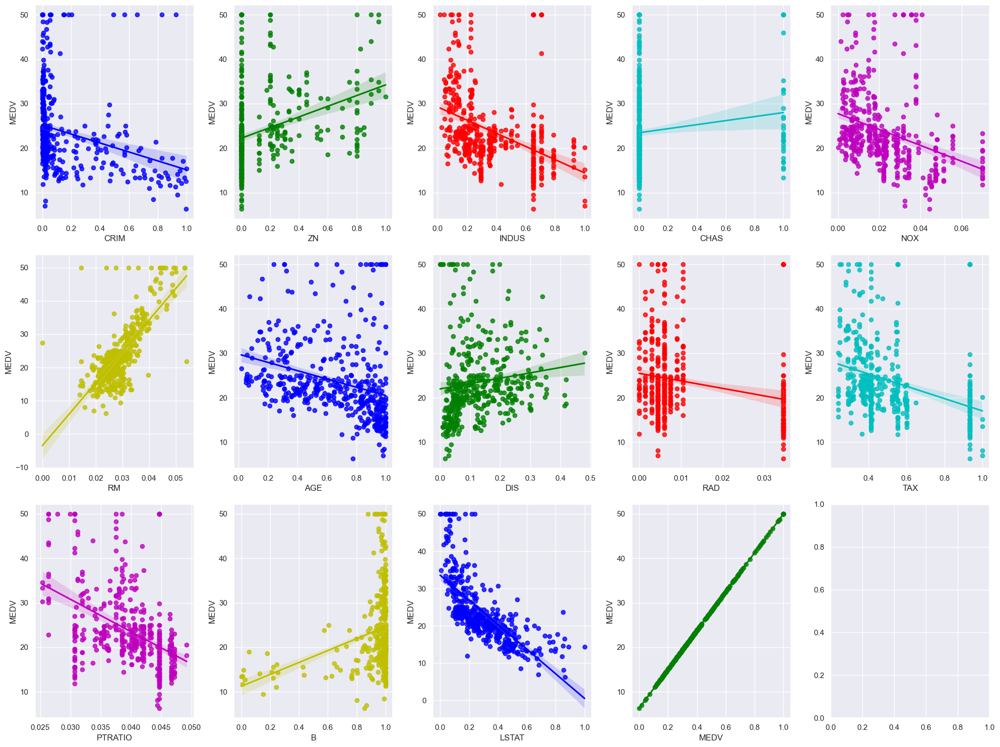

In [16]:
sns.set_theme()
min_max_scaler = MinMaxScaler()
column_sels = df.columns.values.tolist()
X = df.loc[:,:].copy()
X = pd.DataFrame(data=min_max_scaler.fit_transform(X), columns=column_sels)
y = df['MEDV']

fig, axs = plt.subplots(ncols=5, nrows=3, figsize=(20, 15))
axs = axs.flatten()
for i, col in enumerate(column_sels):
    sns.regplot(y=y, x=X[col], ax=axs[i], color= base_colors[i % 6])
    
plt.tight_layout()
plt.show()

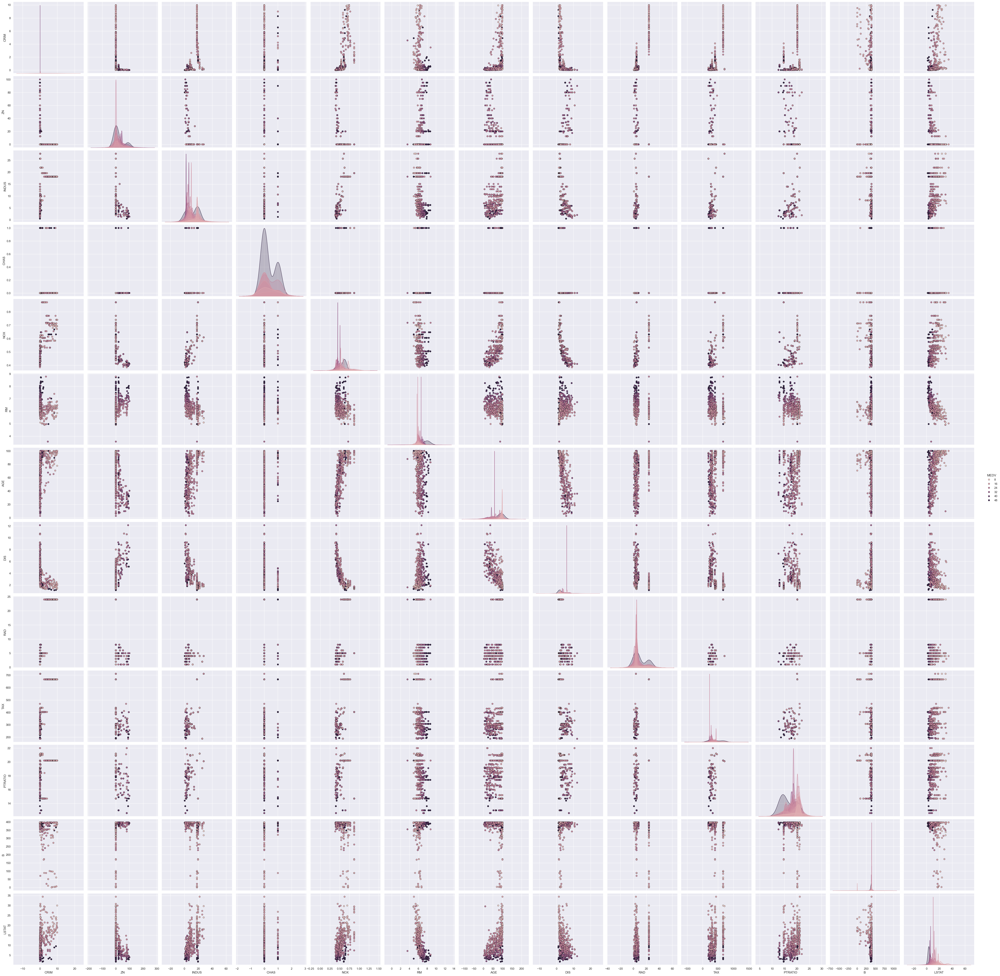

In [31]:
sns.pairplot(df, hue='MEDV', diag_kind='kde', plot_kws={'edgecolor': 'k'}, height=4)
plt.show()

<a id='part2'></a>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    Part II: Preprocessing of dataset
</b> </h1>

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    7. Describe and apply at least three methods for handling missing values, briefly explaining the rationale behind each method.
</b> </h1>

Handling Missing Values:
1. Dropping rows/columns: This is the simplest approach. We can drop rows with any missing values (df.dropna()) or drop entire columns with a high percentage of missing values. However, this can lead to data loss.
2. Imputation: This involves filling in missing values with estimated values. Common techniques include:
    - Mean/Median/Mode: Replace missing values with the mean, median, or most frequent value for the column (suitable for numerical data).
    - Forward fill/Backward fill: Copy the value from the previous/next non-missing row for that column (works for ordered data).
    - Categorical Data: For categorical data, we might fill missing values with the most frequent category or a new category indicating missingness.
3. Feature Engineering: Create new features based on existing ones to handle missing values. For example, group age categories instead of using specific ages if there are many missing values in the age column.

In [32]:
df.isnull().sum()

CRIM        0
ZN          0
INDUS       0
CHAS       26
NOX         0
RM          0
AGE         0
DIS        27
RAD         0
TAX         0
PTRATIO     0
B          20
LSTAT       0
MEDV       54
dtype: int64

In [2]:
df = pd.read_excel(file_name)
df['CHAS'] = df['CHAS'].fillna(int(df['CHAS'].mode()[0]))
df['DIS'] = df['DIS'].fillna(df['DIS'].mean())
df['B'] = df['B'].fillna(df['B'].mean())
df.dropna(subset=['MEDV'], inplace=True)

In [3]:
from sklearn.linear_model import LinearRegression as LR

traindf = df[df['DIS'].notna()].copy()
testdf = df[df['DIS'].isna()].copy()

X_train_DIS = traindf.drop('DIS', axis=1)
y_train_DIS = traindf['DIS']

lr = LR()
lr.fit(X_train_DIS, y_train_DIS)

X_test_DIS = testdf.drop('DIS', axis=1)

if len(X_test_DIS) > 0:
    predictions = lr.predict(X_test_DIS)
    df.loc[testdf.index, 'DIS'] = predictions

In [21]:
df.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    8. Can we remove certain columns? Why? If feasible, please delete the necessary columns and explain the rationale.    
</b> </h1>

Columns that are not on the main diagonal and have a correlation of close to 1 mean that one column is extra and can be removed. Therefore, based on this, I delete the extra columns that meet these conditions.

In [4]:
# Identify columns with correlation of close to 1
correlation = df.corr()
highly_correlated_cols = set()
cols_to_remove = set()
correlated_cols = set()
for col in correlation.columns:
    for other_col in correlation.columns:
        if col != other_col and correlation.loc[col, other_col] >= 0.85:
            if not(other_col in highly_correlated_cols) and not(col in highly_correlated_cols):
                cols_to_remove.add(other_col)
            if not((other_col, col) in correlated_cols):
                correlated_cols.add((col, other_col))
            highly_correlated_cols.add(col)
            highly_correlated_cols.add(other_col)

# Drop the extra columns
for col in cols_to_remove:
    if col in df.columns:
        df.drop(col, axis=1, inplace=True)

if correlated_cols:
    print("correlated columns:")
    for correlated in correlated_cols:
        print(correlated[0], "and", correlated[1])

if cols_to_remove:
    print("---------------------")
    print(f"Dropped columns: {', '.join(cols_to_remove)}")

correlated columns:
RAD and TAX
CRIM and RAD
---------------------
Dropped columns: RAD


<Figure size 500x500 with 0 Axes>

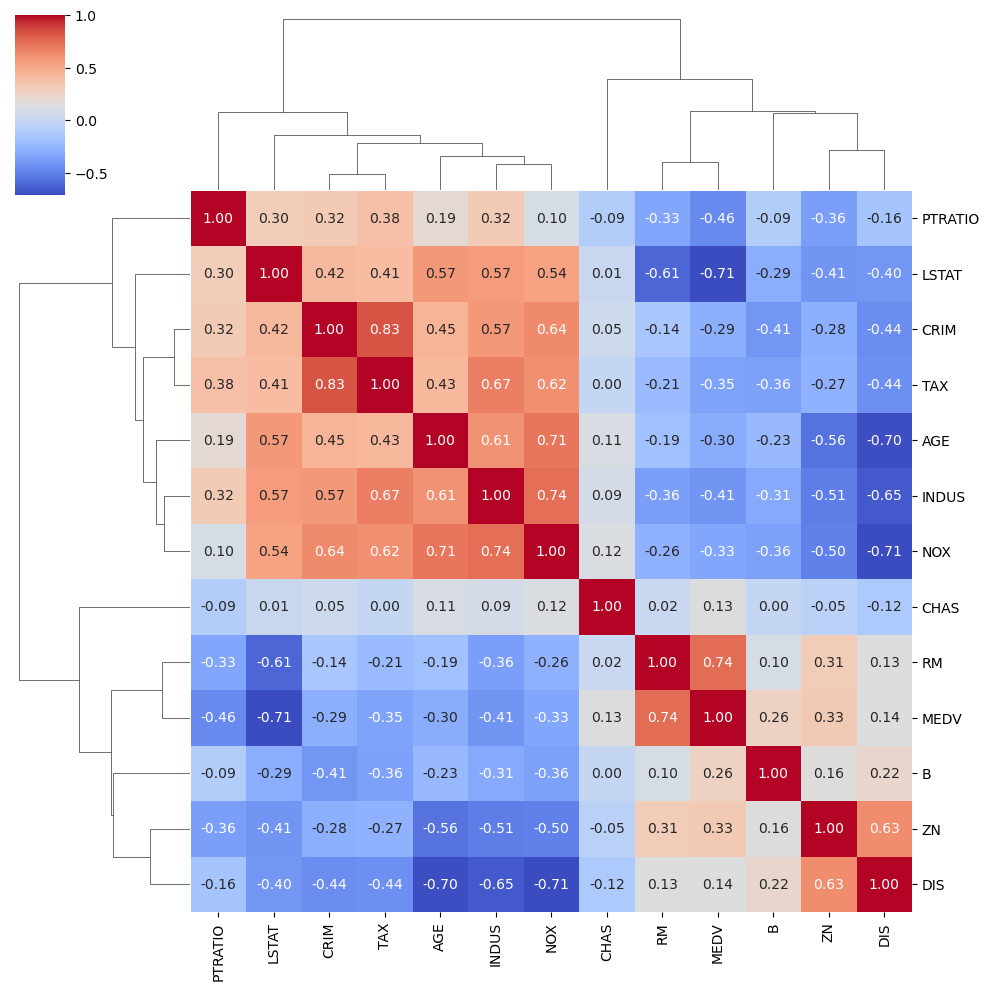

In [5]:
corr_matrix = df.corr()
plt.figure(figsize=(5, 5))
sns.clustermap(corr_matrix, cmap="coolwarm", annot=True, fmt=".2f")
plt.show()


WE remove CHAS due to its low correlation with MEDV.

In [6]:
df["CHAS"].value_counts()

CHAS
0.0    420
1.0     32
Name: count, dtype: int64

In [7]:
if "CHAS" in df.columns:
    df.drop(["CHAS"], axis=1, inplace=True)

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    9. Identify which features are categorical and which are numerical. Understand the distinction between these two types of features. In this dataset, distinguish between numerical and categorical characteristics.
</b> </h1>

- **Numerical features**: These are data points represented by numbers and can be used for mathematical operations like addition, subtraction, multiplication, and division. They can be further categorized into:

    - **Discrete**: Represent distinct values with no values in between (e.g., number of bedrooms, count of fireplaces).
    - **Continuous**: Can take on any value within a specific range (e.g., square footage, price).

- **Categorical features**: These represent qualitative data and consist of labels or categories that don't have a natural order (e.g., neighborhood name, type of flooring).

In [8]:
df.dtypes

CRIM       float64
ZN         float64
INDUS      float64
NOX        float64
RM         float64
AGE        float64
DIS        float64
TAX        float64
PTRATIO    float64
B          float64
LSTAT      float64
MEDV       float64
dtype: object

Identifying Numerical and Categorical Features in the Boston Housing Dataset:

- **Numerical features**:
    - **CRIM**: per capita crime rate by town (continuous)
    - **ZN**: proportion of residential land zoned for lots over 25,000 sq.ft (continuous)
    - **INDUS**: proportion of nonretail business acres per town (continuous)
    - **NOX**: nitric oxides concentration (parts per 10 million) (continuous)
    - **RM**: average number of rooms per dwelling (continuous, might be discrete depending on granularity)
    - **AGE**: proportion of owner-occupied units built prior to 1940 (continuous)
    - **DIS**: weighted distances to five Boston employment centers (continuous)
    - **RAD**: index of accessibility to radial highways (continuous)
    - **TAX**: full-value property-tax rate per $10,000 (continuous)
    - **PTRATIO**: pupil-teacher ratio by town (continuous)
    - **B**:  1000*(Bk - 0.63)^2 where Bk is the proportion of blacks by town (continuous)
    - **LSTAT**: % lower status of the population (continuous)
    - **MEDV** (Target): Median value of owner-occupied homes in $1000s (continuous)

- **Categorical features**:
    - **CHAS**: Charles River dummy variable (= 1 if tract bounds river; otherwise 0) (categorical with only two values)

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    10. What are the benefits of normalizing or standardizing numerical features, and how do these methods differ? Is this necessary for our project?
</b> </h1>

Normalization and standardization are techniques used to scale numerical features in a dataset.

Purpose of Normalization and Standardization:

- **Normalization**:
    - Scales features to a specific range, often between 0 and 1 (min-max normalization) or -1 and 1 (max-abs normalization).
    - Useful when features have different units or scales and we want comparisons based on relative magnitudes.
    - May not be ideal if the data distribution is skewed or has outliers.

- **Standardization**:
    - Transforms features to have a standard normal distribution (mean = 0, standard deviation = 1).
    - Useful when we want to focus on the number of standard deviations a data point is away from the mean.
    - Less sensitive to outliers than normalization.

Whether normalization or standardization is necessary depends on the chosen machine learning algorithm. Here's a general guideline:

- **Distance-based algorithms (e.g., k-Nearest Neighbors, Support Vector Machines)**: Often benefit from normalization or standardization as they rely on distances between data points.

- **Gradient descent-based algorithms (e.g., Linear Regression, Neural Networks)**: Might not require normalization/standardization if the learning rate is adjusted appropriately. However, it can sometimes improve convergence speed and stability

In [153]:
numerical_features = ['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'TAX', 'PTRATIO', 'B', 'LSTAT']

# Normalize the numerical features
minmax_scaler = MinMaxScaler(feature_range=(0, 1))
df_minmax_scaler = df.copy()
df_minmax_scaler[numerical_features] = minmax_scaler.fit_transform(df[numerical_features])

# Normalize the numerical features
normalizer_scaler = Normalizer()
df_normalized = df.copy()
df_normalized[numerical_features] = normalizer_scaler.fit_transform(df[numerical_features])

# Standardize the numerical features
standard_scaler = StandardScaler()
df_standardized = df.copy()
df_standardized[numerical_features] = standard_scaler.fit_transform(df[numerical_features])

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    11. What pre-processing techniques are effective for training models on categorical features, typically represented as strings or objects in datasets?
</b> </h1>

Pre-processing for Textual Features:

1. **Label Encoding**:
    - Assigns a numerical value to each unique category (e.g., "Yes" = 1, "No" = 0).
    - Simple and efficient, but may introduce unintended ordering (e.g., 1 might be interpreted as "better" than 0).

2. **One-Hot Encoding**:
    - Creates a new binary feature for each category.
    - Preserves the categorical nature of the feature and avoids introducing ordering assumptions.
    - Can increase the number of features, potentially impacting computational cost.

3. **Ordinal Encoding**:
    - Assigns numerical values based on the inherent order of the categories (e.g., T-shirt size: S = 1, M = 2, L = 3).
    - Only suitable if a meaningful order exists among the categories.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    12. Research validation, train, test data and explain common segmentation methods. Then divide your data into these categories.
</b> </h1>

dividing data into three sets is crucial for robust model evaluation:

- **Training Data (Largest Set)**: This is where the actual learning happens. The model is exposed to the training data and learns to identify patterns between the features (e.g., house characteristics) and the target variable (e.g., median house price).

- **Validation Data (Medium-Sized Set)**: This set is used to fine-tune the model's hyperparameters. Hyperparameters are settings within the model itself that can be adjusted to improve performance. The validation data helps me prevent overfitting, which occurs when the model memorizes the training data too well and doesn't generalize well to unseen data.

- **Test Data (Smallest Set)**: This is the unseen data used for final evaluation of the model's generalizability. It's important to keep the test data completely separate from the training and validation sets to ensure an unbiased assessment of how well the model performs on new data.

some common rules of thumb for splitting data:

- **Training**: 60-80%
- **Validation**: 10-20%
- **Test**: 10-20%

Common Segmentation Methods(Data segmentation is the process of dividing data into subsets based on specific characteristics):

- **Random Sampling**: This is the simplest method, where you randomly select data points for each set (train, validation, test) while maintaining the same class distribution (if applicable) as the original data.

- **Stratified Sampling**: This method is particularly useful for datasets with imbalanced classes. It ensures each set (train, validation, test) proportionally reflects the class distribution in the entire dataset.

- **Time-Based Splitting**: This method is used when the data has a temporal component (e.g., daily stock prices). You split the data based on time, using earlier data for training and validation and later data for testing.

- **Fold-Based Methods (e.g., K-Fold Cross-Validation)**: These methods involve dividing the data into multiple folds (e.g., 5 or 10 folds). One fold is used for testing, while the remaining folds are used for training and validation. This process is repeated for each fold, providing a more robust evaluation of the model's performance compared to a single train-validation-test split.

In [154]:
X = df_standardized.drop("MEDV", axis=1)  
y = df_standardized["MEDV"]

# Split data into training and testing sets (80%/20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=904)

# Split test data into validating and testing sets (50%/50%)
X_test, X_validation, y_test, y_validation = train_test_split(X_test, y_test, test_size=0.5, random_state=904)

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    13. Explore various preprocessing techniques. Highlight some of these methods and apply them as necessary.
</b> </h1>


Some additional data preprocessing techniques:

1. **Outlier Detection and Handling**:

    - **Identifying outliers**: Techniques like Z-scores or Interquartile Range (IQR) can help identify data points significantly deviating from the rest.
    - **Winsorization**: This method replaces outliers with values at the upper or lower limits of a certain percentile (e.g., replacing with values at the 1st and 99th percentiles).
    - **Capping**: I can set a threshold and replace outliers with that value (e.g., capping extremely high house prices).
    - **Decision based on context**: Sometimes, outliers might be genuine data points, and removing them could remove valuable information. Consider the domain knowledge and potential impact on Ir analysis.

2. **Feature Engineering**:

    This involves creating new features from existing ones to potentially improve model performance. Examples include:

    - **Interactions**: Creating new features by multiplying existing features (e.g., interaction between crime rate and number of rooms).
    - **Binning**: Discretizing continuous features into categories (e.g., grouping house prices into price ranges).
    - **Polynomial Features**: Creating polynomial terms of existing features (e.g., squaring or cubing features).

In [12]:
def remove_outliers_with_Z_Score_Method(df, column_name): 
    z_scores = np.abs(stats.zscore(df[column_name]))
    df_filtered = df[z_scores < 3]
    return df_filtered

def remove_outliers_with_IQR_method(df, column_name): 
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1

    df_filtered = df[~((df[column_name] < (Q1 - 1.5 * IQR)) | (df[column_name] > (Q3 + 1.5 * IQR)))]
    return df_filtered

def remove_outliers_from_columns(df, out_cols, T=1.5, verbose=True):
    new_df = df.copy()
    for col in out_cols:
        q1 = new_df[col].quantile(.25)
        q3 = new_df[col].quantile(.75)
        col_iqr = q3 - q1
        col_max = q3 + T * col_iqr
        col_min = q1 - T * col_iqr
        filtered_df = new_df[(new_df[col] <= col_max) & (new_df[col] >= col_min)]
        if verbose:
            n_out = new_df.shape[0] - filtered_df.shape[0]
            print(f"Columns {col} had {n_out} outliers removed")
        new_df = filtered_df
    return new_df


<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    Object Oriented Programming:
</b> </h1>

In [13]:
class Preprocess:
    def __init__(self, data_name, target) -> None:
        self.df = pd.read_excel(data_name)
        df.dropna(subset=[target], inplace=True)
        self.target = target

    def Identify_correlated_columns(self,correlated_range=0.85):
        correlation = self.df.corr()
        highly_correlated_cols = set()
        cols_to_remove = set()
        for col in correlation.columns:
            for other_col in correlation.columns:
                if col != other_col and correlation.loc[col, other_col] >= correlated_range: 
                    if not(other_col in highly_correlated_cols) and not(col in highly_correlated_cols):
                        cols_to_remove.add(other_col)
                    highly_correlated_cols.add(col)
                    highly_correlated_cols.add(other_col)
        return cols_to_remove

    def drop_extra_columns(self, cols_to_remove):
        for col in cols_to_remove:
            if col in self.df.columns:
                self.df.drop(col, axis=1, inplace=True)

    def remove_outliers(self, column_name): 
        Q1 = self.df[column_name].quantile(0.25)
        Q3 = self.df[column_name].quantile(0.75)
        IQR = Q3 - Q1

        self.df = df[~((df[column_name] < (Q1 - 1.5 * IQR)) | (df[column_name] > (Q3 + 1.5 * IQR)))]

    def minmax_scaler_df(self, numerical_features):
        minmax_scaler = MinMaxScaler(feature_range=(0, 1))
        df_minmax_scaler = self.df.copy()
        df_minmax_scaler[numerical_features] = minmax_scaler.fit_transform(self.df[numerical_features])
        self.df = df_minmax_scaler
    
    def normalize_df(self, numerical_features):
        normalizer_scaler = Normalizer()
        df_normalized = self.df.copy()
        df_normalized[numerical_features] = normalizer_scaler.fit_transform(self.df[numerical_features])
        self.df = df_normalized

    def standardize_df(self, numerical_features):
        standard_scaler = StandardScaler()
        df_standardized = self.df.copy()
        df_standardized[numerical_features] = standard_scaler.fit_transform(self.df[numerical_features])
        self.df = df_standardized

    def split_train_validation_test(self):   
        X = df_normalized.drop(self.target, axis=1)  
        y = df_normalized[self.target]
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        self.X_validation, self.X_test, self.y_validation, self.y_test = train_test_split(self.X_test, self.y_test, test_size=0.5, random_state=42)

    def Preprocessing(self, numerical_features):
        cols_to_remove = self.Identify_correlated_columns()
        self.drop_extra_columns(cols_to_remove)
        for col in self.df.columns.tolist():
            self.remove_outliers(col)
        self.normalize_df(numerical_features)
        self.standardize_df(numerical_features)
        self.split_train_validation_test()

<a id='part3'></a>

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    Part III: training and evaluation
</b> </h1>

<a id='phase1'></a>

<h1 style = "color:red;font-size:30px" dir = "ltr"> <b>
    Phase I: Linear Regression
</b> </h1>

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    14. In this project we are implementing supervised machine learning models. What is the difference between these models and unsupervised, semi-supervised and reinforcement learning models? Give an example for each.
</b> </h1>

- **Supervised Learning**:

    - Involves learning a mapping from an input (X) to a desired output (y) using labeled data. The model is trained on examples where both the input features and the corresponding labels (target variable) are provided.
    - Example: Predicting house prices (MEDV) based on house characteristics (CRIM, RM, etc.) in the Boston housing dataset. The model learns the relationship between features and prices from labeled data points with known house prices.

- **Unsupervised Learning**:

    - Deals with unlabeled data, where the data points lack predefined categories or labels. The goal is to uncover hidden patterns or structures within the data.
    - Example: Image clustering. Unsupervised algorithms can group images with similar visual features (e.g., color, shapes) without needing labels like "cat" or "dog."
    
- **Semi-supervised Learning**:

    - Leverages a combination of labeled and a much larger amount of unlabeled data. The model can learn from the labeled data to improve its understanding of the unlabeled data.
    - Example: Sentiment analysis with limited labeled reviews (positive or negative) and a vast collection of unlabeled reviews. The model learns from the labeled data and leverages the unlabeled data to improve its accuracy in classifying sentiment for new reviews.

- **Reinforcement Learning**:

    - Involves an agent interacting with an environment. The agent learns through trial and error, receiving rewards for desired actions and penalties for undesired ones. The goal is to maximize the long-term rewards.
    - Example: Training an AI to play a game (e.g., chess). The agent learns by playing against itself or other agents, receiving rewards for winning or achieving goals. It continuously refines its strategies to maximize its chances of winning.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    15. What is regression and what are the differences with classification methods?
</b> </h1>

Regression vs. Classification in Machine Learning

Both regression and classification are fundamental techniques in supervised machine learning, but they differ in the nature of the target variable they aim to predict:

- **Regression**:

    - Deals with continuous target variables. These variables can take on any numerical value within a specific range.
    - The goal of regression is to learn a mapping function that predicts a continuous output value for a given set of input features.
    - Example: Predicting house prices (in dollars) based on house characteristics (square footage, number of bedrooms, etc.). The model learns the relationship between features and prices, allowing it to estimate prices for new houses.

- **Classification**:

    - Deals with discrete target variables that represent categories. These variables can only take on a limited set of predefined labels.
    - The goal of classification is to learn a model that can categorize new data points into one of the predefined classes.
    - Example: Predicting whether an email is spam or not (spam/not spam). The model learns the characteristics of spam emails and uses this knowledge to classify new emails into the appropriate category.

|Feature	|Regression	|Classification|
|-----------|-----------|--------------|
|Target Variable Type|	Continuous|	Discrete (categorical)|
|Predicted Output Values|	Any numerical value within a specific range|	Specific predefined labels (e.g., spam/not spam)|
|Examples|	Predicting house prices, stock prices, weather|	Predicting email spam, Image recognition (cat/dog)|

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    16. Elucidate the relationships depicted in the context of linear regression analysis.
</b> </h1>

Main form of simple linear regression function:
$$f(x) = \alpha x + \beta$$

here we want to find the bias ($\alpha$) and slope($\beta$) by minimizing the derivation of the Residual Sum of Squares (RSS) function:

- step 1: Compute RSS of the training data  

$$ RSS = \Sigma (y_i - (\hat{\beta} + \hat{\alpha} * x_i) )^2 $$

- step 2: Compute the derivatives of the RSS function in terms of $\alpha$ and $\beta$, and set them equal to 0 to find the desired parameters

$$ \frac{\partial RSS}{\partial \beta} = \Sigma (-f(x_i) + \hat{\beta} + \hat{\alpha} * x_i) = 0$$
$$ \to \beta = \hat{y} - \hat{\alpha} \hat{x} \to (1)$$


$$ \frac{\partial RSS}{\partial \alpha} = \Sigma (-2 x_i y_i + 2 \hat{\beta} x_i + 2\hat{\alpha} x_i ^ 2) = 0 \to (2)$$

$$ (1) , (2) \to \hat{\alpha} = \frac{\Sigma{(x_i - \hat{x})(y_i - \hat{y})}}{\Sigma{(x_i - \hat{x})^2}}
$$
$$ \hat{\beta} = y - \hat{a} x$$

A concise overview of the relationships explored in linear regression analysis:

- **Function and Parameters**:

    - The function f(x) = α x + β represents the linear relationship between the independent variable (x) and the dependent variable (y).
    - α (alpha) is the bias or y-intercept of the line. It represents the predicted value of y when x is zero.
    - β (beta) is the slope of the line. It indicates the change in y for a unit change in x.

- **Minimizing RSS**:

    - The Residual Sum of Squares (RSS) measures the total squared difference between the actual y values and the values predicted by the model (f(x) = α x + β).
    - The goal is to find the values of α and β that minimize the RSS, resulting in the best possible fit of the linear model to the training data.

- **Steps to Find α and β**:

    1. **Compute RSS**: Summing the squared differences between actual y values and the model's predictions based on the current estimates of α and β (hat{β} and hat{α}).
    2. **Differentiate RSS**: At first we deriving the partial derivatives of the RSS function with respect to α and β. Setting these derivatives to zero allows us to find the values of α and β that minimize the RSS.
    3. **Solve for α and β**:
        - Equation (1): We derived the formula for β, expressing it in terms of the average predicted value (y) and the average product of deviations from the mean (x and y).
        - Equation (2): This step leads to the formula for α, which uses the covariance between x and y divided by the variance of x. By substituting equation (1) for β in equation (2), we can simplify it to the final form we provided.

- **Interpretation**:

    The final formulas for α and β show how they are estimated based on the characteristics of the training data.


<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    17. Complete the indicated sections in the notebook. Since the regression function is made of order 1, only one feature can be selected as the input of this function. In your opinion, which feature gives us a more accurate output than other features? Explain the reason for your choice.
</b> </h1>

how to find the appropriate feature:

1. **Correlation Analysis**: 
    - Calculate the correlation coefficient between each feature (e.g., CRIM, RM, LSTAT) and the target variable (MEDV). Correlation measures the strength and direction of the linear relationship between two variables.
    - We Look for features with a high positive or negative correlation with MEDV. A strong positive correlation suggests that as the feature value increases, the house price (MEDV) tends to increase as well. Conversely, a strong negative correlation suggests an opposite trend.

2. **Domain Knowledge**:

    - We can consider the real-world meaning of each feature and its connection to house prices. For example, a higher number of rooms (RM) might generally correlate with a higher house price.

Based on these two points, here's a potential feature for initial exploration:

- **RM (average number of rooms per dwelling)**: This feature intuitively captures the size of a house, which is often a major factor influencing price. It's likely to have a high positive correlation with MEDV.

<Figure size 500x500 with 0 Axes>

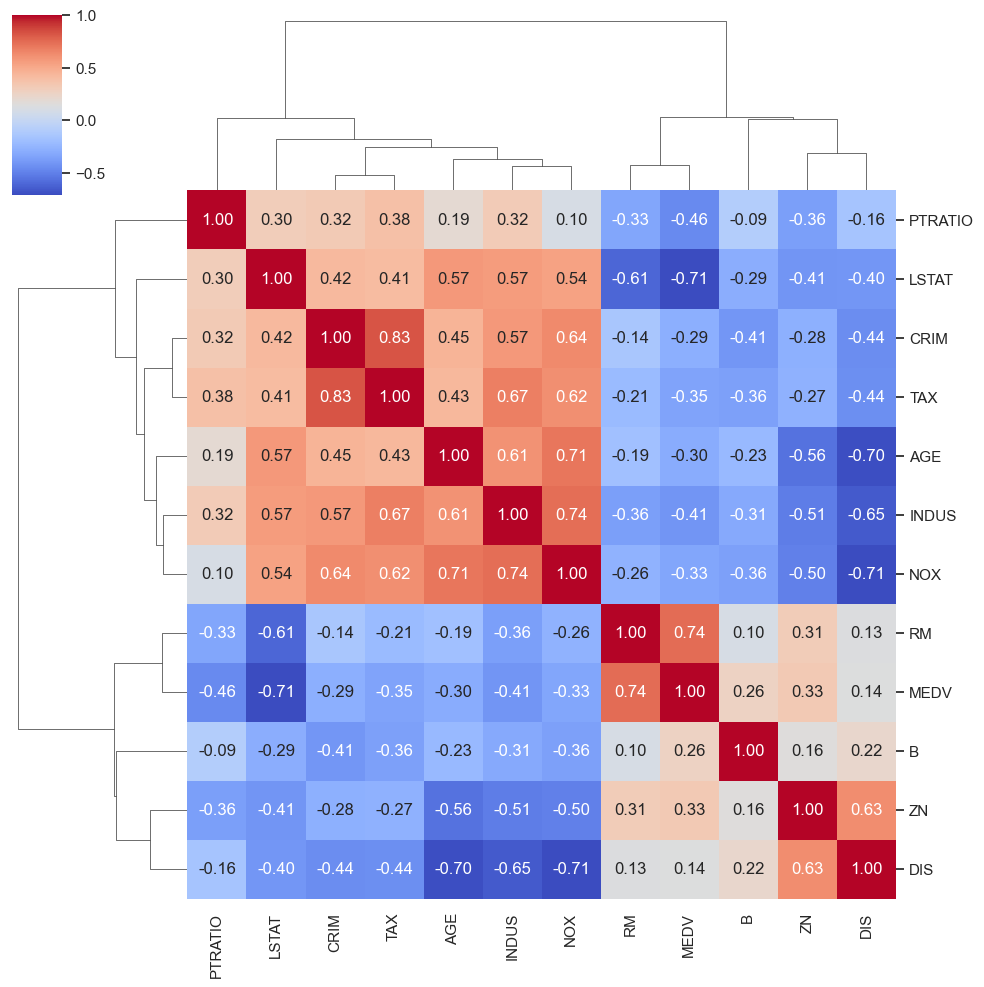

In [30]:
corr_matrix = df.corr()
plt.figure(figsize=(5, 5))
sns.clustermap(corr_matrix, cmap="coolwarm", annot=True, fmt=".2f")
plt.show()

[]

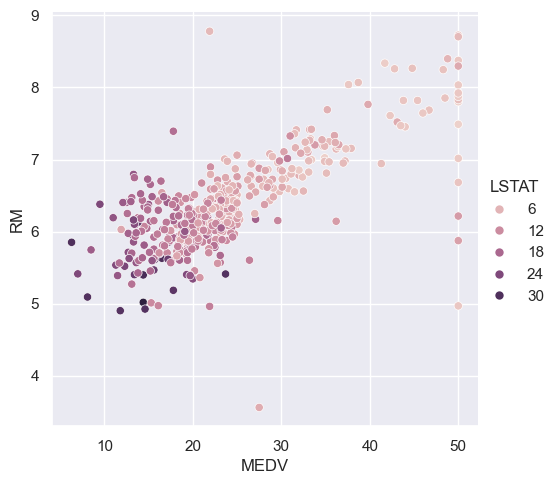

In [31]:
sns.relplot(data=df, x="MEDV", y="RM", hue="LSTAT")
plt.plot()

In [52]:
class LinearRegression():
    def __init__(self):
        self.slope = None
        self.intercept = None
        self.pred = None

    def fit(self, input, output):
        if not isinstance(input, np.ndarray):
            input = np.array(input)

        if not isinstance(output, np.ndarray):
            output = np.array(output)

        x_mean = np.mean(input)
        y_mean = np.mean(output)

        numerator_alpha = np.dot((input - x_mean) , (output - y_mean))
        denominator_alpha = np.sum((input - x_mean) ** 2)
        self.slope = numerator_alpha / denominator_alpha

        self.intercept = y_mean - self.slope * x_mean

        return self.slope, self.intercept

    def get_regression_predictions(self, input):
        if not isinstance(input, np.ndarray):
            input = np.array(input)

        self.pred = self.slope * input + self.intercept
        return self.pred

    def plot_regression(self, input, output, feature_name):
        if not isinstance(input, np.ndarray):
            input = np.array(input)

        if not isinstance(output, np.ndarray):
            output = np.array(output)

        x_min = np.min(input)
        x_max = np.max(input)
        x_reg = np.linspace(x_min, x_max, 100) 

        y_reg = self.slope * x_reg + self.intercept

        plt.scatter(input, output, alpha=.75, edgecolors='k', label= "Data")
        plt.plot(x_reg, y_reg, color='r', linewidth=2, label='Linear Fit') 

        plt.xlabel(f"Independent Variable({feature_name})")
        plt.ylabel("Dependent Variable")
        plt.title(f"Linear Regression(feature= {feature_name})")
        plt.legend()
        plt.show()

Train:


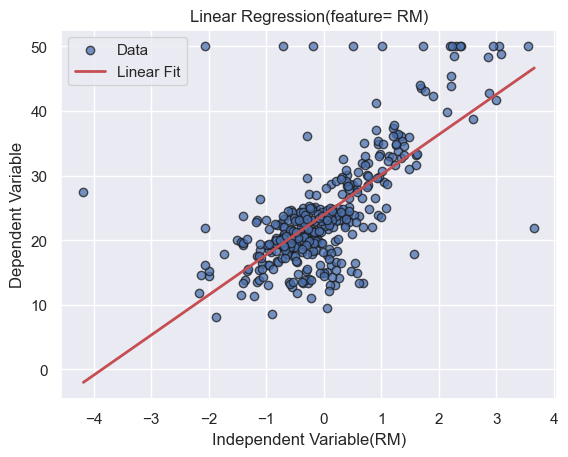

Test:


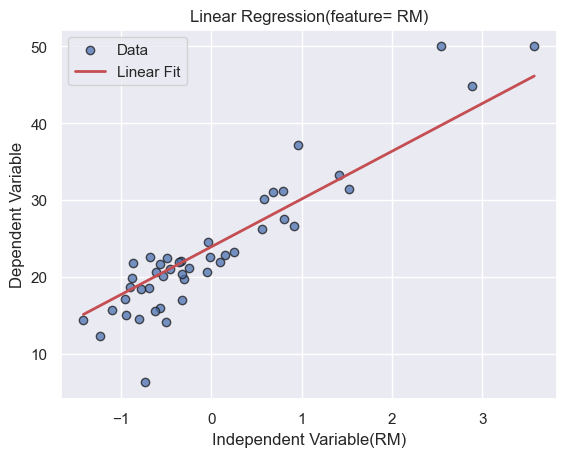

In [53]:
print("Train:")
linear_regression = LinearRegression()
slope, intercept = linear_regression.fit(X_train["RM"] ,y_train)
linear_regression.plot_regression(X_train["RM"], y_train, "RM")

print("Test:")
predictions = linear_regression.get_regression_predictions(X_test["RM"])
linear_regression.plot_regression(X_test["RM"] , y_test, "RM")

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    18. After selecting the appropriate feature from the train data and predicting the test data, we must determine a criterion to evaluate the efficiency of the obtained output. Since our model is performing a regression task and we have not done classification on it, it is not possible to use classification performance evaluation methods. Read about RSS, MSE, RMSE and 2R score methods and explain each one in your report.
</b> </h1>

- **Mean Squared Error (MSE)**: MSE is the average of the squares of the errors, which are the differences between the predicted and actual values.

- **Mean Absolute Error (MAE)**: MAE is the average of the absolute differences between the predicted and actual values.

- **Root Mean Squared Error (RMSE)**: RMSE is the square root of the MSE. It's a measure of the differences between values predicted by a model and the values actually observed.

- **R² Score (Coefficient of Determination)**: R² Score is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

$$ 
    R^2 = 1 - \frac{SSres}{SStot} = 1 - \frac{\sum_{i=1}^{n} (y_{i,true} - y_{i,pred})^2}{\sum_{i=1}^{n} (y_{i,true} - \bar{y}_{true})^2}
$$

In [142]:
class Metrics:
    def get_mean_squared_error(self, actual_values):
        return ((actual_values - self.pred) ** 2).mean()

    def get_mean_absolute_error(self, actual_values):
        return np.abs(actual_values - self.pred).mean()

    def get_root_mean_square_error(self, actual_values):
        return np.sqrt(self.get_mean_squared_error(actual_values))

    def get_r2_score(self, actual_values):
        res = np.sum((actual_values - self.pred) ** 2)
        tot = np.sum((actual_values - np.mean(actual_values)) ** 2)
        return 1 - (res / tot)

    def plot_actual_vs_predicted_for_train_data(self, y_true, feature_name):
        plt.scatter(y_true, self.pred, alpha=.75, edgecolors='k')
        plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.title(f'Actual vs Predicted(feature= {feature_name})')
        plt.show()

class LinearRegression(Metrics):
    def __init__(self):
        self.slope = None
        self.intercept = None
        self.pred = None

    def fit(self, input, output):
        if not isinstance(input, np.ndarray):
            input = np.array(input)

        if not isinstance(output, np.ndarray):
            output = np.array(output)

        x_mean = np.mean(input)
        y_mean = np.mean(output)

        numerator_alpha = np.dot((input - x_mean) , (output - y_mean))
        denominator_alpha = np.sum((input - x_mean) ** 2)
        self.slope = numerator_alpha / denominator_alpha

        self.intercept = y_mean - self.slope * x_mean

        return self.slope, self.intercept

    def get_regression_predictions(self, input):
        if not isinstance(input, np.ndarray):
            input = np.array(input)

        self.pred = self.slope * input + self.intercept
        return self.pred

    def plot_regression(self, input, output, feature_name):
        if not isinstance(input, np.ndarray):
            input = np.array(input)

        if not isinstance(output, np.ndarray):
            output = np.array(output)

        x_min = np.min(input)
        x_max = np.max(input)
        x_reg = np.linspace(x_min, x_max, 100) 

        y_reg = self.slope * x_reg + self.intercept

        plt.scatter(input, output, alpha=.75, edgecolors='k', label= "Data")
        plt.plot(x_reg, y_reg, color='r', linewidth=2, label='Linear Fit') 

        plt.xlabel(f"Independent Variable({feature_name})")
        plt.ylabel("Dependent Variable")
        plt.title(f"Linear Regression(feature= {feature_name})")
        plt.show()

In [55]:
linear_regression = LinearRegression()
slope, intercept = linear_regression.fit(X_train["RM"] ,y_train)
predictions = linear_regression.get_regression_predictions(X_test["RM"])

print(f"RMSE: {linear_regression.get_root_mean_square_error(y_test):.4f}")
print(f"R2 score: {linear_regression.get_r2_score(y_test):.4f}")

RMSE: 3.6740
R2 score: 0.8297


<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    19. Using the RMSE method and 2R score, evaluate the predicted values. Do the above operations on a few other features as well. What do you infer from the obtained values?
</b> </h1>

In [56]:
designated_feature_list = ['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'TAX', 'PTRATIO', 'B', 'LSTAT']
scores = {'Feature': [], "MSE": [], 'MAE': [], 'RMSE': [], 'R2 score': []}
scores_df = pd.DataFrame(scores)

for i, feature in enumerate(designated_feature_list):
    linear_regression = LinearRegression()
    slope, intercept = linear_regression.fit(X_train[feature] ,y_train)
    predictions = linear_regression.get_regression_predictions(X_test[feature])
    new_row = {'Feature': feature, 
               'MSE': linear_regression.get_mean_squared_error(y_test),
               'MAE': linear_regression.get_mean_absolute_error(y_test), 
               'RMSE': linear_regression.get_root_mean_square_error(y_test),
               'R2 score': linear_regression.get_r2_score(y_test)}
    scores_df.loc[i] = new_row

scores_df

,Feature,MSE,MAE,RMSE,R2 score
0,CRIM,68.960110,6.382301,8.304222,0.130002
1,ZN,73.446773,6.019501,8.570109,0.073399
2,INDUS,65.871232,6.118283,8.116109,0.168972
3,NOX,70.478806,6.466479,8.395166,0.110843
4,RM,13.498286,2.640938,3.674001,0.829706
5,AGE,75.855170,6.739165,8.709487,0.043015
6,DIS,80.153979,6.656924,8.952875,-0.011219
7,TAX,68.170907,6.256891,8.256568,0.139959
8,PTRATIO,58.927999,5.356830,7.676457,0.256567
9,B,80.413524,6.846294,8.967359,-0.014493


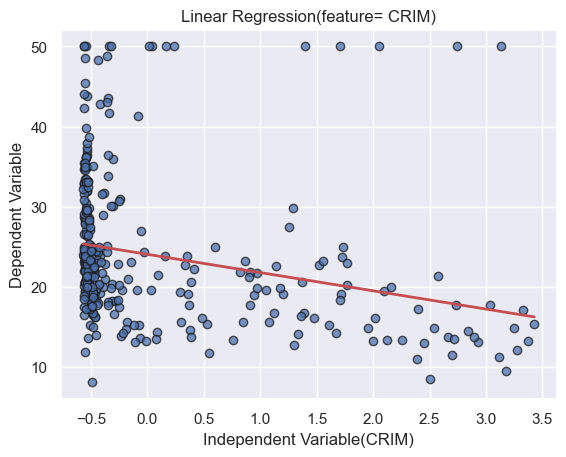

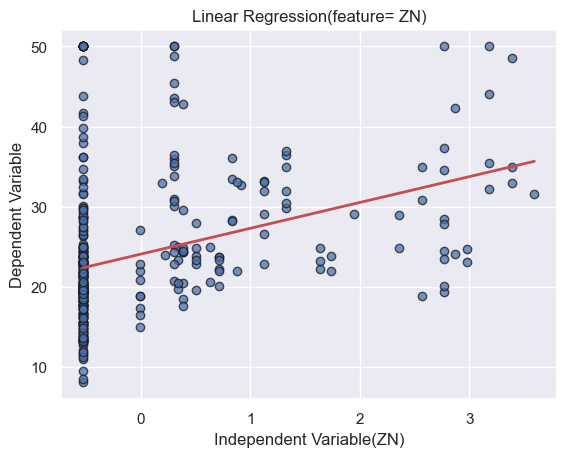

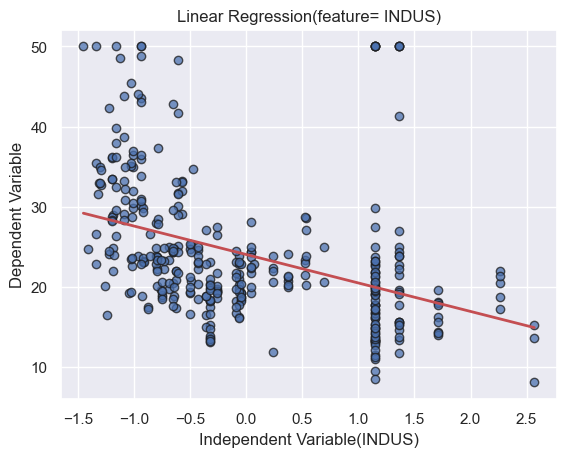

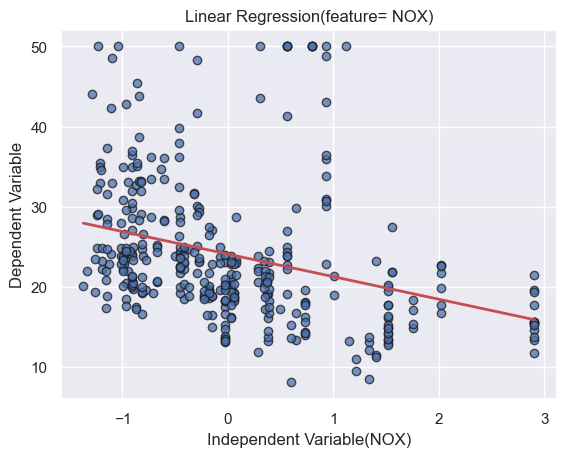

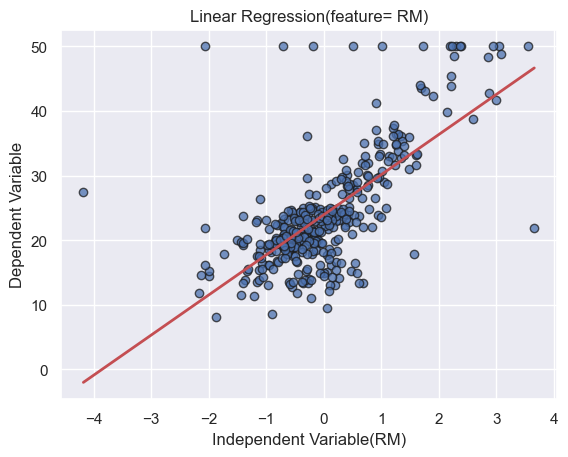

...

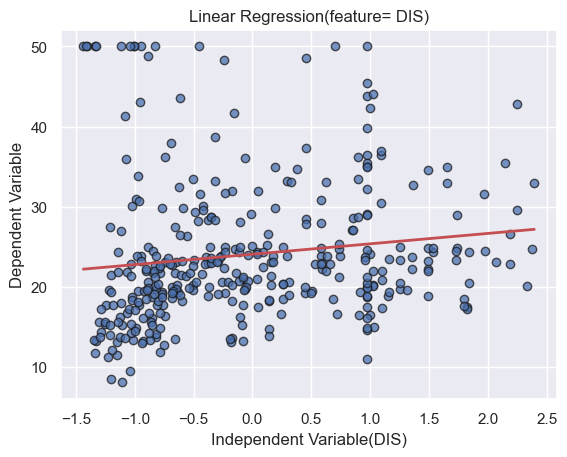

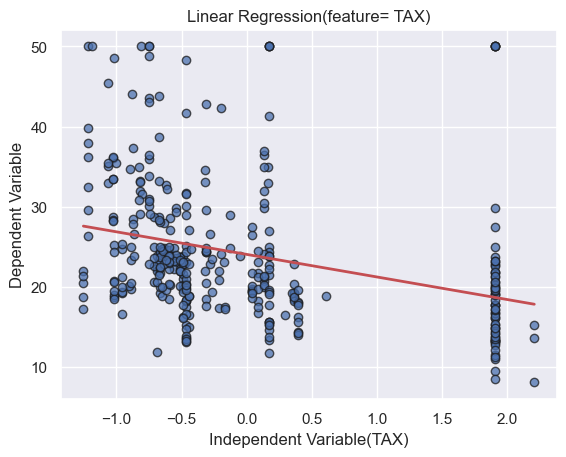

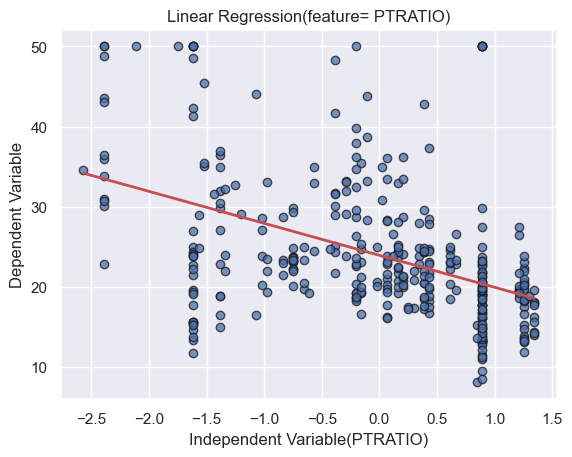

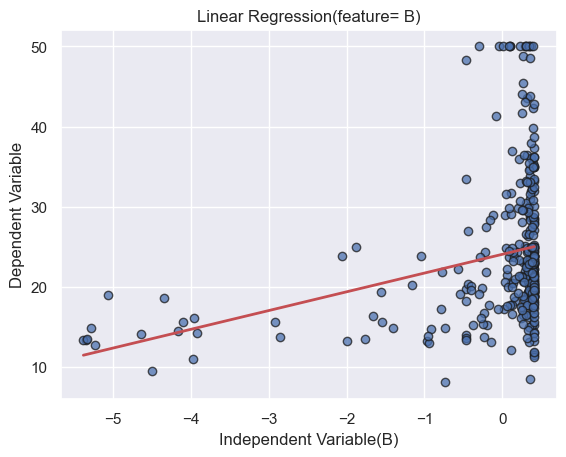

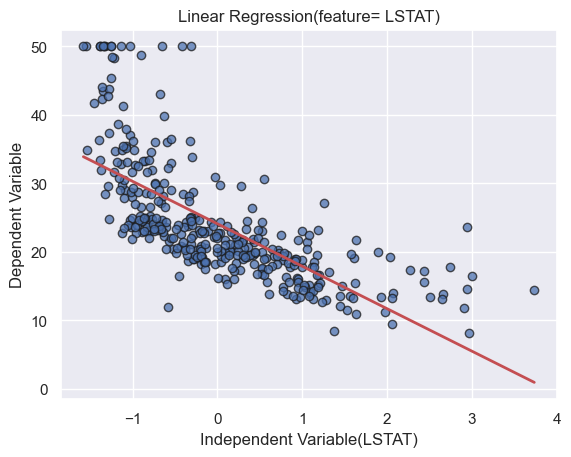

In [57]:
designated_feature_list = ['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'TAX', 'PTRATIO', 'B', 'LSTAT']

for feature in designated_feature_list:
    linear_regression = LinearRegression()
    slope, intercept = linear_regression.fit(X_train[feature] ,y_train)
    predictions = linear_regression.get_regression_predictions(X_test[feature])
    linear_regression.plot_regression(X_train[feature] ,y_train, feature)

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    20. Compare the predicted values ​​with the actual values ​​using a scatter plot, where the x-axis represents the actual values ​​and the y-axis represents the predicted values. Also draw the line y = x.
</b> </h1>

In [61]:
def plot_actual_vs_predicted_for_train_data(y_true, y_pred, feature_name):
    plt.scatter(y_true, y_pred, alpha=.75, edgecolors='k')
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title(f'Actual vs Predicted(feature= {feature_name})')
    plt.show()

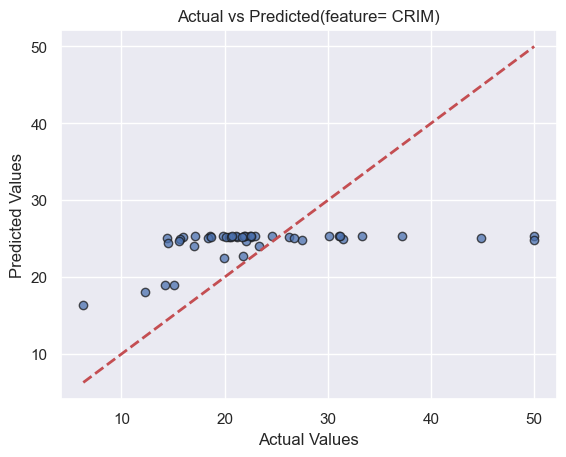

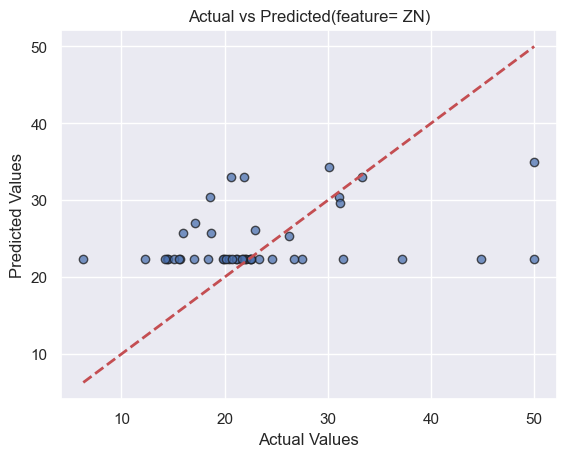

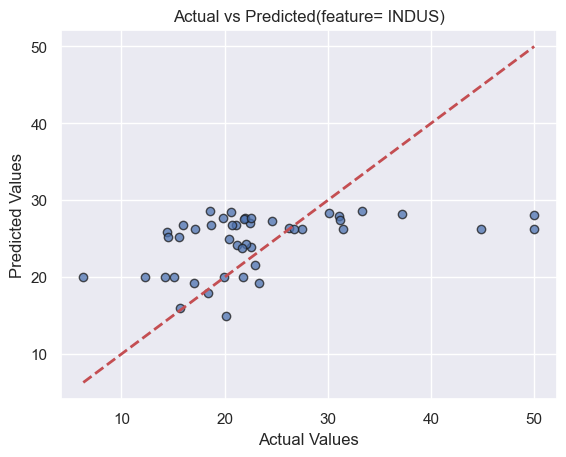

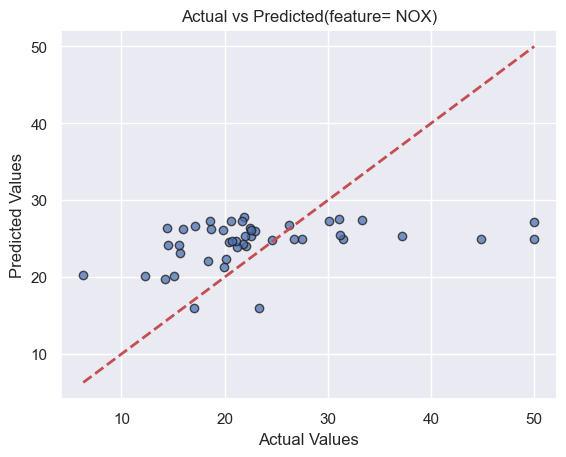

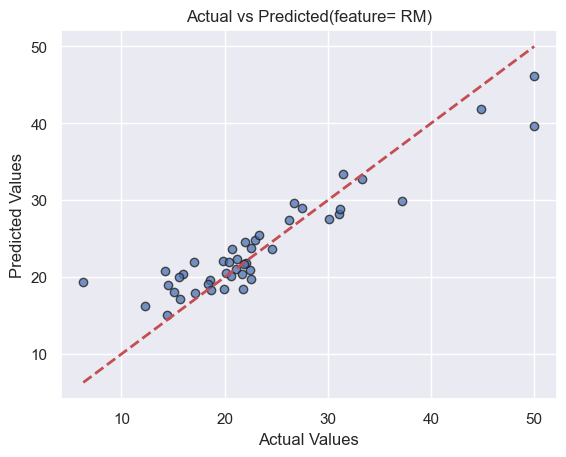

...

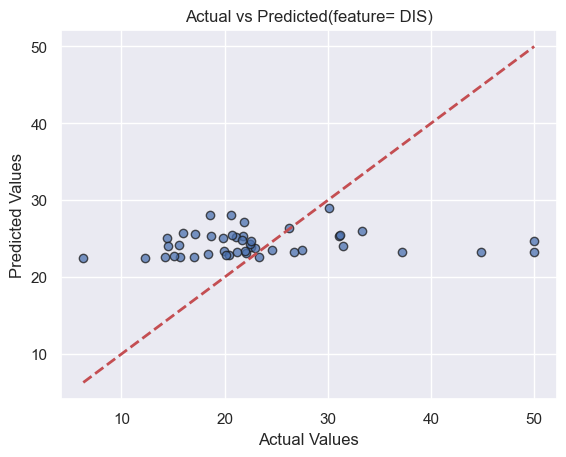

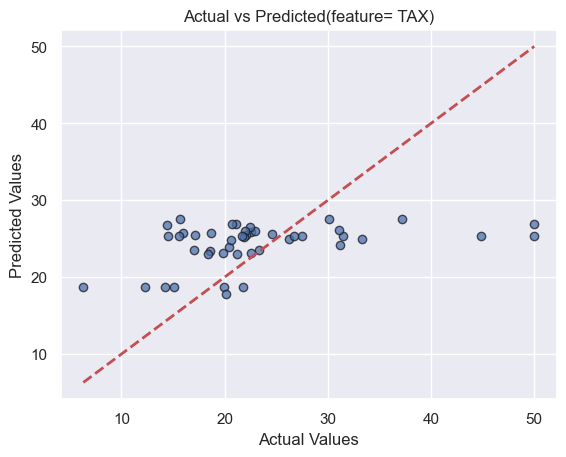

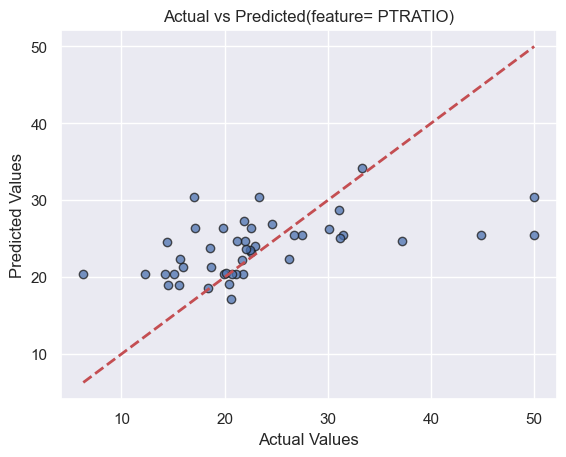

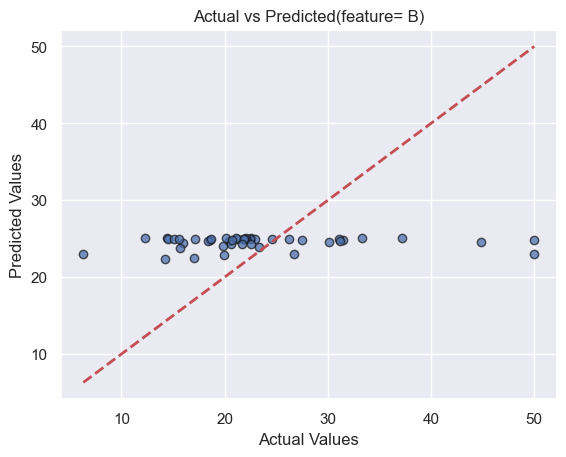

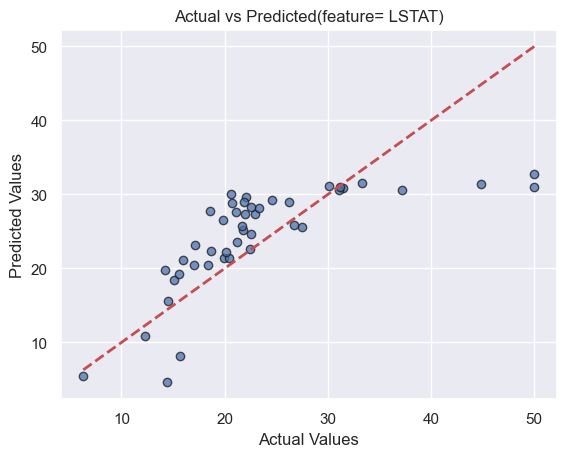

In [62]:
designated_feature_list = ['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'DIS', 'TAX', 'PTRATIO', 'B', 'LSTAT']

for feature in designated_feature_list:
    linear_regression = LinearRegression()
    slope, intercept = linear_regression.fit(X_train[feature] ,y_train)
    predictions = linear_regression.get_regression_predictions(X_test[feature])
    linear_regression.plot_actual_vs_predicted_for_train_data(y_test, feature)

<a id='phase2'></a>

<h1 style = "color:red;font-size:30px" dir = "ltr"> <b>
    Phase II: polynomial Regression
</b> </h1>

![polynomial Regression](https://meesaan.github.io/enigma.github.io/images/diamonds/bias_var.png)

**Ploynomial Regression**:

To extend the simple linear regression to polynomial regression, we can model the relationship between the independent variable $x$ and the dependent variable $y$ as a polynomial function of degree $n$:

$$f(x) = \beta_0 + \beta_1x + \beta_2x^2 + \ldots + \beta_nx^n$$

The steps to find the parameters $\beta_i$ are similar to those in simple linear regression. We again minimize the RSS function by taking the derivatives with respect to each parameter and setting them to 0.

- Step 1: Compute the RSS function for polynomial regression:

$$ RSS = \Sigma (y_i - (\hat{\beta_0} + \hat{\beta_1}x_i + \hat{\beta_2}x_i^2 + \ldots + \hat{\beta_n}x_i^n))^2 $$

- Step 2: Compute the derivatives of the RSS function with respect to each parameter $\beta_i$ and set them to 0 to find the desired parameters.

$$ \frac{\partial RSS}{\partial \beta_i} = 0, \text{ for } i = 0, 1, 2, \ldots, n$$

Solving these equations will give us the optimal values of $\beta_i$ for the polynomial regression model. The specific form of the equations will depend on the degree of the polynomial and the number of parameters.

The general form for finding the coefficients for polynomial regression can be represented as:

$$ \beta = (X^T X)^{-1} X^T y $$

where:
- $X$ is the design matrix with columns $x^0, x^1, x^2, ..., x^n$
- $x^i$ represents the feature vector of $x$ raised to the power of $i$
- $y$ is the target variable vector
- $\beta$ is the coefficient vector for the polynomial regression

By solving for $\beta$ using the above formula, we can obtain the coefficients for the polynomial regression model.

In [63]:
class PolynomialRegression(Metrics):
    def __init__(self):
        self.degree = None
        self.betas = None
        self.pred = None

    def get_polynomial_features(self, X):
        X = np.array(X).reshape(-1, 1)
        output = np.ones((len(X), 1))
        for d in range(1, self.degree + 1):
            output = np.hstack((output, X**d))
        return output

    def fit(self, X, y, degree=2):
        self.degree = degree 
        X_poly = self.get_polynomial_features(X)
        self.betas = np.linalg.inv(X_poly.T @ X_poly) @ X_poly.T @ y

    def predict(self, X_test):
        new_X_poly = self.get_polynomial_features(X_test)
        self.pred = new_X_poly @ self.betas
        return self.pred
        
    def visualize_regression(self, X_train, y_train, y_test, feature_name):
        new_x = np.linspace(X_train.min(), X_train.max(), 100)
        new_X_poly = self.get_polynomial_features(new_x)
        y_hat = new_X_poly @ self.betas

        plt.figure(figsize=(12, 5))
        plt.subplot(1,2,1)
        plt.plot(new_x, y_hat, 'r', alpha=1, linewidth=2, label='Polynomial Fit')
        plt.scatter(X_train, y_train, alpha=.75, edgecolors='k', label='Data')
        plt.xlabel(feature_name)
        plt.ylabel('MEDV')
        plt.title(f'Train: Polynomial Regression (Degree= {self.degree})')
        plt.legend()

        plt.subplot(1,2,2)
        plt.scatter(y_test, self.pred, alpha=.75, edgecolors='k')
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.title(f'Test: Actual vs Predicted(feature= {feature_name})')
        plt.show()

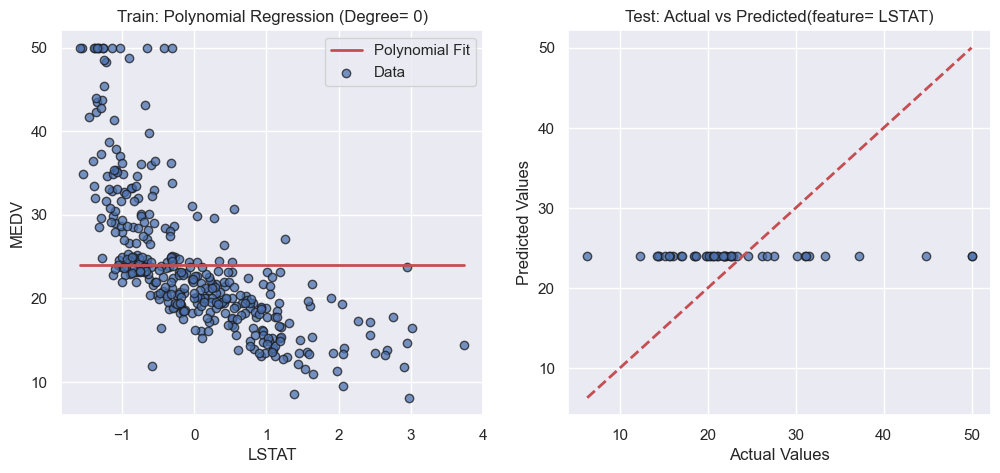

RMSE: 8.9387
R2 score: -0.0080


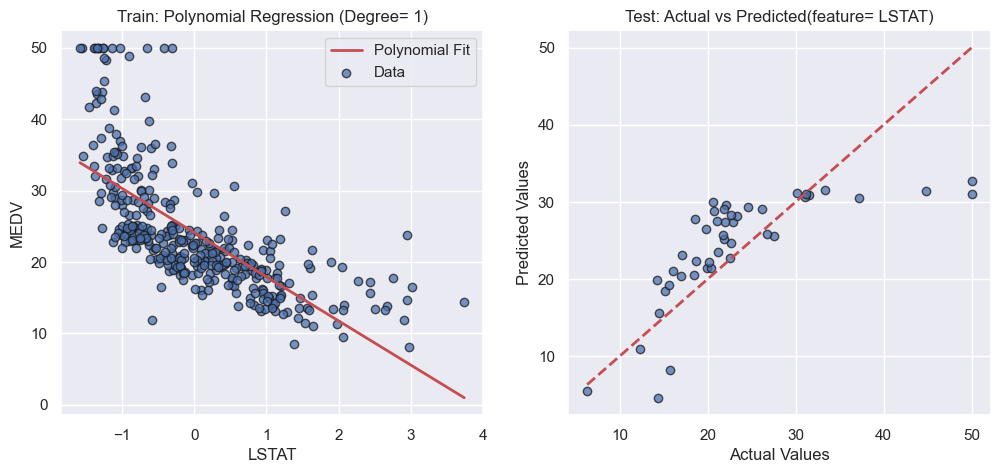

RMSE: 6.3383
R2 score: 0.4932


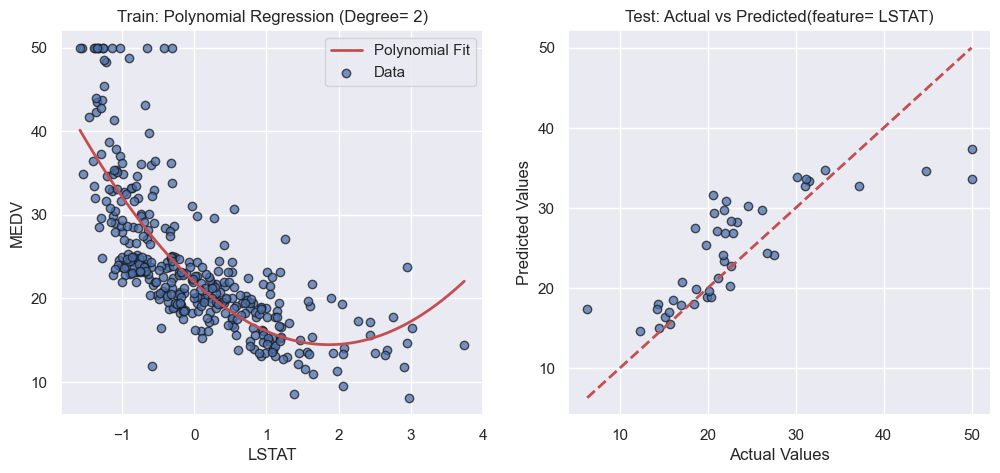

RMSE: 5.6078
R2 score: 0.6033


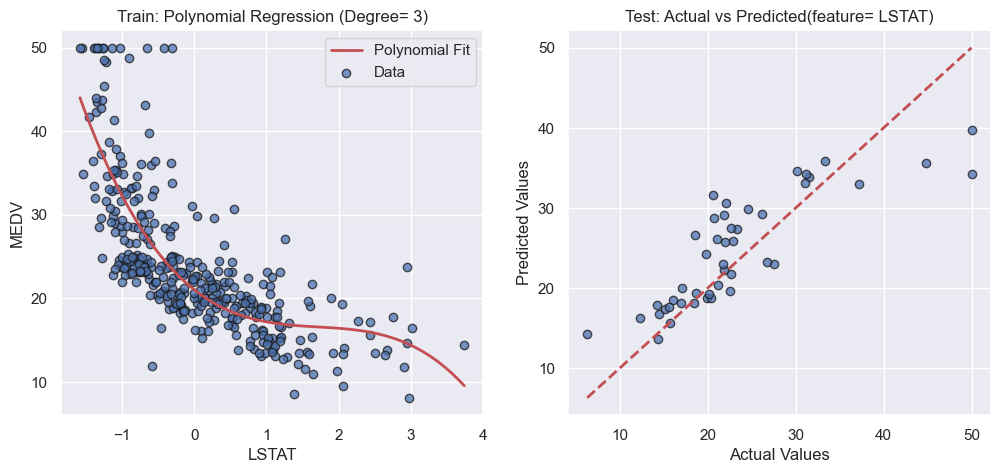

RMSE: 5.1535
R2 score: 0.6649


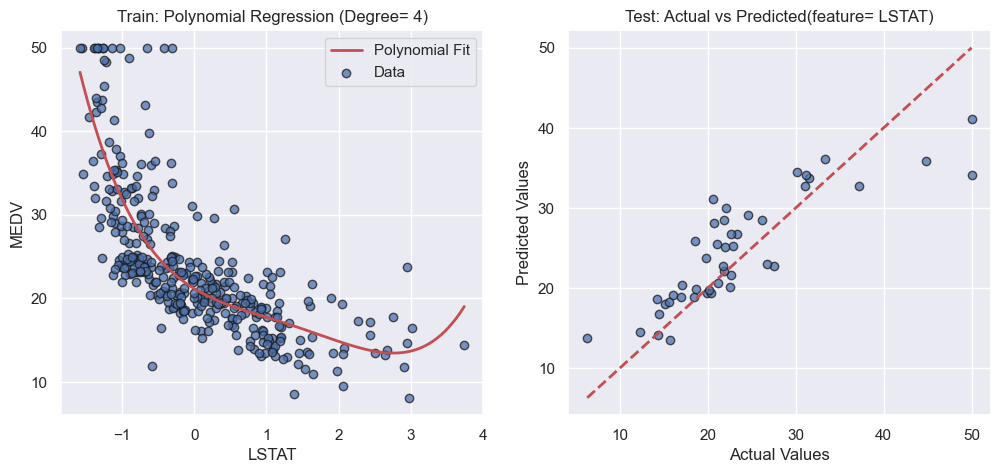

RMSE: 4.9041
R2 score: 0.6966


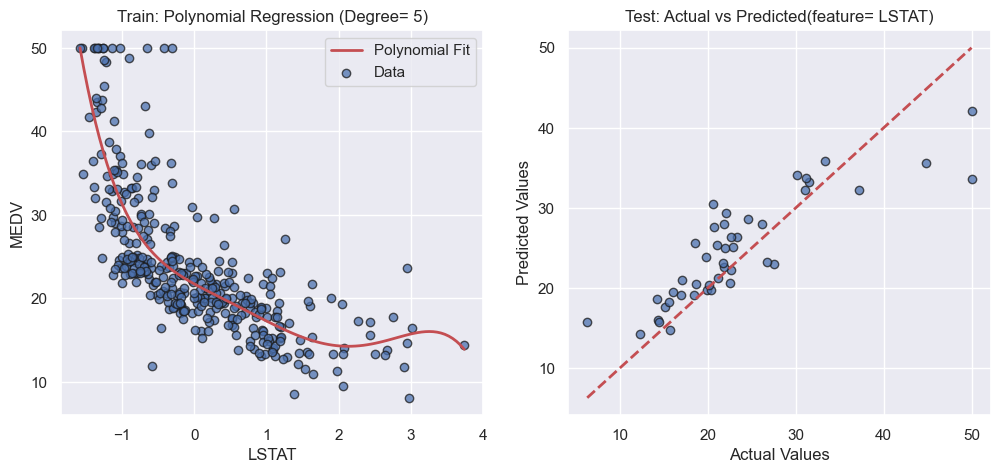

RMSE: 4.8463
R2 score: 0.7037


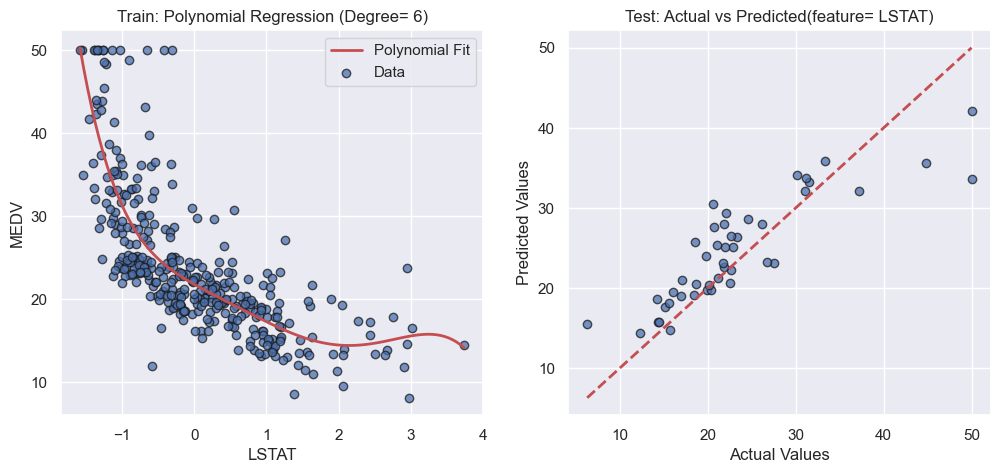

RMSE: 4.8354
R2 score: 0.7050


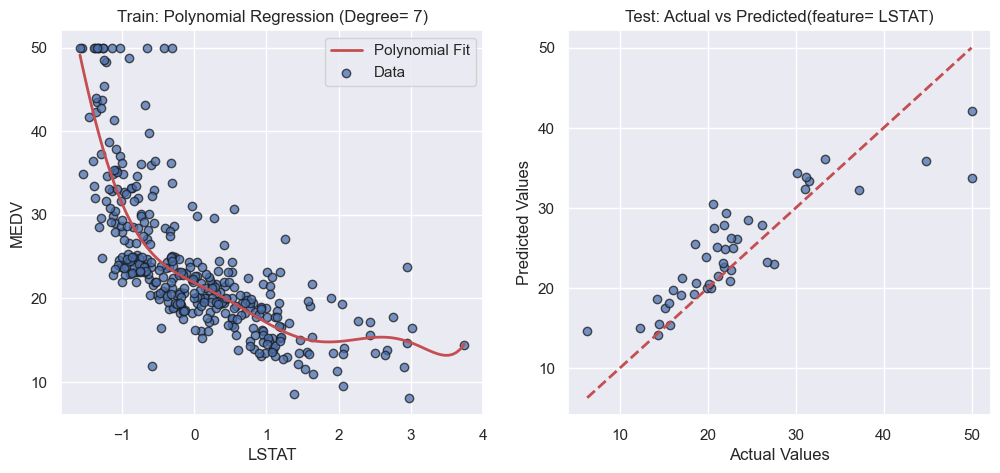

RMSE: 4.7578
R2 score: 0.7144


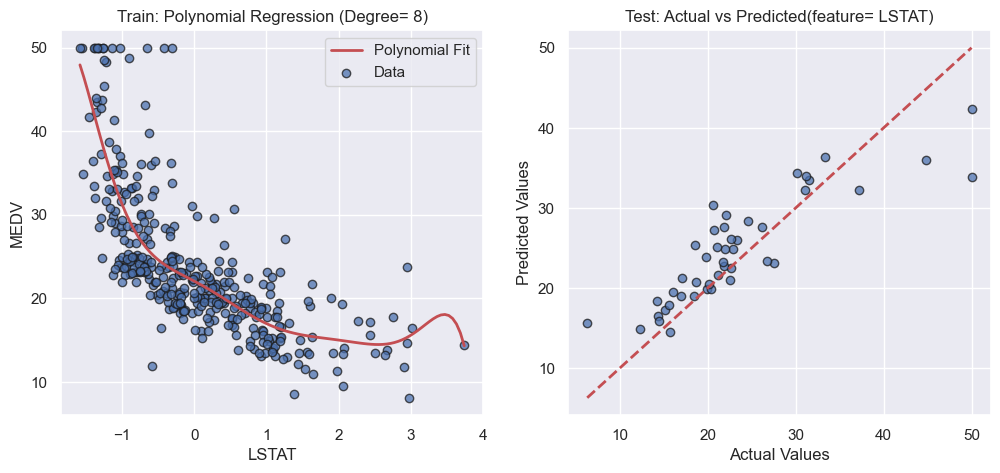

RMSE: 4.7457
R2 score: 0.7159


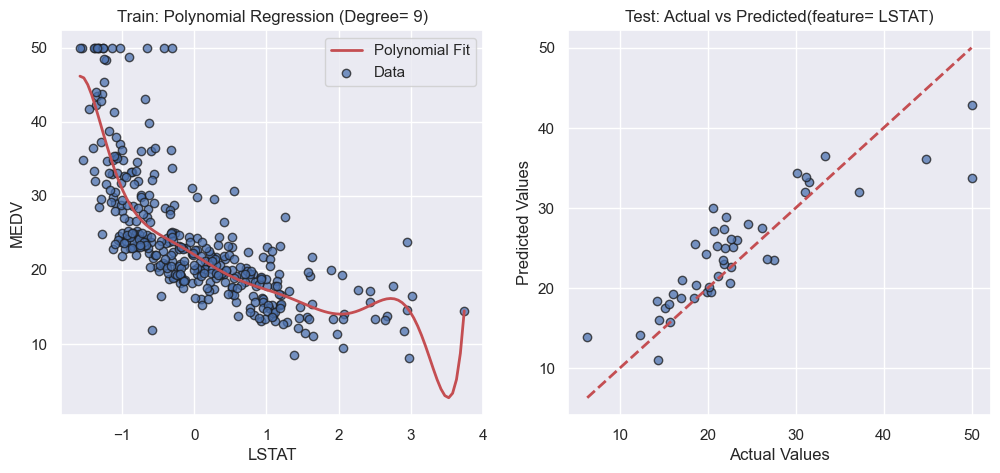

RMSE: 4.6270
R2 score: 0.7299


In [64]:
for i in range(10):    
    polynomial_regression = PolynomialRegression()
    polynomial_regression.fit(X_train["LSTAT"], y_train, degree=i)
    predictions = polynomial_regression.predict(X_test["LSTAT"])
    polynomial_regression.visualize_regression(X_train["LSTAT"], y_train, y_test, "LSTAT")
    print(f"RMSE: {polynomial_regression.get_root_mean_square_error(y_test):.4f}")
    print(f"R2 score: {polynomial_regression.get_r2_score(y_test):.4f}")

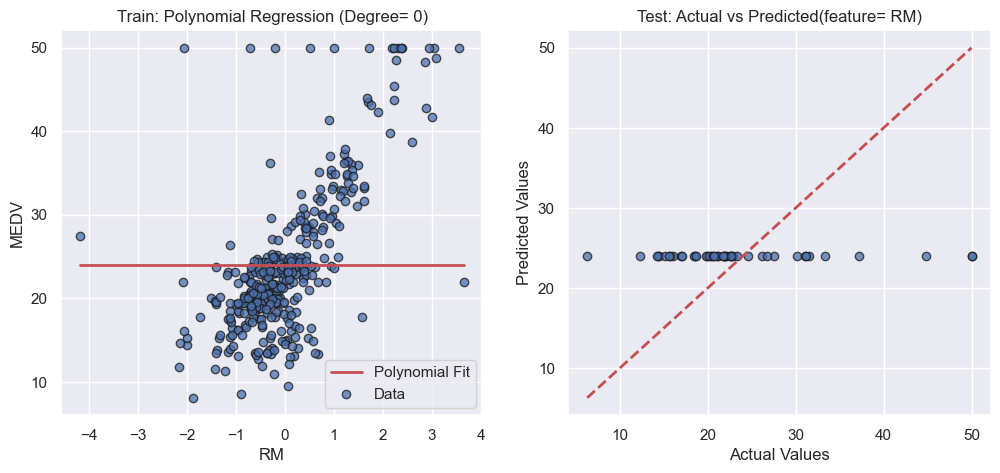

RMSE: 8.9387
R2 score: -0.0080


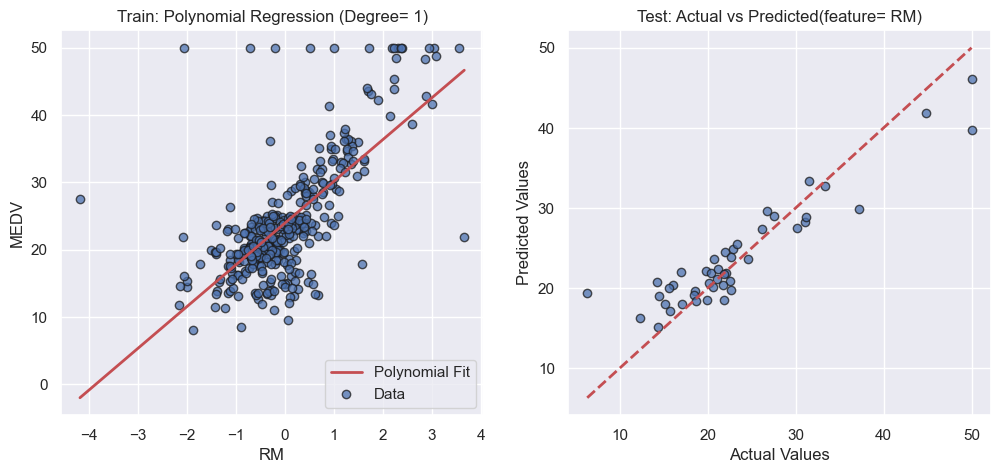

RMSE: 3.6740
R2 score: 0.8297


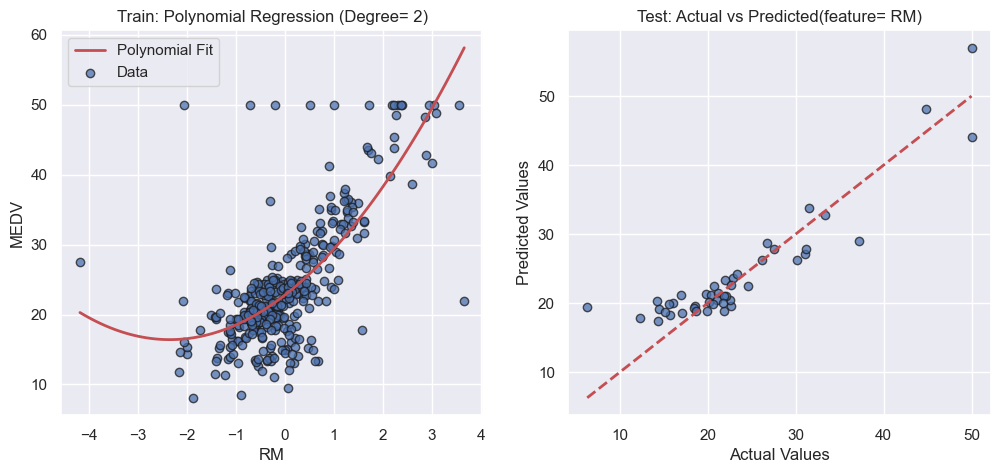

RMSE: 3.6547
R2 score: 0.8315


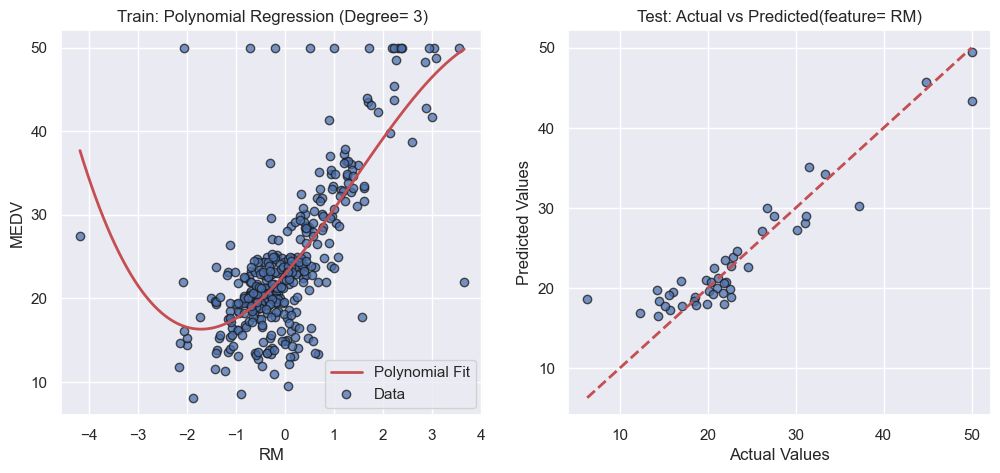

RMSE: 3.2714
R2 score: 0.8650


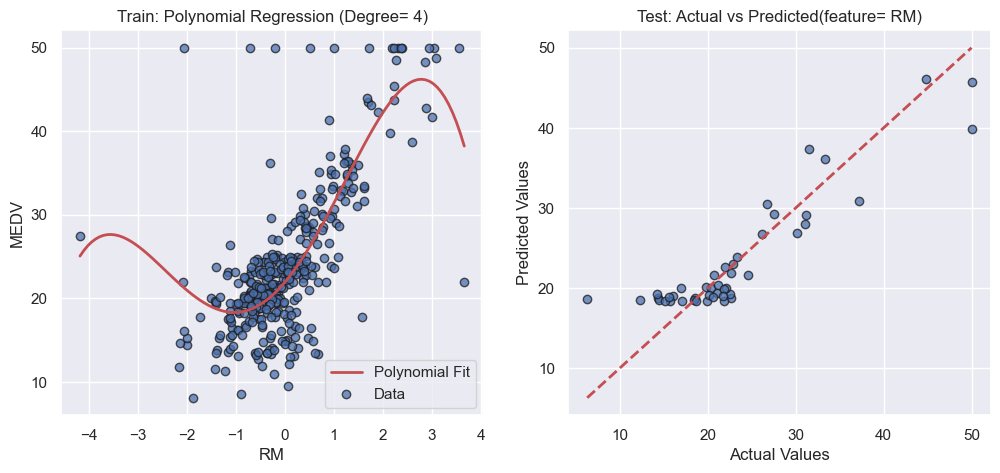

RMSE: 3.7066
R2 score: 0.8267


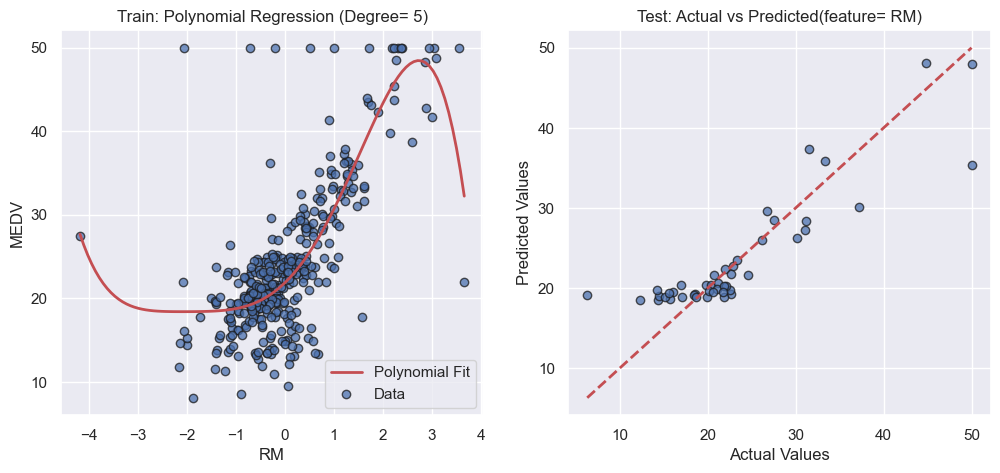

RMSE: 4.0979
R2 score: 0.7881


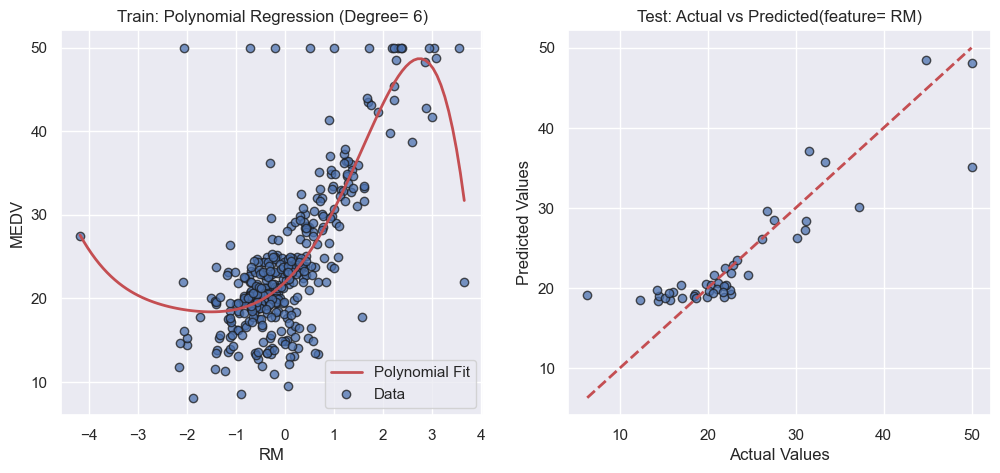

RMSE: 4.1051
R2 score: 0.7874


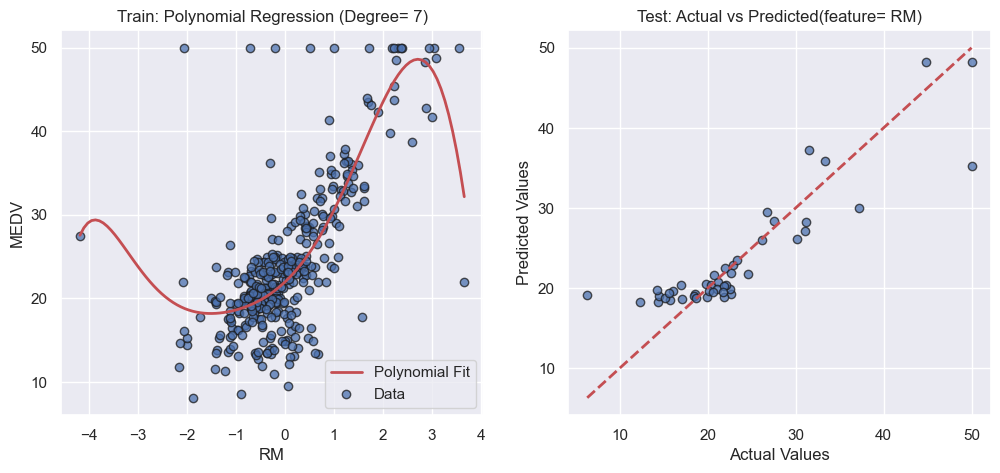

RMSE: 4.0927
R2 score: 0.7887


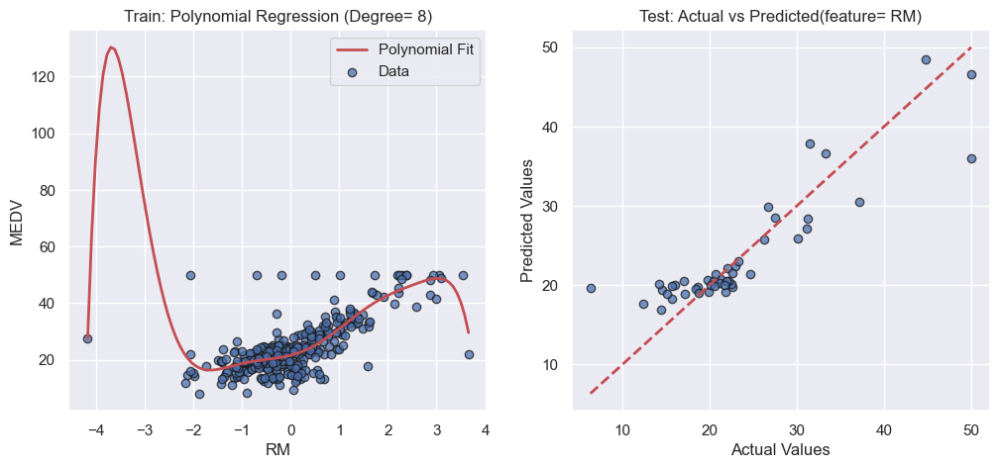

RMSE: 4.1049
R2 score: 0.7874


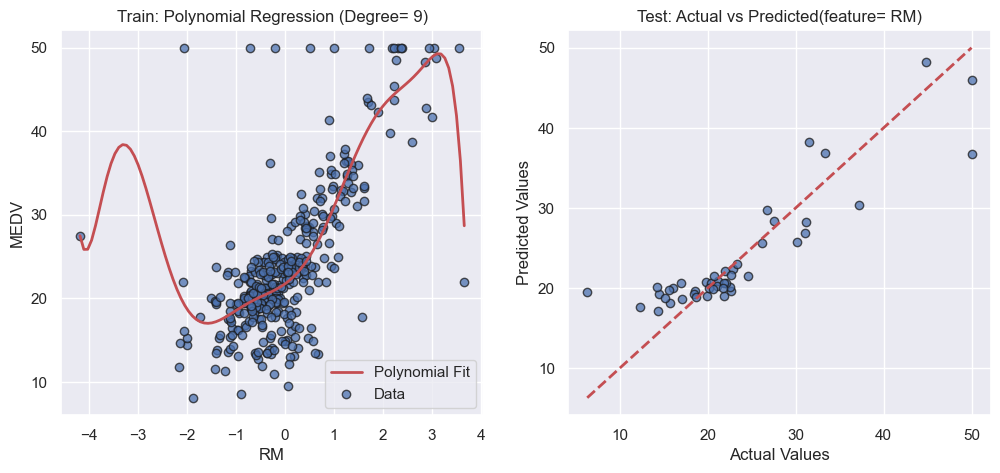

RMSE: 4.0671
R2 score: 0.7913


In [65]:
for i in range(10):    
    polynomial_regression = PolynomialRegression()
    polynomial_regression.fit(X_train["RM"], y_train, degree=i)
    predictions = polynomial_regression.predict(X_test["RM"])
    polynomial_regression.visualize_regression(X_train["RM"], y_train, y_test, "RM")
    print(f"RMSE: {polynomial_regression.get_root_mean_square_error(y_test):.4f}")
    print(f"R2 score: {polynomial_regression.get_r2_score(y_test):.4f}")

**Computing the Derivative**:

As we saw, the cost function is the sum over the data points of the squared difference between an observed output and a predicted output.

Since the derivative of a sum is the sum of the derivatives, we can compute the derivative for a single data point and then sum over data points. We can write the squared difference between the observed output and predicted output for a single point as follows:

$$
(output  - (const* w _{0} + [feature_1] * w_{1} + ...+ [feature_n] * w_{n}  ))^2
$$

With n feautures and a const , So the derivative will be :


$$
2 * (output  - (const* w _{0} + [feature_1] * w_{1} + ...+ [feature_n] * w_{n}  ))
$$

The term inside the paranethesis is just the error (difference between prediction and output). So we can re-write this as:

$$2 * error*[feature_i] $$


That is, the derivative for the weight for feature i is the sum (over data points) of 2 times the product of the error and the feature itself. In the case of the constant then this is just twice the sum of the errors!

Recall that twice the sum of the product of two vectors is just twice the dot product of the two vectors. Therefore the derivative for the weight for feature_i is just two times the dot product between the values of feature_i and the current errors.


With this in mind, complete the following derivative function which computes the derivative of the weight given the value of the feature (over all data points) and the errors (over all data points).


In [66]:
def feature_derivative(errors, feature):
    return 2 * np.dot(feature.T, errors)

**Gradient Descent**:

![Gradient Descent](https://res.cloudinary.com/practicaldev/image/fetch/s--5fkyAYDR--/c_limit%2Cf_auto%2Cfl_progressive%2Cq_66%2Cw_880/https://cdn-images-1.medium.com/max/1600/0%2AD7zG46WrdKx54pbU.gif)

Now we will write a function that performs a gradient descent. The basic premise is simple. Given a starting point we update the current weights by moving in the negative gradient direction. Recall that the gradient is the direction of increase and therefore the negative gradient is the direction of decrease and we're trying to minimize a cost function.


The amount by which we move in the negative gradient direction is called the 'step size'. We stop when we are 'sufficiently close' to the optimum. We define this by requiring that the magnitude (length) of the gradient vector to be smaller than a fixed 'tolerance'.


With this in mind, complete the following gradient descent function below using your derivative function above. For each step in the gradient descent we update the weight for each feature befofe computing our stopping criteria.

In [67]:
def normalize_features(chosen_features, data_frame):
    for feature in chosen_features:
        data_frame[feature] = (data_frame[feature] - data_frame[feature].mean()) / data_frame[feature].std()
    return data_frame

def predict_output(feature_matrix, weights, bias):
    return np.dot(feature_matrix, weights) + bias

**Polynomial Regression Using Gradient Descent**:

Polynomial regression using gradient descent involves finding the optimal parameters for a polynomial model by iteratively updating them based on the gradient of a loss function, typically the Mean Squared Error (MSE). The steps involved are as follows:

- **Step 1: Define the polynomial model**
The polynomial model has the form:
$$f(x) = \beta_0 + \beta_1x + \beta_2x^2 + \ldots + \beta_nx^n$$

- **Step 2: Define the loss function**
The loss function, such as Mean Squared Error (MSE), measures the error between the actual target values and the predicted values by the model.

- **Step 3: Initialize the coefficients**
Start with initial guesses for the coefficients $\beta_0, \beta_1, \ldots, \beta_n$

- **Step 4: Update the coefficients using Gradient Descent**
Iteratively update the coefficients to minimize the loss function. This is done by computing the gradient of the loss function with respect to each coefficient and making small adjustments in the opposite direction of the gradient.

- **Step 5: Repeat until convergence**
Continue updating the coefficients iteratively until the algorithm converges to the optimal values.

- **Step 6: Use the learned coefficients for prediction**
Once the coefficients converge, they can be used in the polynomial function to make predictions on new data points.

Overall, polynomial regression using gradient descent is an iterative optimization process that aims to find the best-fitting polynomial curve to the data points by minimizing the prediction errors. The learning rate and the number of iterations are key hyperparameters to tune for efficient convergence and accurate modeling.



In [68]:
def polynomial_regression_gradient_descent(feature_matrix, outputs, initial_weights, bias, step_size, tolerance):
    weights = np.array(initial_weights)
    while True:
        predicted_values= predict_output(feature_matrix, weights, bias)
        errors = outputs - predicted_values
        derivative = feature_derivative(errors, feature_matrix)
        bias += step_size * np.sum(errors)
        weights += step_size * derivative
        gradient_length = np.linalg.norm(derivative)
        if gradient_length <= tolerance:
            break

    return weights, bias

**Implementation**:

In [143]:
class PolynomialRegressionGradientDescent(Metrics):
    def __init__(self):
        self.degree = None
        self.weights = None
        self.bias = None
        self.pred = None
        self.max_iter = 400000

    def feature_derivative(self, errors, feature):
        return 2 * np.dot(feature.T, errors)

    def predict_output(self, feature_matrix):
        return np.dot(feature_matrix, self.weights) + self.bias

    def normalize_features(self, feature_matrix):
        feature_matrix_normal = (feature_matrix - feature_matrix.mean()) / feature_matrix.std()
        return feature_matrix_normal

    def get_polynomial_features(self ,X):
        X = np.array(X).reshape(-1, 1)
        output = X**1
        for d in range(2, self.degree + 1):
            output = np.hstack((output, X**d))
        return output
    
    def fit_with_gradient_descent(self, feature_matrix, outputs, initial_weights, bias, step_size, tolerance):
        self.weights = np.array(initial_weights)
        self.bias = bias
        iteration = 0
        while True:
            predicted_values = self.predict_output(feature_matrix)
            errors = outputs - predicted_values
            derivative = self.feature_derivative(errors, feature_matrix)
            self.bias += step_size * 2 * np.sum(errors)
            self.weights += step_size * derivative
            gradient_length = np.linalg.norm(derivative)
            iteration += 1
            if gradient_length <= tolerance or iteration > self.max_iter:
                break

        return self.weights, self.bias
    
    def run_polynomial_regression(self, chosen_feature_matrix, target_matrix, keywords):
        initial_weights = keywords['initial_weights']
        step_size = keywords['step_size']
        tolerance = keywords['tolerance']
        bias = keywords['bias']
        weights = np.array(initial_weights)
        weights, bias = self.fit_with_gradient_descent(chosen_feature_matrix, target_matrix, weights, bias, step_size, tolerance)
        return weights, bias


    def get_weights_and_bias(self, X_train, y_train, degree):
        keywords = {
            'initial_weights': np.array([.5]*degree),
            'step_size': 1.e-7,
            'tolerance': 9.e-8,
            'bias': 0
        }

        self.degree = degree
        chosen_feature_matrix = self.get_polynomial_features(X_train)
        target_matrix = y_train.to_numpy().flatten()
        train_weights, bias = self.run_polynomial_regression(chosen_feature_matrix, target_matrix, keywords)

        return chosen_feature_matrix, train_weights, bias

    def predict(self, X_test):
        new_X_poly = self.get_polynomial_features(X_test)
        self.pred = np.dot(new_X_poly, self.weights) + self.bias
        return self.pred
    
    def visualize_regression(self, X_train, y_train, y_test, feature_name):
        sns.set_theme()
        new_x = np.linspace(X_train.min(), X_train.max(), 100)
        new_X_poly = self.get_polynomial_features(new_x)
        y_hat = self.predict_output(new_X_poly)

        plt.figure(figsize=(12, 5))
        plt.subplot(1,2,1)
        plt.plot(new_x, y_hat, 'r', alpha=1, linewidth=2, label='Polynomial Fit')
        plt.scatter(X_train, y_train, alpha=.75, edgecolors='k', label='Data')
        plt.xlabel(feature_name)
        plt.ylabel('MEDV')
        plt.title(f'Train: Polynomial Regression (Degree= {self.degree})')
        plt.legend()

        plt.subplot(1,2,2)
        plt.scatter(y_test, self.pred, alpha=.75, edgecolors='k')
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.title(f'Test: Actual vs Predicted(feature= {feature_name})')
        plt.show()

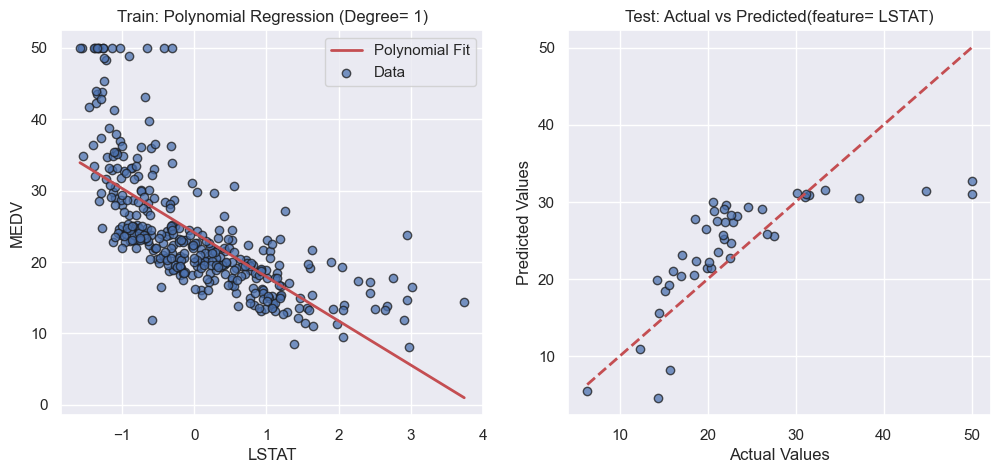

RMSE: 6.3383
R2 score: 0.4932


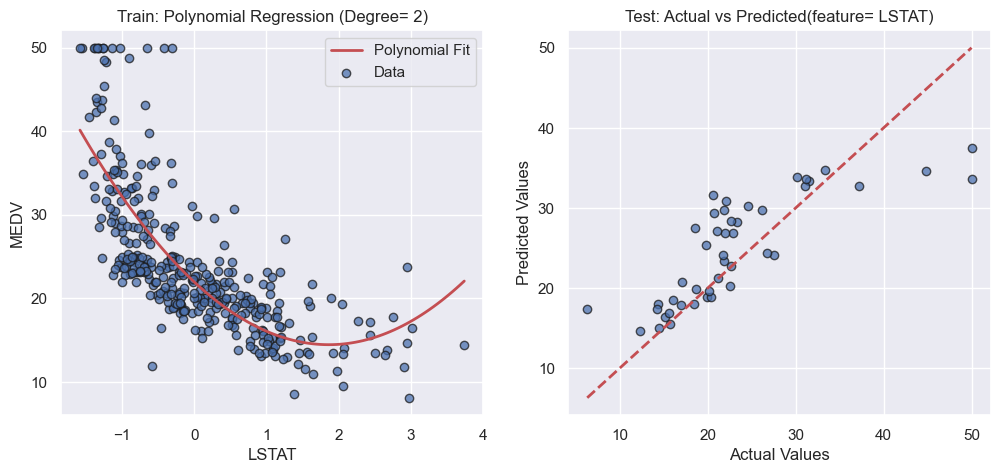

RMSE: 5.6073
R2 score: 0.6033


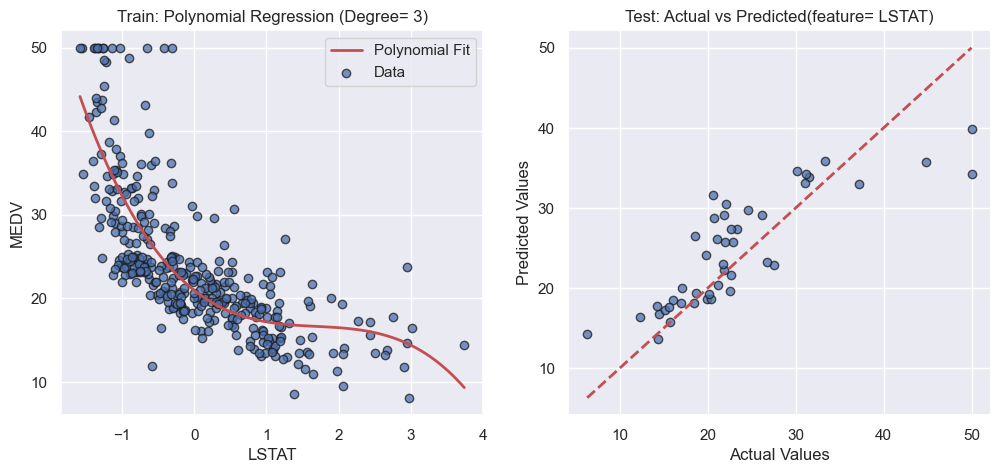

RMSE: 5.1368
R2 score: 0.6671


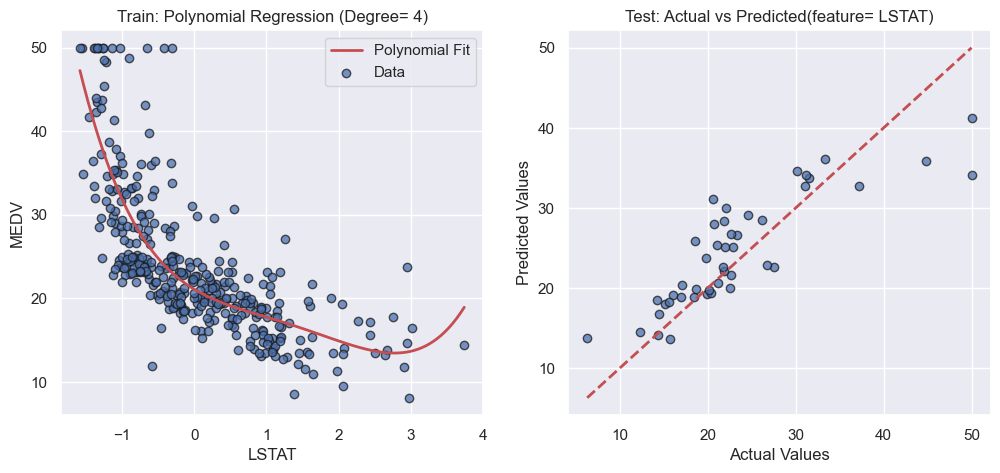

RMSE: 4.8822
R2 score: 0.6993


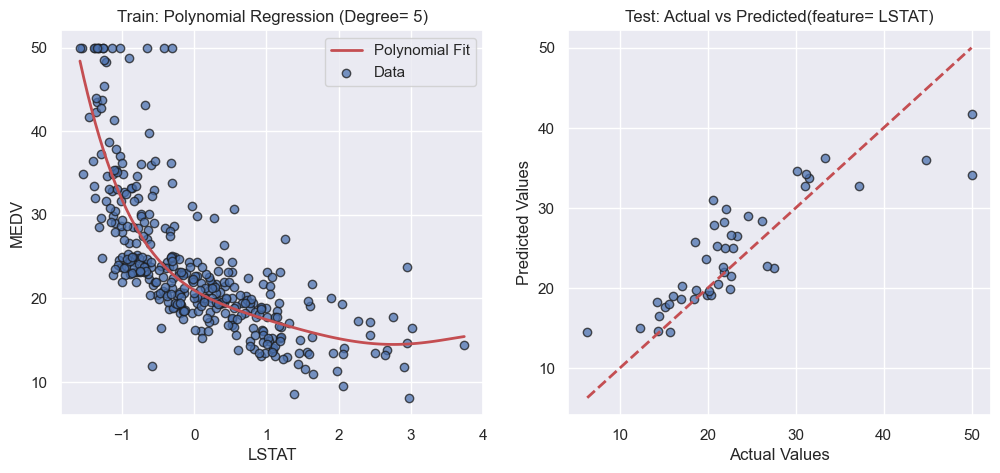

RMSE: 4.8372
R2 score: 0.7048


In [155]:
for i in range(1, 6, 1):    
    polynomial_regression = PolynomialRegressionGradientDescent()
    polynomial_regression.get_weights_and_bias(X_train["LSTAT"], y_train, degree=i)
    predictions = polynomial_regression.predict(X_test["LSTAT"])
    polynomial_regression.visualize_regression(X_train["LSTAT"], y_train, y_test, "LSTAT")
    print(f"RMSE: {polynomial_regression.get_root_mean_square_error(y_test):.4f}")
    print(f"R2 score: {polynomial_regression.get_r2_score(y_test):.4f}")

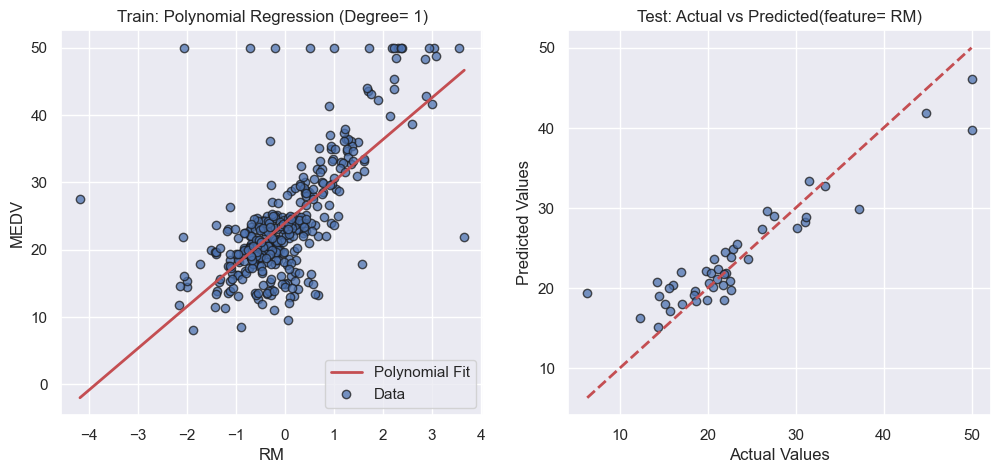

RMSE: 3.6740
R2 score: 0.8297


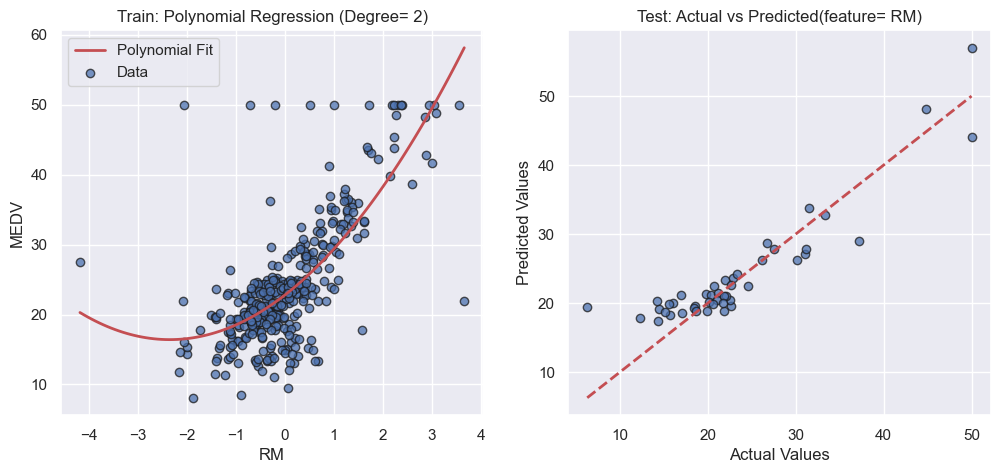

RMSE: 3.6547
R2 score: 0.8315


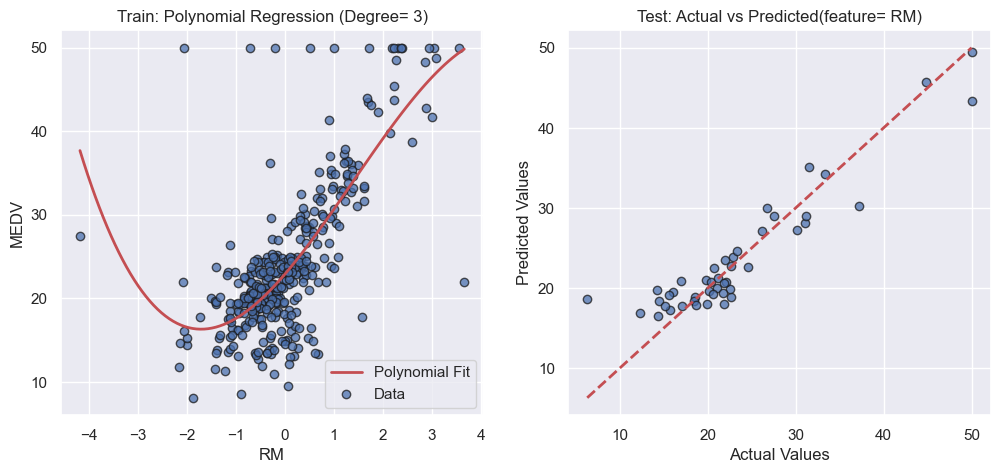

RMSE: 3.2714
R2 score: 0.8650


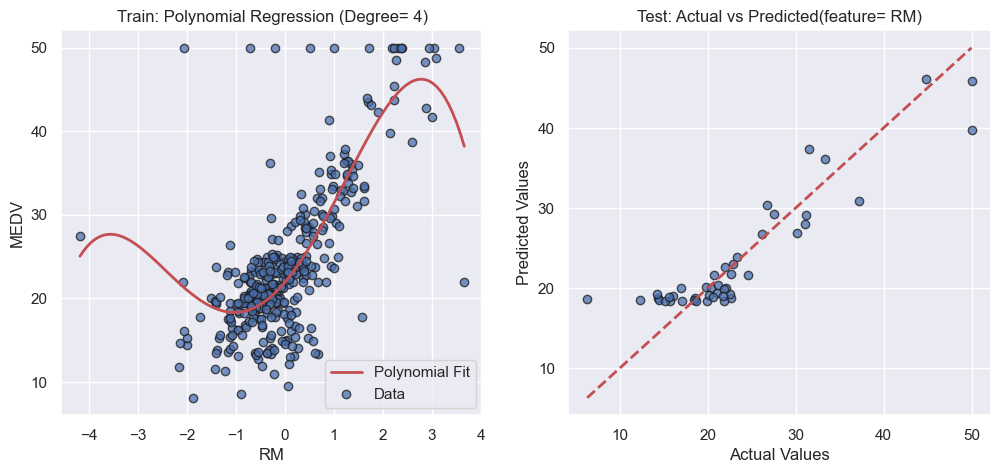

RMSE: 3.7084
R2 score: 0.8265


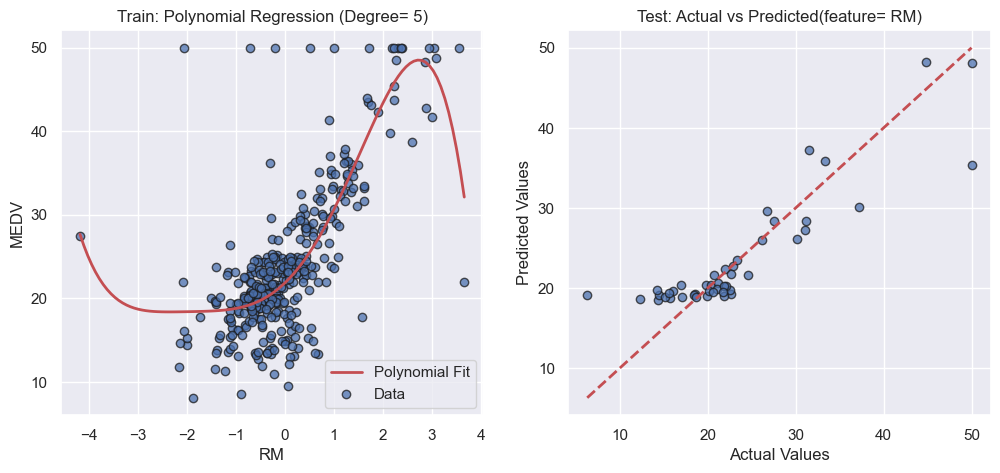

RMSE: 4.1107
R2 score: 0.7868


In [71]:
for i in range(1, 6, 1):    
    polynomial_regression = PolynomialRegressionGradientDescent()
    polynomial_regression.get_weights_and_bias(X_train["RM"], y_train, degree=i)
    predictions = polynomial_regression.predict(X_test["RM"])
    polynomial_regression.visualize_regression(X_train["RM"], y_train, y_test, "RM")
    print(f"RMSE: {polynomial_regression.get_root_mean_square_error(y_test):.4f}")
    print(f"R2 score: {polynomial_regression.get_r2_score(y_test):.4f}")

<a id='phase3'></a>

<h1 style = "color:red;font-size:30px" dir = "ltr"> <b>
    Phase III: Classification
</b> </h1>

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    21. What is the concept of pruning in decision trees? Mention the advantages and disadvantages of using this method.
</b> </h1>

**Pruning in Decision Trees**: 

Pruning is a technique used in decision tree algorithms to reduce the size and complexity of the tree. A decision tree can potentially grow very large and intricate, especially when dealing with a large dataset or a high number of features. This can lead to overfitting, where the tree becomes too specific to the training data and performs poorly on unseen data.

**how pruning works**:

- **Full Tree Growth**: The decision tree is first grown to its full depth, considering all possible splits at each node.
- **Identifying Candidates for Pruning**: The algorithm identifies sections of the tree that are unlikely to contribute significantly to the overall accuracy. These sections might be subtrees with low information gain or those that focus on irrelevant details in the training data.
- **Replacing Subtrees with Leaves**: The identified subtrees are replaced with leaves, essentially converting them into decision points that simply predict the most common class (for classification) or average value (for regression) at that node.

**Advantages of Pruning**:

- **Reduced Overfitting**: Pruning helps prevent the decision tree from becoming overly complex and memorizing specific details from the training data. This leads to a more generalizable model that performs better on unseen data.
- **Improved Interpretability**: Smaller trees are generally easier to understand and interpret. We can more easily trace the decision-making process and identify the key features influencing the predictions.
- **Faster Training and Prediction**: Pruning reduces the computational cost associated with training and using the decision tree model. Smaller trees require less processing power for both building and making predictions.

**Disadvantages of Pruning**:

- **Potential Loss of Accuracy**: Aggressive pruning can sometimes remove important parts of the tree, leading to a slight decrease in accuracy on the training data. However, the benefit of improved generalizability usually outweighs this minor loss.
- **Finding the Optimal Pruning Level**: Determining the ideal amount of pruning can be challenging. Pruning too much can lead to underfitting, where the model is too simplified and misses important patterns in the data. Striking the right balance between reducing complexity and maintaining accuracy is crucial.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    22. Under what circumstances can decision trees offer advantages over other models?
</b> </h1>

- **Interpretability**:

    - Decision trees are highly interpretable due to their clear structure. we can easily trace the decision-making process by following the branches from the root node to the leaf nodes. This makes it easier to understand how the model arrives at its predictions and identify the features that have the most significant impact.
    - This interpretability is particularly beneficial in situations where understanding the model's reasoning is crucial. For example, in medical diagnosis or loan approval systems, it's important to explain the factors influencing a decision.

- **Handling Various Data Types**:

    - Decision trees can handle both categorical and continuous data without extensive pre-processing. They can natively work with features in their original format, making them suitable for datasets with a mix of data types.

- **Robustness to Outliers**:

    - Decision trees are relatively insensitive to outliers in the data. The removal of a single data point is unlikely to significantly alter the entire tree structure. This can be advantageous when dealing with noisy or messy datasets.

- **Fast Training and Prediction**:

    - Decision trees can be trained and make predictions relatively quickly, especially for smaller datasets. This makes them efficient for tasks where real-time or near-real-time decision making is required.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    23. What is the inherent difference between KNN classification and other classification methods such as neural networks or Logistic regression? (Pay attention to how each classifier is trained).
</b> </h1>

The key difference between KNN classification and other methods like neural networks and logistic regression lies in their training approaches:

- **K-Nearest Neighbors (KNN)**:

    - **Training**: KNN doesn't require explicit training in the traditional sense. It memorizes the entire dataset. When presented with a new data point, it calculates the distances to all points in the training data and identifies the k closest neighbors (k is a user-defined parameter). The class label of the majority of these k neighbors becomes the predicted class for the new data point.
    - **Strengths**: Simple to understand and implement, works well with various data types, robust to irrelevant features.
    - **Weaknesses**: Computationally expensive for large datasets (needs to compare new data to all existing data points), sensitive to the choice of k, prone to the "curse of dimensionality" in high-dimensional spaces.

- **Neural Networks**:

    - **Training**: Neural networks learn through a process called backpropagation. They are composed of interconnected layers of artificial neurons. During training, the network iterates through the training data, adjusting the weights between neurons based on the difference between the predicted output and the actual target value. This iterative process minimizes the error and allows the network to learn complex relationships between features and the target variable.
    - **Strengths**: Can learn complex non-linear relationships, powerful for high-dimensional data, can handle various data types with appropriate preprocessing.
    - **Weaknesses**: Can be computationally expensive to train, prone to overfitting if not regularized properly, often considered a "black box" model due to their complex internal structure, require careful selection of hyperparameters (learning rate, network architecture).

- **Logistic Regression**:

    - **Training**: Logistic regression estimates the probability of a data point belonging to a specific class. During training, a cost function is minimized by adjusting the coefficients of a linear equation. This equation takes the features as input and outputs a probability between 0 and 1 representing the class membership.
    - **Strengths**: Interpretable model (coefficients can be linked to feature importance), efficient training for smaller datasets, good for binary classification problems.
    - **Weaknesses**: Assumes a linear relationship between features and the target variable (may not perform well for non-linear data), limited to binary classification problems by default (extensions exist for multi-class classification).

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    24. Research about the one nearest neighbor algorithm and mention its advantages and disadvantages.
</b> </h1>

**1-Nearest Neighbor (1-NN) Algorithm**:

The 1-Nearest Neighbor (1-NN) algorithm is a special case of the K-Nearest Neighbors (KNN) classification algorithm where only the single closest neighbor (k = 1) is considered for predicting the class label of a new data point.

- **Advantages**:

    - **Simplicity**: 1-NN is extremely easy to understand and implement. There are minimal parameters to tune, making it a user-friendly approach.
    - **No Training Phase**: Similar to KNN, 1-NN doesn't require a separate training phase. It simply stores the entire dataset and classifies new data points based on their nearest neighbor.
    - **Effective for Certain Data Distributions**: When the data is clearly separated into distinct classes with well-defined boundaries, 1-NN can be surprisingly effective at classifying new points.

- **Disadvantages**:

    - **Sensitive to Noise**: Outliers and noisy data points can significantly impact the classification results in 1-NN. A single noisy neighbor can completely skew the prediction.
    - **Curse of Dimensionality**: As the number of features (dimensions) in the data increases, the distance metric becomes less meaningful, making it difficult to identify a truly "closest" neighbor. This can lead to poor performance in high-dimensional datasets.
    - **Boundary Issues**: For data with overlapping classes or complex decision boundaries, 1-NN might struggle to accurately classify points near these boundaries. The single neighbor might belong to a different class, leading to misclassification.
    - **Computational Cost for Large Datasets**: Although it doesn't have a formal training phase, 1-NN still needs to compare the new data point to all points in the dataset to find the closest neighbor. This can be computationally expensive for very large datasets.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    25. Explore various distance measurement techniques employed in the K-Nearest Neighbors (KNN) algorithm and identify several of them.
</b> </h1>

K-Nearest Neighbors (KNN) relies on measuring distances between data points to identify the closest neighbors for a new data point. Here are some commonly used distance metrics in KNN:

1. **Euclidean Distance**:

    - This is the most common and intuitive distance metric. It calculates the straight-line distance between two points in n-dimensional space. It's suitable for continuous numerical data.
    - **Formula**: d(x, y) = sqrt(sum((x_i - y_i)^2 for i in range(n)))
    - x and y are data points with n features (dimensions)
    - i iterates through each dimension


2. **Manhattan Distance (Taxicab Geometry Distance)**:

    - This metric calculates the total distance traveled along the axes to get from one point to another, similar to navigating a city grid. It's less sensitive to outliers compared to Euclidean distance.
    - **Formula**: d(x, y) = sum(|x_i - y_i| for i in range(n))
|x_i - y_i| is the absolute difference between corresponding features

3. **Minkowski Distance**:

    This is a generalization of both Euclidean and Manhattan distances. It allows for tuning the importance of different feature dimensions by raising the absolute difference to a power p.
    - **Formula**: d(x, y) = ((sum((|x_i - y_i|^p) for i in range(n)))^(1/p))
    - p is the parameter controlling the importance of each dimension (p = 2 for Euclidean, p = 1 for Manhattan)

4. **Hamming Distance**:

    - This metric is primarily used for categorical data where features represent presence or absence (often binary). It counts the number of mismatches between corresponding features of two data points.
    - **Formula**: d(x, y) = sum(1 for i in range(n) if x_i != y_i)

**Choosing the Right Distance Metric**: The best distance metric for your KNN application depends on the characteristics of your data:

- **Data Type**: Use Euclidean or Minkowski distance for continuous numerical data, Hamming distance for binary categorical data, and Cosine similarity for text data.
- **Feature Scaling**: If features have different scales, consider using a metric like Minkowski distance (with p adjusted) or standardize your data before applying distance calculations.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    26. In this project phase, we categorize the target column, which represents the average price of occupied houses (MEDV), into three distinct categories. The top two deciles of prices are classified as luxury houses, the bottom two deciles as economic houses, and the remaining houses are labeled as ordinary houses. This categorization is saved as a new column in the dataset. First, we develop two models utilizing the scikit-learn library: a Decision Tree model and a K-Nearest Neighbors (KNN) model. Following the initial setup, we proceed to fine-tune the hyperparameters of these models to optimize their performance. Our optimization strategy is focused on minimizing the cost function while carefully avoiding overfitting. Through a process of trial and error, we identify and present one of the optimized models in our report.
</b> </h1>

**Train-Test Split**:

In [14]:
deciles = df_normalized['MEDV'].quantile([0.2, 0.8])
luxury_threshold = deciles[0.8]
economic_threshold = deciles[0.2]

def categorize_price(price):
    if price >= luxury_threshold:
        return 'Luxury'
    elif price <= economic_threshold:
        return 'Economic'
    else:
        return 'Ordinary'

df_standardized['Category'] = df_normalized['MEDV'].apply(categorize_price)

df_standardized


,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,TAX,PTRATIO,B,LSTAT,MEDV,Category
0,-0.567361,0.217241,-1.177523,-0.024767,0.347505,-0.012741,-0.035595,-0.538783,-1.341047,0.410452,-1.050777,24.0,Ordinary
1,-0.558942,-0.523527,-0.476449,-0.631681,0.116298,0.474875,0.379472,-0.896020,-0.203457,0.410452,-0.374312,21.6,Ordinary
2,-0.558950,-0.523527,-0.476449,-0.631681,1.263325,-0.158670,0.379472,-0.896020,-0.203457,0.351046,-1.205258,34.7,Luxury
3,-0.556912,-0.523527,-1.196670,-0.728436,0.982574,-0.703233,0.897702,-1.028330,0.206075,-0.466463,-1.382504,33.4,Luxury
4,-0.542200,-0.523527,-1.196670,-0.728436,1.206274,-0.404257,0.897702,-1.028330,0.206075,0.410452,-0.993863,36.2,Luxury
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,-0.544775,-0.523527,0.239354,0.283089,0.374529,0.126070,-0.798152,-0.690940,1.252658,0.338785,-0.288128,22.4,Ordinary
502,-0.551738,-0.523527,0.239354,0.283089,-0.335607,0.396572,-0.888586,-0.690940,1.252658,0.410452,-0.384069,20.6,Ordinary
503,-0.545525,-0.523527,0.239354,0.283089,0.949544,0.905543,-0.945373,-0.690940,1.252658,0.410452,-0.943453,23.9,Ordinary
504,-0.525939,-0.523527,0.239354,0.283089,0.676299,0.845036,-0.840601,-0.690940,1.252658,0.360095,-0.806859,22.0,Ordinary


In [15]:
X = df_standardized.drop(["MEDV", "Category"], axis=1)  
y = df_standardized["Category"]

# Split data into training and testing sets (80%/20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split test data into validating and testing sets (50%/50%)
X_validation, X_test, y_validation, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

**Decision Tree Model**:

1. **Initial Model**:

In [22]:
dt_model = DecisionTreeClassifier( max_depth= 8, min_samples_split= 4)

# Train 
dt_model.fit(X_train, y_train)

# Test
dt_predictions = dt_model.predict(X_test)

# Evaluate 
dt_accuracy = accuracy_score(y_test, dt_predictions)

print(f"Decision Tree Model Accuracy: {dt_accuracy:.4f}")

Decision Tree Model Accuracy: 0.8261


2. **Hyperparameter Tuning**:

    Decision trees have hyperparameters like max_depth (maximum tree depth) and min_samples_split (minimum samples required to split a node) that can influence performance. We can use techniques like GridSearchCV or RandomizedSearchCV from scikit-learn to explore different hyperparameter combinations and find the one that minimizes a cost function (e.g., classification error) on a validation set.

**K-Nearest Neighbors Model**:

1. **Initial Model**:

In [23]:
k = 3
knn_model = KNeighborsClassifier(n_neighbors=k)

# Train 
knn_model.fit(X_train, y_train)

# Test
knn_predictions = knn_model.predict(X_test)

# Evaluate
knn_accuracy = accuracy_score(y_test, knn_predictions)

print(f"KNN Model Accuracy (k={k}): {knn_accuracy:.4f}")


KNN Model Accuracy (k=3): 0.8261


2. **Hyperparameter Tuning**:

    KNN has a crucial hyperparameter n_neighbors (number of neighbors to consider). We can use techniques similar to Decision Tree to find the optimal n_neighbors value.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    27. For both of these models, obtain the optimal values ​​for the parameters with the help of the GridSearchCV function. Briefly explain how this function works. And compare the obtained results with the obtained results of the models whose meta-parameters were obtained by trial.
</b> </h1>

**GridSearchCV for Hyperparameter Tuning**: GridSearchCV is a function from scikit-learn that automates hyperparameter tuning for machine learning models. It works by:

1. **Defining a Parameter Grid**: You specify a dictionary where each key represents a hyperparameter and the value is a list of possible values to explore.
2. **Creating Model Instances**: GridSearchCV creates instances of your model with each combination of hyperparameter values from the grid.
3. **Cross-Validation**: It uses cross-validation (usually k-fold) to evaluate each model combination. In each fold, the model is trained on a portion of the data and evaluated on the remaining portion. This helps estimate the model's performance on unseen data and avoid overfitting.
4. **Scoring**: A scoring metric (e.g., accuracy, F1 score) is used to evaluate the performance of each model on the validation set.
5. **Finding the Best Model**: GridSearchCV identifies the model combination with the best score according to the chosen metric.

**Benefits of GridSearchCV**:

- **Systematic Approach**: It removes the guesswork from hyperparameter tuning by exploring a defined set of parameter combinations.
- **Efficiency**: It automates the process, saving time compared to manual trial and error.
- **Reduced Overfitting**: By evaluating models on unseen data through cross-validation, it helps prevent overfitting to the training data.

**Decision Tree Optimization**:

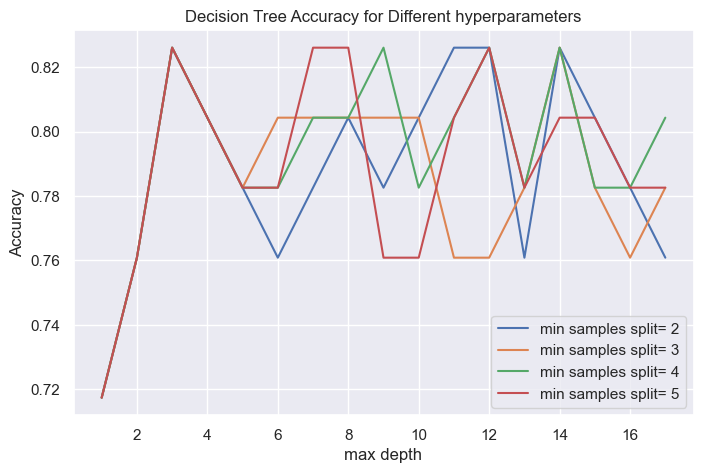

In [25]:
sns.set_theme()
min_samples_split_list = range(2,6)
max_depth_list = range(1,18)

scores = {'min_samples_split': [], 'max_depth': [], 'accuracy': []}
scores_df = pd.DataFrame(scores)

for i, min_samples_split in enumerate(min_samples_split_list):
    for j, max_depth in enumerate(max_depth_list):
        dt_model = DecisionTreeClassifier( max_depth= max_depth, min_samples_split= min_samples_split)
        dt_model.fit(X_train, y_train)
        
        accuracy = dt_model.score(X_test, y_test)
        new_row = {'min_samples_split': min_samples_split, 'max_depth': max_depth, 'accuracy': accuracy}
        scores_df.loc[i*len(max_depth_list) + j] = new_row

plt.figure(figsize=(8, 5))
for min_samples_split in min_samples_split_list:
    sub_scores_df = scores_df[scores_df['min_samples_split'] == min_samples_split]
    plt.plot(sub_scores_df['max_depth'], sub_scores_df['accuracy'], label=f'min samples split= {min_samples_split}')
 
plt.title('Decision Tree Accuracy for Different hyperparameters')
plt.xlabel('max depth')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [130]:
param_grid = {
    'max_depth': [2, 3, 4, 6, 7, 8],
    'min_samples_split': [2, 4, 5, 8, 10]
}

grid_search = GridSearchCV(dt_model, param_grid, scoring='accuracy', cv=5)

grid_search.fit(X_train, y_train)

best_dt_model = grid_search.best_estimator_
best_dt_params = grid_search.best_params_

dt_predictions = best_dt_model.predict(X_validation)
dt_accuracy = accuracy_score(y_validation, dt_predictions)

print(f"Optimized Decision Tree Model Accuracy: {dt_accuracy:.4f}")
print("Best Parameters:", best_dt_params)

Optimized Decision Tree Model Accuracy: 0.8667
Best Parameters: {'max_depth': 8, 'min_samples_split': 4}


**KNN Optimization**:

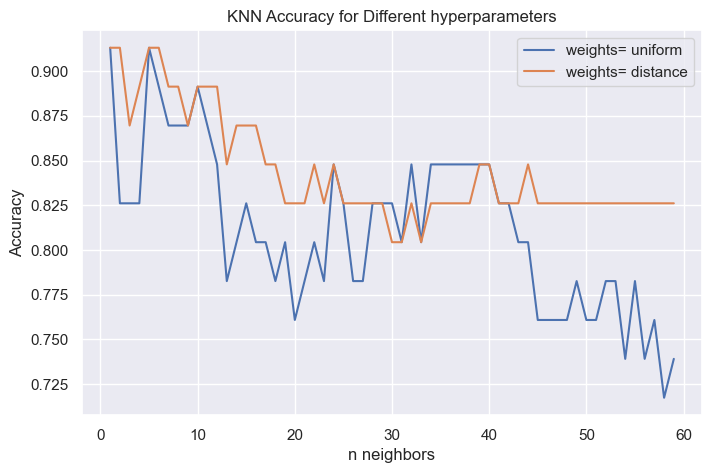

In [41]:
n_neighbors_list = range(1,60)
weights_list= ['uniform', 'distance']

scores = {'n_neighbors': [], 'weights': [], 'accuracy': []}
scores_df = pd.DataFrame(scores)

for i, n_neighbors in enumerate(n_neighbors_list):
    for j, weights in enumerate(weights_list):
        knn_model = KNeighborsClassifier(n_neighbors=n_neighbors, weights= weights)
        knn_model.fit(X_train, y_train)
        
        accuracy = knn_model.score(X_test, y_test)
        new_row = {'n_neighbors': n_neighbors, 'weights': weights, 'accuracy': accuracy}
        scores_df.loc[i*len(weights_list) + j] = new_row

plt.figure(figsize=(8, 5))
for weights in weights_list:
    sub_scores_df = scores_df[scores_df['weights'] == weights]
    plt.plot(sub_scores_df['n_neighbors'], sub_scores_df['accuracy'], label=f'weights= {weights}')

sns.set_theme() 
plt.title('KNN Accuracy for Different hyperparameters')
plt.xlabel('n neighbors')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [106]:
param_grid = {
    'n_neighbors': range(1,20),
    "weights": ['uniform', 'distance']
}

grid_search = GridSearchCV(knn_model, param_grid, scoring='accuracy', cv=5)

grid_search.fit(X_train, y_train)

best_knn_model = grid_search.best_estimator_
best_knn_params = grid_search.best_params_

knn_predictions = best_knn_model.predict(X_validation)
knn_accuracy = accuracy_score(y_validation, knn_predictions)

print(f"Optimized KNN Model Accuracy: {knn_accuracy:.4f}")
print("Best Parameters:", best_knn_params)

Optimized KNN Model Accuracy: 0.8889
Best Parameters: {'n_neighbors': 3, 'weights': 'distance'}


Comparison with Trial:

While trial can work for simple models and small datasets, GridSearchCV offers several advantages:

- **Systematic Exploration**: It ensures you explore a wider range of parameter combinations, potentially leading to a better solution.
- **Reproducibility**: The results are documented and can be easily reproduced by others.
- **Efficiency**: It automates the process, saving time and effort compared to manual testing.

The accuracy obtained from the optimized models using GridSearchCV might be higher or lower than those obtained by trial. It depends on the specific dataset, model, and chosen hyperparameter grid. However, GridSearchCV provides a more systematic and reliable approach to finding the best hyperparameter configuration.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    28. Construct your final decision tree diagram. Utilize the tree_plot function for this purpose..
</b> </h1>

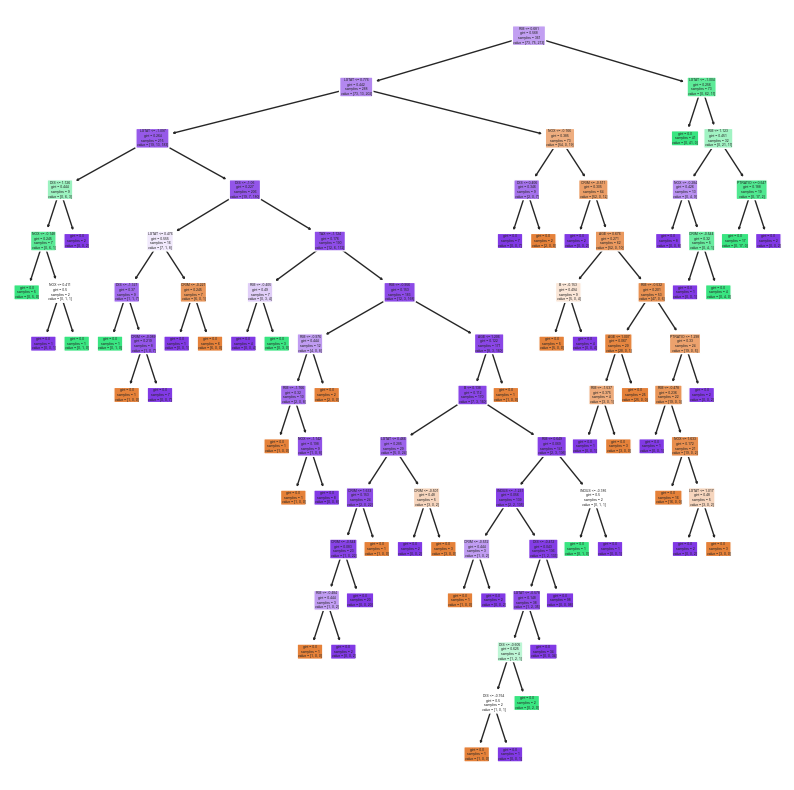

In [29]:
plt.figure(figsize=(10, 10))
plot_tree(best_dt_model, feature_names=X.columns, rounded=True, filled=True)
plt.show()

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    29. Have your models experienced underfitting or overfitting? Generally, when does this phenomenon occur? Explain each one.
</b> </h1>

- **Underfitting**:

    - **Definition**: Underfitting occurs when a machine learning model is too simple and fails to capture the underlying patterns in the training data. This results in poor performance on both the training and testing sets.
    - **Signs**: Low accuracy or error rate on both training and testing data. The model might not learn complex relationships between features and the target variable.
    - **Causes**: Using a model with low capacity (e.g., shallow decision tree), insufficient training data, or irrelevant features in the training data.

- **Overfitting**:

    - **Definition**: Overfitting occurs when a machine learning model memorizes the training data too well, including noise and irrelevant details. This leads to good performance on the training data but poor performance on unseen data (generalization).
    - **Signs**: High accuracy on the training data but significantly lower accuracy on the testing data. The model performs well on training examples but fails to adapt to new data.
    - **Causes**: Using a model with high capacity (e.g., very deep decision tree) for a limited dataset, or training for too long.

- **GridSearchCV and Mitigating Overfitting**:

    GridSearchCV helps prevent overfitting by using cross-validation. It evaluates models on unseen data within each fold, penalizing models that simply memorize the training data. By selecting the model with the best performance on the validation sets, GridSearchCV promotes models that generalize well to unseen data and reduces the risk of overfitting.

**Decision Tree**:

Based on the table, it's likely that my models are suffering from overfitting. because:

- **High Training Accuracy**: The training accuracy (0.961219) is significantly higher than the test accuracy (0.847826). This suggests that the model performs very well on the data it was trained on, potentially memorizing specific patterns in the training set.

- **Large Gap Between Training and Test Accuracy**: The substantial difference between training and test accuracy indicates that the model might not be generalizing well to unseen data. It's likely overfitting to the training data and failing to capture the underlying relationships between features and house price categories.

In [30]:
def get_confusion_matrix(true_labels, predicted_labels, labels):
    label_index = {label:i for i, label in enumerate(labels)}
    cm = np.zeros((len(labels), len(labels)), dtype=int)
    
    for true_label, predicted_label in zip(true_labels, predicted_labels):
        cm[label_index[true_label], label_index[predicted_label]] += 1

    return cm

def plot_heatmap(confusion_matrix_train, confusion_matrix_test, labels):
    plt.figure(figsize=(10, 5))
    sns.set_theme() 
    plt.subplot(1,2,1)
    sns.heatmap(confusion_matrix_train, annot=True, fmt="d", cmap="YlGnBu", cbar=False, xticklabels=labels, yticklabels=labels)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix for train data")

    plt.subplot(1,2,2)
    sns.heatmap(confusion_matrix_test, annot=True, fmt="d", cmap="YlGnBu", cbar=False, xticklabels=labels, yticklabels=labels)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix for test data")
    plt.show()

def make_df_for_scores(y_train, y_pred_train, y_test, y_pred_test):
    accuracy_train = accuracy_score(y_train, y_pred_train)
    precision_train = precision_score(y_train, y_pred_train, average='weighted')
    recall_train = recall_score(y_train, y_pred_train, average='weighted')
    f1_score_train = f1_score(y_train, y_pred_train, average='weighted')

    accuracy_test = accuracy_score(y_test, y_pred_test)
    precision_test = precision_score(y_test, y_pred_test, average='weighted')
    recall_test = recall_score(y_test, y_pred_test, average='weighted')
    f1_score_test = f1_score(y_test, y_pred_test, average='weighted')

    values = [[accuracy_train, precision_train, recall_train, f1_score_train],[accuracy_test, precision_test, recall_test, f1_score_test]]
    accuracy_df = pd.DataFrame(values, index=['Train', 'Test'], columns=['accuracy score', "precision score", "recall score", "f1 score"])
    return accuracy_df

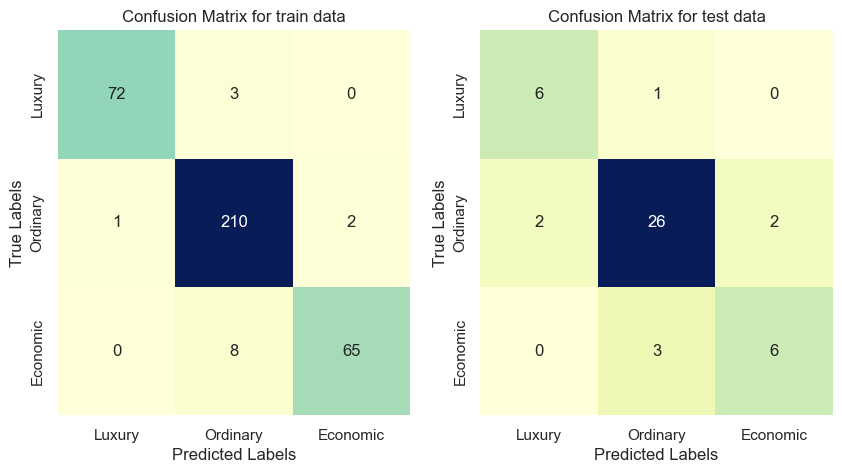

,accuracy score,precision score,recall score,f1 score
Train,0.961219,0.961750,0.961219,0.960908
Test,0.826087,0.826087,0.826087,0.825064


In [137]:
labels = ["Luxury", "Ordinary" ,"Economic"]
dt_model = DecisionTreeClassifier(**best_dt_params)
dt_model.fit(X_train, y_train)

y_pred_train = dt_model.predict(X_train)
cm_train = get_confusion_matrix(y_train, y_pred_train, labels)

y_pred_test = dt_model.predict(X_test)
cm_test = get_confusion_matrix(y_test, y_pred_test, labels)

plot_heatmap(cm_train, cm_test, labels)
accuracy_df = make_df_for_scores(y_train, y_pred_train, y_test, y_pred_test)
accuracy_df

**K-Nearest Neighbors**:


Based on the provided, it's likely that my models are suffering from overfitting. because:

- **Training vs Test Score**: The training accuracy (1) is significantly higher than the test accuracy (0.913043). This indicates that the models perform well on the data they were trained on but generalize poorly to unseen data on the test set.

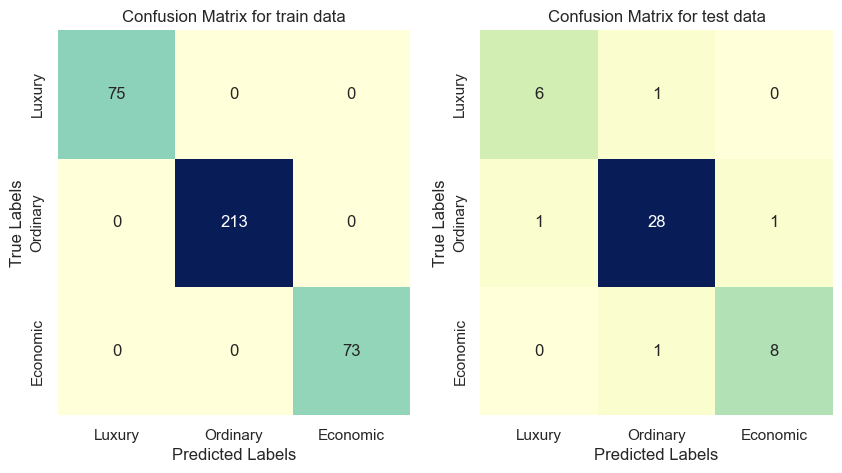

,accuracy score,precision score,recall score,f1 score
Train,1.000000,1.000000,1.000000,1.000000
Test,0.913043,0.913043,0.913043,0.913043


In [109]:
labels = ["Luxury", "Ordinary" ,"Economic"]
knn_model = KNeighborsClassifier(n_neighbors=2, weights= "distance")
knn_model.fit(X_train, y_train)

y_pred_train = knn_model.predict(X_train)
cm_train = get_confusion_matrix(y_train, y_pred_train, labels)

y_pred_test = knn_model.predict(X_test)
cm_test = get_confusion_matrix(y_test, y_pred_test, labels)

plot_heatmap(cm_train, cm_test, labels)
accuracy_df = make_df_for_scores(y_train, y_pred_train, y_test, y_pred_test)
accuracy_df

<a id='phase4'></a>

<h1 style = "color:red;font-size:30px" dir = "ltr"> <b>
    Phase IV: The methods of Ensemble
</b> </h1>

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    30. Explain why ensemble methods are used and why these methods are important today.
</b> </h1>

Ensemble methods are a powerful technique in machine learning that leverage the combined strengths of multiple models to deliver better results than any single model could on its own. So why they're important:

- **Improved Accuracy and Generalizability**: By combining diverse models, ensemble methods reduce the variance of predictions, leading to more accurate and robust results. This is because individual models might have their own biases or weaknesses, but averaging or combining predictions helps to overcome these limitations.

- **Reduced Overfitting**:  Ensemble methods can help mitigate overfitting, a common problem where a model performs well on the training data but poorly on unseen data. By introducing diversity in the models used, ensemble methods make the overall model less prone to memorizing the specifics of the training data.

- **Leveraging Different Learning Algorithms**: Ensembles can incorporate the strengths of various learning algorithms. This is particularly useful when the data itself is complex or doesn't perfectly suit any single algorithm. By combining different approaches, ensembles can capture a broader range of patterns in the data.

**Importance Today**: 

In today's world, where data is ever-growing and complex, ensemble methods are crucial for building high-performance machine learning models. They are widely used in various fields, including:

- **Computer Vision**: Ensemble methods like Random Forests are used for tasks like image recognition and object detection.

- **Natural Language Processing**: Ensembles can improve the accuracy of sentiment analysis, machine translation, and text summarization.

- **Finance**: They are used for fraud detection, stock price prediction, and credit risk assessment.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    31. Describe the general mechanism of Boosting and Bagging methods for classification and explain their differences.
</b> </h1>

Both Boosting and Bagging are ensemble methods used for classification, but they achieve their goals in fundamentally different ways:

- **Bagging**:

    - **Mechanism**:

        - Creates multiple copies (often called "bags") of the training data by sampling with replacement. This means some data points may appear multiple times in a bag, while others might be left out entirely.
        - Trains a separate classifier model on each bag of data. These can be decision trees, support vector machines, or any other model type.
        - Makes final predictions by averaging the predictions from all the individual models (majority vote for categorical classification).

    - **Goal**: 
    
        - Reduce variance. By training on different subsets of data, each model captures slightly different aspects of the data. Averaging their predictions reduces the sensitivity to any specific quirks in the training data, leading to a more stable and generalizable model.

- **Boosting**:

    - **Mechanism**:

        - Trains models sequentially. Each new model focuses on the "weaknesses" of the previous model.
        - Starts by training a model on the original data. Then, it analyzes the errors made by this first model.
        - Creates a new training set where data points misclassified by the previous model are given higher weight. This forces the next model to pay closer attention to these difficult examples.
        - Trains a new model on this adjusted data. This model will tend to be better at classifying the previously tricky instances.
        - Repeats the process of analyzing errors, adjusting weights, and training new models until a stopping criteria is met (e.g., a certain level of accuracy is achieved).
        - Combines the predictions from all the models using a weighted voting scheme, with higher weights given to models with better performance.

    - **Goal**: 
        - Reduce bias. By focusing on the errors of previous models, boosting sequentially improves the overall accuracy and reduces the bias of the final ensemble model.

**Key Differences**:

- **Model Training**: Bagging trains models in parallel on independent data subsets, while Boosting trains them sequentially, with each model informed by the previous one.

- **Focus**: Bagging aims to reduce variance, leading to a more stable model. Boosting aims to reduce bias, leading to a more accurate model.

- F**inal Prediction**: Bagging uses simple averaging or majority vote. Boosting uses weighted voting based on model performance.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    32. Briefly explain how the random forest method works.
</b> </h1>

The Random Forest method is a powerful machine learning algorithm that operates by constructing a multitude of decision trees during the training phase. It's designed to overcome the overfitting problem common in decision trees by averaging the predictions of multiple trees, each trained on a different subset of the data. This ensemble learning technique enhances the model's performance by reducing variance and improving stability. Random Forest is versatile, capable of handling both classification and regression tasks, and is particularly effective in dealing with complex datasets. It achieves this through a process that involves creating bootstrap samples of the dataset, building decision trees on these samples, and then aggregating the predictions from all trees to produce the final output. This method not only improves the model's accuracy but also provides insights into feature importance, making it a preferred choice for various predictive modeling tasks across different industries.

It builds upon the concept of Bagging (Bootstrap Aggregating) but injects some randomness to further improve performance. Here's the gist:

- **Forest Building**: It creates multiple decision trees, similar to Bagging.

- **Data Subsets**: Like Bagging, it uses random samples with replacement from the training data to train each tree.

- **Random Features**: At each split point in a tree, instead of considering all features, it randomly selects a subset of features to choose the best split from. This injects randomness and reduces correlation between trees.

- **Prediction Power**: For classification, the final prediction is the most voted class among all the trees. For regression, it averages the predictions from all the trees.

By combining these elements, random forest addresses some limitations of single decision trees and Bagging itself, leading to a robust and accurate ensemble model.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    33. What is the concept of bootstrapping in random forests? How does it work and how does it affect the results of the model?
</b> </h1>

Bootstrapping is a crucial concept underlying Random Forests and a key factor in their effectiveness:

- **Concept**:

    - Bootstrapping is a statistical technique that involves creating new datasets (called bootstrap samples) by randomly sampling with replacement from the original data. This means a data point can be chosen multiple times in a single bootstrap sample, and some points might be left out altogether.

- **How it Works in Random Forests**:

    1. **Bootstrap Sampling**: For each tree in the forest, a bootstrap sample is created by randomly selecting observations from the original dataset with replacement. This means that some observations may appear more than once in the bootstrap sample, while others may not appear at all.
    2. **Building Decision Trees**: A decision tree is constructed for each bootstrap sample. Unlike traditional decision trees, which might overfit the data, the randomness introduced by bootstrapping helps to reduce overfitting by creating a variety of trees that capture different aspects of the data.
    3. **Aggregating Predictions**: The final prediction for a new observation is made by aggregating the predictions of all the decision trees in the forest. For classification problems, this typically involves taking a majority vote among the trees' predictions. For regression problems, the mean prediction of the trees is used.

- **Impact on Results**:

    - **high variance**: Bootstrapping in Random Forests addresses a major weakness of decision trees: high variance. A single decision tree can be very sensitive to small changes in the training data, leading to significant swings in its predictions.

    - **reduces the risk of overfitting**: The effect of bootstrapping on the results of the random forest model is significant. By creating a diverse set of decision trees, bootstrapping helps to improve the model's generalization ability. It reduces the risk of overfitting by ensuring that the model is not overly reliant on any single observation or feature. 

    - **accuracy**: Additionally, the ensemble nature of the random forest, combined with bootstrapping, leads to a model that is more robust and accurate than any single decision tree could be on its own.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    34. Does the number of decision trees in the random forest affect the efficiency of the model? What is the best value empirically?
</b> </h1>

Yes, the number of decision trees in a Random Forest definitely affects the model's efficiency and performance:

- **Impact on Efficiency**:

    - **More Trees, Slower Training**: As you increase the number of trees, the training time for the Random Forest grows. Each additional tree adds complexity to the model and requires more computational resources to train.

    - **Prediction Efficiency**: However, the prediction time typically remains relatively constant regardless of the number of trees. Once the forest is trained, predicting new data points involves querying each tree and averaging/voting the results, which is a relatively quick process.

- **Impact on Performance**:

    - **Bias-Variance Trade-off**: There's a trade-off between bias and variance when it comes to the number of trees.

        - **Bias**: With a small number of trees, the model might underfit the data, leading to high bias (inability to capture the underlying patterns).
        - **Variance**: With a very large number of trees, the model can become overly complex and start to memorize the specifics of the training data, leading to high variance (poor performance on unseen data).

    - **Sweet Spot**: There exists a range of "good" values for the number of trees where the model achieves a good balance between bias and variance, resulting in optimal performance.

There's no single best number of trees for all Random Forests. It depends on factors like:

- **Dataset Size**: Typically, larger datasets can benefit from more trees.

- **Dataset Complexity**: More complex datasets might require more trees to capture the underlying relationships.

- **Computational Resources**: Training with a very large number of trees can be computationally expensive.

In practice, studies suggest that a good starting point for the number of trees in a Random Forest can be in the range of 100 to 1000. However, it's always best to experiment with our specific dataset and problem to find the optimal value.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    35. When is it not appropriate to use random forest? When is this method recommended?
</b> </h1>

**Not Ideal For**:

- **Small Datasets**: With small datasets, the benefits of averaging multiple trees might be minimal, and Random Forests can be computationally expensive to train compared to simpler models.

- **High-Dimensional Data (Many Features)**: Random Forests can struggle with very high-dimensional data, especially when many features are irrelevant or redundant. Feature selection techniques can help mitigate this issue.

- **Interpretability**: While Random Forests provide some feature importance scores, understanding the exact reasoning behind a prediction can be challenging compared to simpler models like decision trees or logistic regression. This can be a drawback in scenarios where interpretability is crucial.

- **Data with Complex Relationships**: If the data has strong non-linear relationships or interactions between features, Random Forests might not capture them as effectively as some other models like Support Vector Machines or Neural Networks.

- **Feature Importance Misinterpretation**: While Random Forests can identify features that contribute significantly to the model's predictions, interpreting the relative importance of features, especially those that are highly correlated, can be misleading. This is because the algorithm does not inherently account for the interaction effects between features.

- **Extrapolation Limitations**: Random Forests are not designed to make predictions outside the range of the training data. If your goal involves extrapolating beyond the observed data, other models might be more suitable.

Recommended For:

- **Large Datasets**: Random Forests excel with large datasets where they can leverage the power of averaging multiple trees to achieve high accuracy and stability.

- **Mixed Data Types**: They can handle datasets containing a mix of numerical and categorical features without extensive preprocessing.

- **Missing Values**: Random Forests are robust to missing values in the data, as they can implicitly handle them during the tree-building process.

- **Overfitting Prevention**: The inherent randomness introduced by bootstrapping and random feature selection helps reduce overfitting, making them well-suited for problems prone to this issue.

- **General-purpose Classification and Regression**: Due to their flexibility and strong performance, Random Forests are often a good starting point for various classification and regression tasks, especially when the data characteristics are not entirely known beforehand.

- **Outlier Resistance**: Compared to other algorithms, Random Forests are less susceptible to the influence of outliers. This makes them a good choice for datasets with noisy or skewed data distributions.

- **Ease of Use and Interpretability**: Random Forests require minimal data preprocessing and offer straightforward training procedures. Their ensemble nature provides a balance between accuracy and interpretability, making them a popular choice for both beginners and experts

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    36. How does the application of the Random Forest method influence the variance of predictions?
</b> </h1>

Random Forests have a significant positive effect on reducing variance in machine learning models. Here's how:

- **Bootstrapping**: By training on multiple datasets created via bootstrapping (sampling with replacement), Random Forests introduce diversity into the learning process. Each tree learns from a slightly different subset of the data, capturing various aspects of the data and reducing reliance on any specific data points.

- **Random Feature Selection**: At each split point in a tree, considering only a random subset of features injects further randomness. This prevents any single feature from dominating the decision-making process and reduces correlation between trees.

- **Averaging/Voting**: The final prediction is made by averaging the predictions from all the trees (regression) or taking the majority vote (classification). This process essentially averages out the errors and biases of individual trees, leading to a more stable and consistent model with lower variance.

**Impact**:

- **Reduced Sensitivity**: A single decision tree can be very sensitive to small changes in the training data, leading to significant swings in its predictions (high variance). Random Forests mitigate this by creating an ensemble that leverages the strengths of diverse trees, reducing the model's sensitivity to data variations.

- **Generalizability**: Lower variance translates to a more generalizable model. The model performs well not only on the training data but also tends to generalize better to unseen data because it's less prone to memorizing the specifics of the training set

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    37. In this segment, we'll delve into the specifics of each hyperparameter within the random forest model. Following this exploration, we'll proceed to retrain the model using the GridSearchCV function. The objective is to identify and report the optimal hyperparameters that yield the best performance.
</b> </h1>

**Hyperparameters**:

- **n_estimators (int)**: This parameter specifies the number of decision trees to be included in the Random Forest. More trees generally lead to lower variance but can also increase training time and complexity.

- **max_depth (int)**: This parameter controls the maximum depth of each individual decision tree. Deeper trees can capture more complex relationships but can also lead to overfitting.

- **min_samples_split (int)**: This parameter defines the minimum number of samples required to split a node in the decision tree. Higher values can prevent overfitting by avoiding splitting nodes with very few samples.

- **min_samples_leaf (int)**: This parameter specifies the minimum number of samples required at each leaf node. Higher values can also help reduce overfitting.

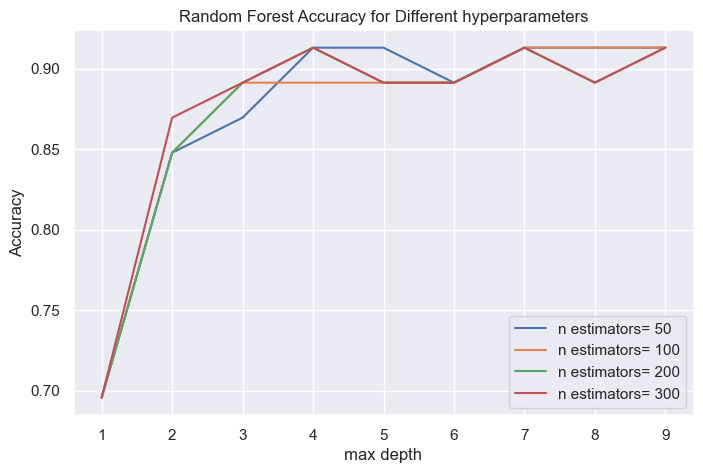

In [46]:
n_estimators_list = [50 ,100, 200, 300]
max_depth_list = range(1,10)

scores = {'n_estimators': [], 'max_depth': [], 'accuracy': []}
scores_df = pd.DataFrame(scores)

for i, n_estimators in enumerate(n_estimators_list):
    for j, max_depth in enumerate(max_depth_list):
        rf_model = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, random_state=42)
        rf_model.fit(X_train, y_train)
        
        accuracy = rf_model.score(X_test, y_test)
        new_row = {'n_estimators': n_estimators, 'max_depth': max_depth, 'accuracy': accuracy}
        scores_df.loc[i*len(max_depth_list) + j] = new_row

plt.figure(figsize=(8, 5))
for n_estimators in n_estimators_list:
    sub_scores_df = scores_df[scores_df['n_estimators'] == n_estimators]
    plt.plot(sub_scores_df['max_depth'], sub_scores_df['accuracy'], label=f'n estimators= {n_estimators}')

sns.set_theme() 
plt.title('Random Forest Accuracy for Different hyperparameters')
plt.xlabel('max depth')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [47]:
param_grid = {
    'n_estimators': [50 ,100, 200, 300],
    'max_depth': range(4,10),
}

rf_model = RandomForestClassifier()
grid_search = GridSearchCV(rf_model, param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train, y_train)

best_rf_model = grid_search.best_estimator_
best_rf_params = grid_search.best_params_

rf_predictions = best_rf_model.predict(X_validation)
rf_accuracy = accuracy_score(y_validation, rf_predictions)

print(f"Optimized Random Forest Model Accuracy: {rf_accuracy:.4f}")
print("Best Parameters:", best_rf_params)

Optimized Random Forest Model Accuracy: 0.8667
Best Parameters: {'max_depth': 4, 'n_estimators': 50}


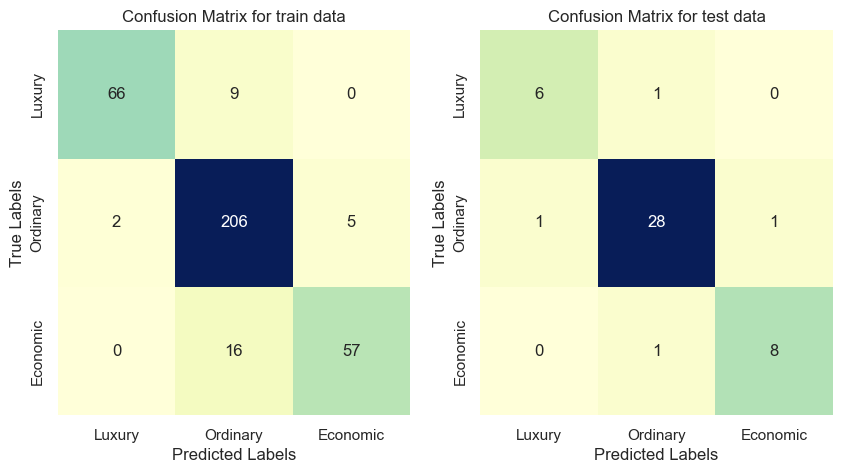

,accuracy score,precision score,recall score,f1 score
Train,0.911357,0.913726,0.911357,0.910038
Test,0.913043,0.913043,0.913043,0.913043


In [51]:
labels = ["Luxury", "Ordinary" ,"Economic"]
rf_model = RandomForestClassifier(**best_rf_params)
rf_model.fit(X_train, y_train)

y_pred_train = rf_model.predict(X_train)
cm_train = get_confusion_matrix(y_train, y_pred_train, labels)

y_pred_test = rf_model.predict(X_test)
cm_test = get_confusion_matrix(y_test, y_pred_test, labels)

plot_heatmap(cm_train, cm_test, labels)
accuracy_df = make_df_for_scores(y_train, y_pred_train, y_test, y_pred_test)
accuracy_df

<a id='xgboost'></a>

<h1 style = "color:red;font-size:30px" dir = "ltr"> <b>
    Scored Exercise: XGBoost
</b> </h1>

![XGBoost](https://www.researchgate.net/profile/Li-Mingtao-2/publication/335483097/figure/fig3/AS:934217085100032@1599746118459/A-general-architecture-of-XGBoost.ppm)

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    38. Briefly explain how XGboost works?
</b> </h1>

XGBoost, short for Extreme Gradient Boosting, is a machine learning technique for tasks like regression and classification. It works by combining multiple models, often decision trees, in a step-by-step way.

1. **Start simple**: Make a basic prediction on our data.

2. **Find the errors**: See how much our prediction differed from the actual values.

3. **Correct the errors**: Build a new decision tree to focus on correcting those mistakes.

4. **Repeat**: Combine the new tree with the previous ones, and repeat steps 2 and 3.

XGBoost excels at this because it uses a technique called gradient boosting. This means it pays more attention to the data points where the previous models struggled. By continually refining the model in this way, XGBoost becomes adept at handling complex patterns in data.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    39. First explain the concept of Gradient Boosting and then explain the difference between Tree Boosting and Decision Tree.
</b> </h1>

**Gradient Boosting**:

- **Base Learner**: Gradient Boosting builds an ensemble of weak learners, usually decision trees, sequentially. Each new tree is trained to correct the errors made by the previous ones.

- **Loss Function**: It uses a loss function that measures the difference between the actual target values and the predictions made by the model. Common loss functions include mean squared error for regression problems and cross-entropy loss for classification problems.

- **Gradient Descent**: Gradient Boosting minimizes the loss function by iteratively fitting new trees to the negative gradient of the loss function. This means that each new tree is trained to predict the residuals or errors of the previous ensemble.

- **Regularization**: To prevent overfitting, Gradient Boosting usually employs regularization techniques such as tree pruning and shrinkage (also known as learning rate). These techniques help in controlling the complexity of the model and improving generalization.

- **Ensemble Learning**: Finally, the predictions from all the trees are combined to make the final prediction. Typically, this is done by averaging the predictions for regression or by using a voting mechanism for classification.

**Tree Boosting vs. Decision Tree**:

- **Tree Boosting**: This is a technique that uses multiple decision trees built sequentially using gradient boosting. Each tree learns from the errors of the previous tree, improving the overall accuracy. Gradient boosting can be applied to other weak learners as well, but XGBoost (eXtreme Gradient Boosting) is popular for using decision trees.

- **Decision Tree**: This is a single machine learning model that uses a tree-like structure to make predictions. It splits the data based on features at each node, reaching a leaf node with a final prediction. Tree boosting uses multiple decision trees, not just one.

In simpler terms, Tree Boosting is the strategy of using multiple decision trees together, while a Decision Tree is the individual building block used in Tree Boosting.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    39. In this segment, we'll delve into the specifics of each hyperparameter within the XGboost model. Following this exploration, we'll proceed to retrain the model using the GridSearchCV function. The objective is to identify and report the optimal hyperparameters that yield the best performance.
</b> </h1>

Hyperparameters:

- **learning_rate**: This controls the step size when updating the model weights. Lower values lead to slower learning but can prevent overfitting.

- **n_estimators**: This determines the number of decision trees used in the ensemble. Higher values can improve accuracy but also increase training time and risk overfitting.

- **max_depth**: This specifies the maximum depth of each decision tree. Deeper trees can capture complex patterns but are more prone to overfitting.

In [54]:
def categorize_price(category):
    if category == 'Luxury':
        return 0
    elif category == 'Economic':
        return 2
    elif category == 'Ordinary':
        return 1

df_standardized_copy = df_standardized.copy(deep=True)
df_standardized_copy['Category_Numerical'] = df_standardized_copy['Category'].apply(categorize_price)

df_standardized_copy

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,TAX,PTRATIO,B,LSTAT,MEDV,Category,Category_Numerical
0,-0.567361,0.217241,-1.177523,-0.024767,0.347505,-0.012741,-0.035595,-0.538783,-1.341047,0.410452,-1.050777,24.0,Ordinary,1
1,-0.558942,-0.523527,-0.476449,-0.631681,0.116298,0.474875,0.379472,-0.896020,-0.203457,0.410452,-0.374312,21.6,Ordinary,1
2,-0.558950,-0.523527,-0.476449,-0.631681,1.263325,-0.158670,0.379472,-0.896020,-0.203457,0.351046,-1.205258,34.7,Luxury,0
3,-0.556912,-0.523527,-1.196670,-0.728436,0.982574,-0.703233,0.897702,-1.028330,0.206075,-0.466463,-1.382504,33.4,Luxury,0
4,-0.542200,-0.523527,-1.196670,-0.728436,1.206274,-0.404257,0.897702,-1.028330,0.206075,0.410452,-0.993863,36.2,Luxury,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,-0.544775,-0.523527,0.239354,0.283089,0.374529,0.126070,-0.798152,-0.690940,1.252658,0.338785,-0.288128,22.4,Ordinary,1
502,-0.551738,-0.523527,0.239354,0.283089,-0.335607,0.396572,-0.888586,-0.690940,1.252658,0.410452,-0.384069,20.6,Ordinary,1
503,-0.545525,-0.523527,0.239354,0.283089,0.949544,0.905543,-0.945373,-0.690940,1.252658,0.410452,-0.943453,23.9,Ordinary,1
504,-0.525939,-0.523527,0.239354,0.283089,0.676299,0.845036,-0.840601,-0.690940,1.252658,0.360095,-0.806859,22.0,Ordinary,1


In [55]:
X = df_standardized_copy.drop(["MEDV", "Category", "Category_Numerical"], axis=1)  
y = df_standardized_copy["Category_Numerical"]

# Split data into training and testing sets (80%/20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split test data into validating and testing sets (50%/50%)
X_validation, X_test, y_validation, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

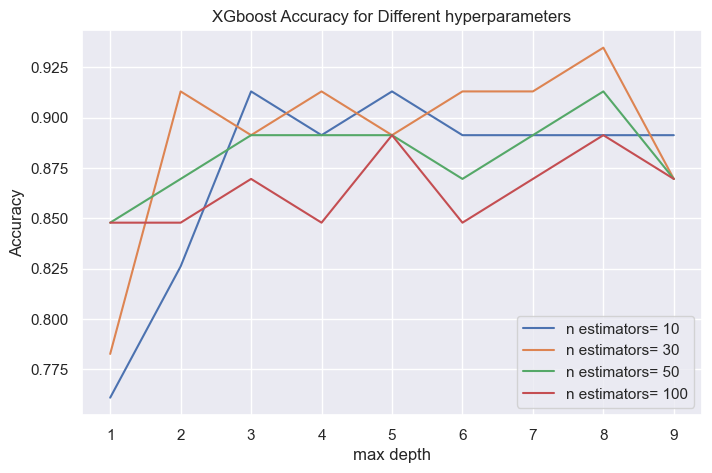

In [56]:
n_estimators_list = [10,30,50,100]
max_depth_list = range(1,10)

scores = {'n_estimators': [], 'max_depth': [], 'accuracy': []}
scores_df = pd.DataFrame(scores)

for i, n_estimators in enumerate(n_estimators_list):
    for j, max_depth in enumerate(max_depth_list):
        xgb_model = xgb.XGBClassifier(learning_rate= 0.1, n_estimators= n_estimators, max_depth= max_depth)
        xgb_model.fit(X_train, y_train)
        
        accuracy = xgb_model.score(X_test, y_test)
        new_row = {'n_estimators': n_estimators, 'max_depth': max_depth, 'accuracy': accuracy}
        scores_df.loc[i*len(max_depth_list) + j] = new_row

plt.figure(figsize=(8, 5))
for n_estimators in n_estimators_list:
    sub_scores_df = scores_df[scores_df['n_estimators'] == n_estimators]
    plt.plot(sub_scores_df['max_depth'], sub_scores_df['accuracy'], label=f'n estimators= {n_estimators}')

sns.set_theme() 
plt.title('XGboost Accuracy for Different hyperparameters')
plt.xlabel('max depth')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [71]:
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [10, 20, 30],
    'max_depth': [6, 7, 8, 9, 10, 11],
}

xgb_model = xgb.XGBClassifier()
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_train, y_train)

best_xgb_model = grid_search.best_estimator_
best_xgb_params = grid_search.best_params_

xgb_predictions = best_xgb_model.predict(X_validation)
xgb_accuracy = accuracy_score(y_validation, xgb_predictions)

print(f"Optimized XGboost Model Accuracy: {xgb_accuracy:.4f}")
print("Best Parameters:", best_xgb_params)



Optimized XGboost Model Accuracy: 0.8667
Best Parameters: {'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 30}


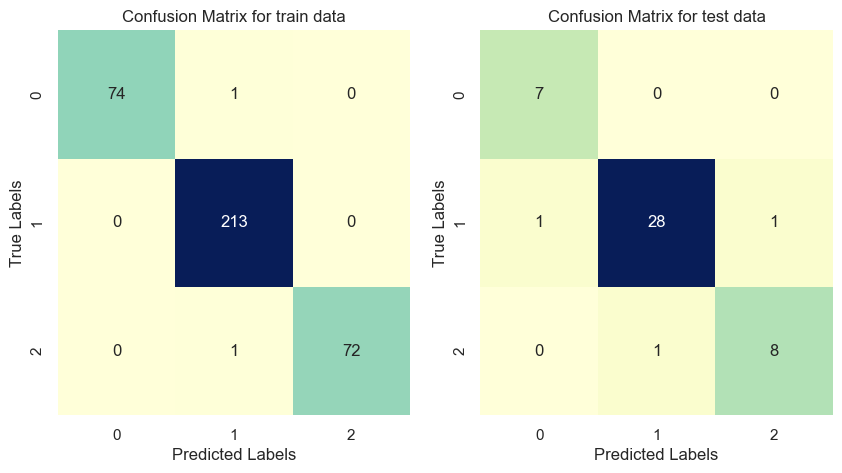

,accuracy score,precision score,recall score,f1 score
Train,0.994460,0.994511,0.994460,0.994454
Test,0.934783,0.936750,0.934783,0.934955


In [74]:
labels = [0, 1 ,2]
xgb_model = xgb.XGBClassifier(**best_xgb_params)
xgb_model.fit(X_train, y_train)

y_pred_train = xgb_model.predict(X_train)
cm_train = get_confusion_matrix(y_train, y_pred_train, labels)

y_pred_test = xgb_model.predict(X_test)
cm_test = get_confusion_matrix(y_test, y_pred_test, labels)

plot_heatmap(cm_train, cm_test, labels)
accuracy_df = make_df_for_scores(y_train, y_pred_train, y_test, y_pred_test)
accuracy_df

<a id='phase6'></a>

<h1 style = "color:red;font-size:30px" dir = "ltr"> <b>
    Phase VI: Evaluation of models
</b> </h1>

We employ the below functions such as Accuracy, Precision, Recall, and F1 Score calculations to evaluate and analyze the model's performance. These metrics will not only provide a comprehensive understanding of the model's effectiveness but also pinpoint critical areas for enhancement.

- **Accuracy**: Accuracy is a fundamental metric used in machine learning to evaluate the performance of classification models. It measures the proportion of correct predictions made by a model out of all predictions. In binary classification, accuracy is calculated as the sum of true positives (TP) and true negatives (TN) divided by the total number of predictions, which includes true positives, true negatives, false positives, and false negatives. This metric provides a straightforward indication of a model's overall correctness, indicating how often the classifier is correct. However, it's important to note that accuracy alone may not fully capture the model's effectiveness, especially in scenarios with imbalanced classes or when the costs of different types of errors vary significantly.

$$ \text{Accuracy} = \frac{TN + TP}{TN + FP + TP + FN} $$

- **Precision**: Precision is a critical metric in machine learning that measures the proportion of true positive predictions among all positive predictions made by a model. It is calculated as the ratio of true positives (TP) to the sum of true positives and false positives (FP). This metric is particularly important in scenarios where the cost of false positives is high, as it provides a clear indication of the model's ability to correctly identify positive instances without generating false alarms. Precision is essential for evaluating the quality of positive predictions, ensuring that the model's positive identifications are indeed accurate.

$$ \text{Precision} = \frac{TP}{TP + FP}  $$

- **Recall**: Recall, also known as sensitivity or the true positive rate (TPR), is a metric used in machine learning to measure the proportion of actual positive instances that are correctly identified by the model. It is calculated by dividing the number of true positives (TP) by the sum of true positives and false negatives (FN). This metric is particularly important in scenarios where the cost of missing a positive instance (false negative) is high. Recall provides insight into the model's ability to capture all relevant instances, ensuring that no positive cases are overlooked.

$$ \text{Recall} = \frac{TP}{TP + FN} $$

- **F1 score**: The F1 score is a machine learning evaluation metric that combines precision and recall to provide a balanced measure of a model's accuracy. It is particularly useful in scenarios where both false positives and false negatives are important considerations, offering a comprehensive view of a model's performance by harmonizing the trade-off between these two metrics. The F1 score is calculated as the harmonic mean of precision and recall, with a higher score indicating a better quality classifier. 

$$ \text{F1 score} = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}} $$

Calculating Accuracy, Precision, Recall, and F1 Score can be more challenging for multi-class classification problems compared to binary classification because In binary classification, there are only two possible outcomes (positive or negative). Accuracy simply measures the proportion of correct predictions. However, in multi-class problems (like recognizing 10 classs), a single incorrect prediction can be confused with any of the other 9 classes.

Here are some solutions:

1.  **Per-Class Evaluation**: To address this, we need to evaluate the performance for each individual class. By calculating these metrics for each class, we can identify which numbers the model struggles with and tailor improvements accordingly.
    
    Here's how to calculate the metrics for each class in our system:

    - **Confusion Matrix**: This matrix shows how often instances of each class were predicted as each other class. It provides a clear view of classification errors for each class.

    - **Precision**:  For each class (class), Precision is the ratio of correctly identified examples of that class to the total number of predictions assigned to that class (including incorrect ones).

    - **Recall**:  For each class, Recall is the ratio of correctly identified examples of that class to the total number of actual occurrences of that class in the test data.

    - **F1 Score**:  This metric combines Precision and Recall for each class, providing a balanced view of performance. It's calculated as the harmonic mean of the two.

2. **Macro vs. Micro vs. Weighted Averaging**:  We can calculate average Precision, Recall, and F1 Score across all classes. 

    There are three main ways to do this:

    - **Macro Averaging**: This simply averages the individual class scores, giving equal weight to each class regardless of its frequency in the data.

    $$ \text{Accuracy Macro Avg} = \frac{\sum_{i=1}^{n} \text{Accuracy}_i}{n} $$

    $$ \text{Precision Macro Avg} = \frac{\sum_{i=1}^{n} \text{Precision}_i}{n} $$

    $$ \text{Recall Macro Avg} = \frac{\sum_{i=1}^{n} \text{Recall}_i}{n} $$
    
    $$ \text{F1 score Macro Avg} = \frac{\sum_{i=1}^{n} \text{F1 score}_i}{n} $$

    - **Micro Averaging**: This considers the total number of correct predictions and total number of examples across all classes. It might be more relevant if some classes are more frequent in dataset.

    $$  \text{Accuracy Micro Avg} = \frac{\sum_{i=1}^{n} TN_i + TP_i}{\sum_{i=1}^{n} TN_i + FP_i + TP_i + FN_i} $$

    $$  \text{Precision Micro Avg} = \frac{\sum_{i=1}^{n} TP_i}{\sum_{i=1}^{n} TP_i + \sum_{i=1}^{n} FP_i} $$

    $$  \text{Recall Micro Avg} = \frac{\sum_{i=1}^{n} TP_i}{\sum_{i=1}^{n} TP_i + \sum_{i=1}^{n} FN_i}  $$

    $$ 
    \text{F1 score Micro Avg} = 2 \times \frac{\text{Precision Micro Avg} \times \text{Recall Micro Avg}}{\text{Precision Micro Avg} + \text{Recall Micro Avg}} 
    $$

    - **Weighted Averaging**: Similar to macro averaging but multiplies the metric for each class by its support and then divides by the total support.

    $$ \text{Accuracy Weighted Avg} = \frac{\sum_{i=1}^{n}  \text{support}_i \times \text{Accuracy}_i}{\sum_{i=1}^{n} \text{support}_i} $$

    $$ \text{Precision Weighted Avg} = \frac{\sum_{i=1}^{n}  \text{support}_i \times \text{Precision}_i}{\sum_{i=1}^{n} \text{support}_i}$$

    $$ \text{Recall Weighted Avg} = \frac{\sum_{i=1}^{n}  \text{support}_i \times \text{Recall}_i}{\sum_{i=1}^{n} \text{support}_i} $$
    
    $$ \text{F1 score Weighted Avg} = \frac{\sum_{i=1}^{n}  \text{support}_i \times \text{F1 score}_i}{\sum_{i=1}^{n} \text{support}_i} $$

By employing these solutions, we can effectively evaluate the performance of multi-class number recognition system using Accuracy, Precision, Recall, and F1 Score.

In [83]:
class Evaluate:
    def __init__(self,true_labels, predicted_labels, labels):
        self.true_labels = true_labels
        self.predicted_labels = predicted_labels
        self.labels = labels

        label_index = {label:i for i, label in enumerate(labels)}
        self.confusion_matrix = np.zeros((len(labels), len(labels)), dtype=int)
        for true_label, predicted_label in zip(true_labels, predicted_labels):
            self.confusion_matrix[label_index[true_label], label_index[predicted_label]] += 1

    def get_confusion_matrix(self):
        label_index = {label:i for i, label in enumerate(self.labels)}
        cm = np.zeros((len(self.labels), len(self.labels)), dtype=int)
        
        for true_label, predicted_label in zip(self.true_labels, self.predicted_labels):
            cm[label_index[true_label], label_index[predicted_label]] += 1
        return cm

    def plot_heatmap(self):
        sns.set_theme() 
        sns.heatmap(self.confusion_matrix, annot=True, fmt="d", cmap="YlGnBu", cbar=False, xticklabels=self.labels, yticklabels=self.labels)
        plt.xlabel("Predicted Labels")
        plt.ylabel("True Labels")
        plt.title("Confusion Matrix")
        plt.show()

    def calculate_accuracy(self, class_index):
        TP = self.confusion_matrix[class_index, class_index]   # True Positives
        TN = np.diag(self.confusion_matrix).sum() - TP         # True Negatives
        FP = self.confusion_matrix[:, class_index].sum() - TP  # False Positives
        FN = self.confusion_matrix[class_index, :].sum() - TP  # False Negatives

        return (TP + TN) / (TP + TN + FP + FN)

    def calculate_precision(self, class_index):
        TP = self.confusion_matrix[class_index, class_index]   # True Positives
        FP = self.confusion_matrix[:, class_index].sum() - TP  # False Positives

        if TP == 0:
            return 0
        return TP / (TP + FP)

    def calculate_recall(self, class_index):
        TP = self.confusion_matrix[class_index, class_index]   # True Positives
        FN = self.confusion_matrix[class_index, :].sum() - TP  # False Negatives

        return TP / (TP + FN)

    def calculate_F1_score(self, class_index):
        precision = self.calculate_precision(class_index)
        recall = self.calculate_recall(class_index)

        if precision + recall == 0:
            return 0
        return 2 * (precision * recall) / (precision + recall) 

    def calculate_micro_accuracy(self):
        true_positives = sum(diag for diag in np.diag(self.confusion_matrix))
        total_elements = np.sum(self.confusion_matrix)

        return true_positives / total_elements

    def calculate_micro_precision(self):
        true_positives = np.diag(self.confusion_matrix).sum()
        lower_triangle_indices = np.tril_indices_from(self.confusion_matrix, k=-1)
        false_positives = np.sum(self.confusion_matrix[lower_triangle_indices])

        return true_positives / (true_positives + false_positives)

    def calculate_micro_recall(self):
        true_positives = np.diag(self.confusion_matrix).sum()
        upper_triangle_indices = np.triu_indices(self.confusion_matrix.shape[0], k=1)
        false_negatives = np.sum(self.confusion_matrix[upper_triangle_indices])

        return true_positives / (true_positives + false_negatives)

    def calculate_micro_f1_score(self):
        precision_micro = self.calculate_micro_precision()
        recall_micro = self.calculate_micro_recall()

        return 2 * (precision_micro * recall_micro) / (precision_micro + recall_micro)

    def calculate_macro(self, function):
        data = [function(i) for i, label in enumerate(self.labels)]
        return np.mean(data)
    
    def calculate_Weighted(self, function):
        numerator = 0
        denominator = 0
        for i, label in enumerate(self.labels):
            # support = np.sum(self.confusion_matrix[i,:]) + np.sum(self.confusion_matrix[:,i]) - self.confusion_matrix[i,i]
            support = np.sum(self.confusion_matrix[i,:])
            numerator += support*function(i)
            denominator += support
        return numerator / denominator

    def evaluating_performance_of_models(self):
        print(f"class\t  |\tAccuracy\tPrecision\tRecall\t\tF1 Score")
        print("---------------------------------------------------------------------------")
        for index, label in enumerate(self.labels):
            accuracy = self.calculate_accuracy(index)
            precision = self.calculate_precision(index)
            recall = self.calculate_recall(index)
            f1_Score = self.calculate_F1_score(index)
            gap = "\t" if len(str(label)) < 8 else ""
            print(f"{label}{gap}  |\t{accuracy:.3f}\t\t{precision:.3f}\t\t{recall:.3f}\t\t{f1_Score:.3f}")

        print("\n\n")
        print(f"criteria  |\tMicro Avg\tMacro Avg\tWeighted Avg")
        print("---------------------------------------------------------------------------")
        print(f"Accuracy  |\t{self.calculate_micro_accuracy():.3f}\t\t{self.calculate_macro(self.calculate_accuracy):.3f}\t\t{self.calculate_Weighted(self.calculate_accuracy):.3f}")
        print(f"Precision |\t{self.calculate_micro_precision():.3f}\t\t{self.calculate_macro(self.calculate_precision):.3f}\t\t{self.calculate_Weighted(self.calculate_precision):.3f}")
        print(f"Recall\t  |\t{self.calculate_micro_recall():.3f}\t\t{self.calculate_macro(self.calculate_recall):.3f}\t\t{self.calculate_Weighted(self.calculate_recall):.3f}")
        print(f"F1 score  |\t{self.calculate_micro_f1_score():.3f}\t\t{self.calculate_macro(self.calculate_F1_score):.3f}\t\t{self.calculate_Weighted(self.calculate_F1_score):.3f}")

<a id='phase5'></a>

<h1 style = "color:red;font-size:30px" dir = "ltr"> <b>
    Phase V: Support Vector Machine
</b> </h1>

![Support Vector Machine](https://datatron.com/wp-content/uploads/2021/05/Support-Vector-Machine.png)

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    40.1. Classify your data using existing libraries with 2 RBF and Linear kernels.
</b> </h1>

In [84]:
X = df_standardized.drop(["MEDV", "Category"], axis=1)  
y = df_standardized["Category"]

# Split data into training and testing sets (80%/20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split test data into validating and testing sets (50%/50%)
X_validation, X_test, y_validation, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

In [85]:
svm_rbf = SVC(kernel='rbf', gamma= 1, C= 300)

# Train
svm_rbf.fit(X_train, y_train)

# Test
y_pred_rbf = svm_rbf.predict(X_test)

In [86]:
svm_linear = SVC(kernel='linear', C=300)

# Train
svm_linear.fit(X_train, y_train)

# Test
y_pred_linear = svm_linear.predict(X_test)

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    40.2. Report the confusion matrix as well as model evaluation criteria such as F1 score, accuracy, recall, ... and mention your analysis in the report.
</b> </h1>

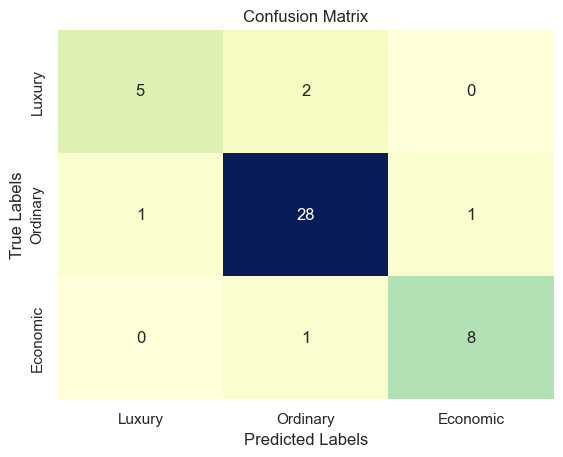

class	  |	Accuracy	Precision	Recall		F1 Score
---------------------------------------------------------------------------
Luxury	  |	0.932		0.833		0.714		0.769
Ordinary  |	0.891		0.903		0.933		0.918
Economic  |	0.953		0.889		0.889		0.889



criteria  |	Micro Avg	Macro Avg	Weighted Avg
---------------------------------------------------------------------------
Accuracy  |	0.891		0.926		0.910
Precision |	0.953		0.875		0.890
Recall	  |	0.932		0.846		0.891
F1 score  |	0.943		0.859		0.890


In [96]:
labels = ["Luxury", "Ordinary" ,"Economic"]
evaluate_svm_rbf = Evaluate(y_test, y_pred_rbf, labels)
evaluate_svm_rbf.plot_heatmap()
evaluate_svm_rbf.evaluating_performance_of_models()

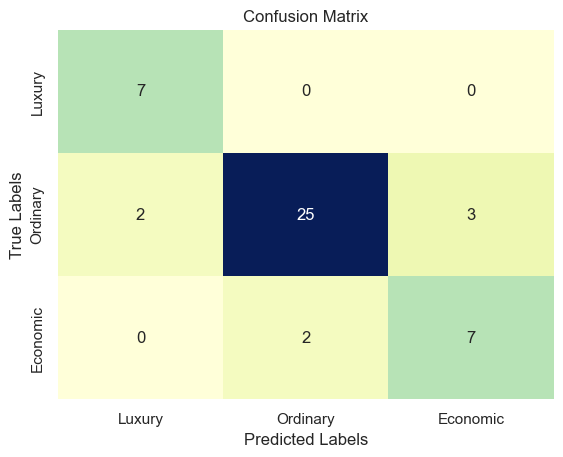

class	  |	Accuracy	Precision	Recall		F1 Score
---------------------------------------------------------------------------
Luxury	  |	0.951		0.778		1.000		0.875
Ordinary  |	0.848		0.926		0.833		0.877
Economic  |	0.886		0.700		0.778		0.737



criteria  |	Micro Avg	Macro Avg	Weighted Avg
---------------------------------------------------------------------------
Accuracy  |	0.848		0.895		0.871
Precision |	0.907		0.801		0.859
Recall	  |	0.929		0.870		0.848
F1 score  |	0.918		0.830		0.849


In [97]:
labels = ["Luxury", "Ordinary" ,"Economic"]
evaluate_svm_linear = Evaluate(y_test, y_pred_linear, labels)
evaluate_svm_linear.plot_heatmap()
evaluate_svm_linear.evaluating_performance_of_models()

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    40.3. Which of the Grid search and Random search methods is better to use here?
</b> </h1>

In my case, both GridSearchCV and RandomizedSearchCV could be viable options for hyperparameter tuning with SVM for my Boston housing data classification problem.

- **GridSearchCV**:

    - **Advantages**:

        - Provides a systematic exploration of the defined parameter grid, guaranteeing all combinations are evaluated.
        - Can be useful if we have a good understanding of the reasonable ranges for each hyperparameter.

    - **Disadvantages**:

        - Can be computationally expensive, especially for large datasets or many hyperparameters.
        - Might not be the most efficient approach if the search space is vast or we're unsure of good starting values.

- **RandomizedSearchCV**:

    - **Advantages**:

        - More efficient than GridSearchCV, especially with large datasets or many hyperparameters.
        - Less likely to get stuck in local optima due to the random sampling.

    - **Disadvantages**:

        - Doesn't guarantee evaluation of all possible combinations, so the optimal hyperparameters might be missed by chance.
        - Might require more tuning of the number of search iterations to ensure adequate exploration.

In conclusion, for the Boston housing data with SVM and potentially a moderate number of hyperparameters, both GridSearchCV and RandomizedSearchCV could be reasonable choices.

<h1 style = "color:green;font-size:20px" dir = "ltr"> <b>
    40.4. Now, using the two methods Random Search and Grid Search, respectively, for the desired interval and desired values, and for the two kernels, RBF and Linear, find your best classifier.
</b> </h1>

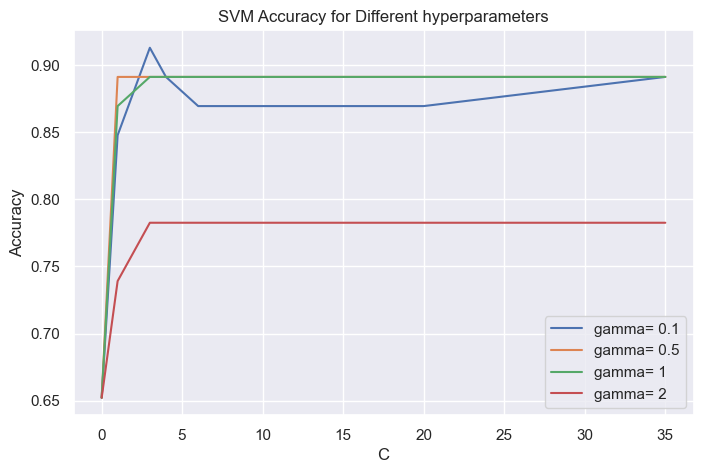

In [98]:
gamma_list = [0.1, 0.5, 1, 2]
C_list = [0.01, 1, 3, 4, 6, 10, 20, 35]

scores = {'gamma': [], 'C': [], 'accuracy': []}
scores_df = pd.DataFrame(scores)

for i, gamma in enumerate(gamma_list):
    for j, C in enumerate(C_list):
        svm_model = SVC(C= C, gamma= gamma, kernel= 'rbf')
        svm_model.fit(X_train, y_train)
        
        accuracy = svm_model.score(X_test, y_test)
        new_row = {'gamma': gamma, 'C': C, 'accuracy': accuracy}
        scores_df.loc[i*len(C_list) + j] = new_row

plt.figure(figsize=(8, 5))
for gamma in gamma_list:
    sub_scores_df = scores_df[scores_df['gamma'] == gamma]
    plt.plot(sub_scores_df['C'], sub_scores_df['accuracy'], label=f'gamma= {gamma}')

sns.set_theme() 
plt.title('SVM Accuracy for Different hyperparameters')
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [98]:
param_grid = {
    'C': [0.01, 1, 3, 4, 6, 10, 20, 35],
    'kernel': ['rbf', 'linear'],
    'gamma': [0.1, 0.5, 1, 2, 3],  # Adjust for RBF kernel
}

grid_search = GridSearchCV(estimator=SVC(), param_grid=param_grid, scoring='accuracy', cv=7)
grid_search.fit(X_train, y_train)

best_svm_model = grid_search.best_estimator_
best_svm_params = grid_search.best_params_

svm_predictions = best_svm_model.predict(X_validation)
svm_accuracy = accuracy_score(y_validation, svm_predictions)

print("GridSearchCV Best Parameters:", best_svm_params)
print("GridSearchCV Best Score:", svm_accuracy)

GridSearchCV Best Parameters: {'C': 3, 'gamma': 0.1, 'kernel': 'rbf'}
GridSearchCV Best Score: 0.8222222222222222


In [97]:
param_dist = {
    'C': np.random.uniform(0.001, 500, 100),
    'kernel': ['rbf', 'linear'],
    'gamma': np.random.uniform(0.001, 3, 100),  # Adjust for RBF kernel
}

random_search = RandomizedSearchCV(estimator=SVC(), param_distributions=param_dist, scoring='accuracy', cv=7, n_iter=100)
random_search.fit(X_train, y_train)

best_svm_model = random_search.best_estimator_
best_svm_param = random_search.best_params_

svm_predictions = best_svm_model.predict(X_validation)
svm_accuracy = accuracy_score(y_validation, svm_predictions)

print("RandomizedSearchCV Best Parameters:", best_svm_param)
print("RandomizedSearchCV Best Score:", svm_accuracy)

RandomizedSearchCV Best Parameters: {'kernel': 'linear', 'gamma': 1.06949548217995, 'C': 84.24321931662472}
RandomizedSearchCV Best Score: 0.8444444444444444


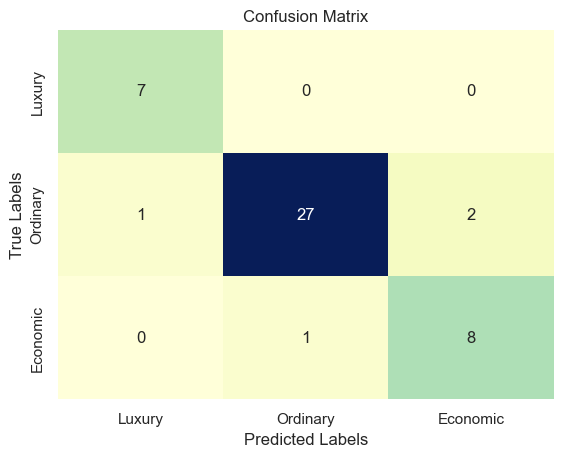

class	  |	Accuracy	Precision	Recall		F1 Score
---------------------------------------------------------------------------
Luxury	  |	0.977		0.875		1.000		0.933
Ordinary  |	0.913		0.964		0.900		0.931
Economic  |	0.933		0.800		0.889		0.842



criteria  |	Micro Avg	Macro Avg	Weighted Avg
---------------------------------------------------------------------------
Accuracy  |	0.913		0.941		0.927
Precision |	0.955		0.880		0.919
Recall	  |	0.955		0.930		0.913
F1 score  |	0.955		0.902		0.914


In [99]:
svm_best = SVC(**best_svm_params)
svm_best.fit(X_train, y_train)
y_pred_best = svm_best.predict(X_test)

labels = ["Luxury", "Ordinary" ,"Economic"]
evaluate_svm_best = Evaluate(y_test, y_pred_best, labels)
evaluate_svm_best.plot_heatmap()
evaluate_svm_best.evaluating_performance_of_models()

<a id='references'></a> 

<h1 style = "color:red;text-align: center;font-size:50px"> <b>
    References
</b> </h1>

https://medium.com/analytics-vidhya/oop-machinelearning-powerful-a9b936a8db48

https://www.simplilearn.com/data-analysis-methods-process-types-article

https://medium.com/almabetter/data-preprocessing-techniques-6ea145684812

https://medium.com/analytics-vidhya/understanding-polynomial-regression-5ac25b970e18

https://medium.com/@halfdeb/polynomial-regression-and-gradient-descent-a-comprehensive-guide-745bb5baabcf

https://medium.com/analytics-vidhya/linear-regression-and-polynomial-regression-using-normal-equation-method-c3929d71734d

https://www.analyticsvidhya.com/blog/2021/08/decision-tree-algorithm/#:~:text=Decision%20trees%20are%20a%20popular,the%20field%20of%20machine%20learning

https://www.analyticsvidhya.com/blog/2018/03/introduction-k-neighbours-algorithm-clustering/

https://www.spiceworks.com/tech/big-data/articles/what-is-support-vector-machine/

https://community.alteryx.com/t5/Data-Science/And-For-My-Next-Trick-An-Introduction-to-Support-Vector-Machines/ba-p/360762

https://medium.com/@niousha.rf/support-vector-regressor-theory-and-coding-exercise-in-python-ca6a7dfda927

https://medium.com/analytics-vidhya/confusion-matrix-accuracy-precision-recall-f1-score-ade299cf63cd